<h1><span style="color:blue">NVIDIA Next? Predicting Peaks and Spotting Sneaks in Stock Prices</span></h1>

<br></br>
### **Introduction**

#### **What is a Time Series??⏲📈**

Time-series is series of obeservations that are recorded over a period of time. these observations are dependent of time component which can not be neglected thus we have have to analysis the this data keeping time component in mind.

<br></br>

#### **Time Series Forecasting**

<!-- <div class="alert alert-block alert-info"> -->
    
Time series forecasting is parhaps one of the most common type of machine learning techniques used in real-world scenarios. `time-sereis forecsting refers to predicting future values from historical data by statical analysis of trends and patterns from certain time-series data.` it falls under unsupervised learning category but called as a self-supervised learning or supervised learning technique. time-series data can be much complex to find patterns out of it, this is because irregular component of time series.
</div>


<br></br>
#### **Motivation**

The motivation behind this project is to use deep learning for predicting the stock prices of Nvidia, which can be a complex and dynamic task. The goal is to develop supervised learning algorithms using Long Short-Term Memory networks (LSTMs) for time series forecasting. LSTM networks are particularly well-suited for financial time series data because they can capture long-term dependencies and patterns that are crucial for accurate predictions.

In conclusion, this paper presents a dataset of Nvidia’s stock prices and demonstrates the effectiveness of LSTM models in predicting financial markets. The dataset and the models can serve as a benchmark for developing more sophisticated financial forecasting systems, which can potentially help investors and financial analysts in making informed decisions.

<br></br>
### **Dataset Source**

The ”Nvidia Stock Price Dataset” For the experimental study, I downloaded live dataset, namely Nvidia, from the Yahoo Finance website [Yahoo Finance](https://finance.yahoo.com/quote/NVDA?.tsrc=fin-srch). The dataset includes historical stock price data for Nvidia over the past 10 years, enriched with several technical indicators to analyze market trends and stock performance. It details the date, as well as the opening, highest, lowest, and closing prices for each trading day, and also the volume of shares traded.

The Nvidia stock price dataset comprises 2518 samples. The data is first pre-processed to handle any missing values, normalize figures, and derive necessary technical indicators before being split into training and testing sets. Typically, 80% of the data is used for training the LSTM model, while the remaining 20% is reserved for validating/testing its performance. This split helps in evaluating the model’s effectiveness in predicting stock movements under varied market conditions. The input features pertain to certain fields: Open, High, Low, Close, Adj Close, Volume

<br></br>
### **Loading Python Libraries**

In [1]:
# Let's import the required python packages for next day rain predict
import numpy as np
import pandas as pd
import seaborn as sns
import yfinance as yf
import tensorflow as tf
import missingno as msno
import plotly.graph_objects as go
from sklearn.preprocessing import MinMaxScaler
from statsmodels.tsa.seasonal import seasonal_decompose

import matplotlib.pyplot as plt

%matplotlib inline

# Tensorflow/Keras imports
import tensorflow as tf
from keras.models import Sequential
from keras.callbacks import Callback
from keras.layers import Dense, LSTM

<br></br>
### **Importing the Data**

In [2]:
# Let's load the nvidia stock data into a dataframe using yfinance
nvidia_data_frame = yf.download("NVDA", period="12y", interval="1d")
nvidia_data_frame_viz = nvidia_data_frame.copy()

# Let's extract the day name and day of the week, and add them as columns to the nvidia_data_frame
nvidia_data_frame["day_name"] = nvidia_data_frame.index.day_name()
nvidia_data_frame["day_of_week"] = nvidia_data_frame.index.dayofweek

# Let's take a quick look at the shape of the dataframe
print("NVIDIA stock data shape -->", nvidia_data_frame.shape)
print()

# Let's take a brief look at the contents of the nvidia dataframe
nvidia_data_frame.head(10).style.set_properties(
    **{"background-color": "black", "color": "lawngreen", "border": "1.5px  white"}
)

[*********************100%%**********************]  1 of 1 completed

NVIDIA stock data shape --> (3019, 8)



,Open,High,Low,Close,Adj Close,Volume,day_name,day_of_week
Date,,,,,,,,
2012-05-02 00:00:00,3.295000,3.307500,3.195000,3.212500,2.946832,68400800,Wednesday,2
2012-05-03 00:00:00,3.220000,3.240000,3.137500,3.157500,2.896382,41953600,Thursday,3
2012-05-04 00:00:00,3.137500,3.155000,3.065000,3.065000,2.811532,54509200,Friday,4
2012-05-07 00:00:00,3.120000,3.172500,3.092500,3.117500,2.859690,60444000,Monday,0
2012-05-08 00:00:00,3.090000,3.135000,3.035000,3.115000,2.857396,46231200,Tuesday,1
2012-05-09 00:00:00,3.060000,3.152500,3.030000,3.127500,2.868862,52060800,Wednesday,2
2012-05-10 00:00:00,3.157500,3.162500,3.055000,3.105000,2.848224,59709200,Thursday,3
2012-05-11 00:00:00,3.362500,3.420000,3.290000,3.302500,3.029390,143514000,Friday,4
2012-05-14 00:00:00,3.275000,3.332500,3.207500,3.282500,3.011045,43747200,Monday,0


<br></br>
### **Gaining Insights from Data**

In [3]:
# Let's obtain a brief overview of the nvidia stock dataframe
nvidia_data_frame.info()

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 3019 entries, 2012-05-02 to 2024-05-01
Data columns (total 8 columns):
 #   Column       Non-Null Count  Dtype  
---  ------       --------------  -----  
 0   Open         3019 non-null   float64
 1   High         3019 non-null   float64
 2   Low          3019 non-null   float64
 3   Close        3019 non-null   float64
 4   Adj Close    3019 non-null   float64
 5   Volume       3019 non-null   int64  
 6   day_name     3019 non-null   object 
 7   day_of_week  3019 non-null   int32  
dtypes: float64(5), int32(1), int64(1), object(1)
memory usage: 200.5+ KB


In [4]:
# Let's get max range of stocks dataset
delta = nvidia_data_frame.index.max() - nvidia_data_frame.index.min()
print("Time range of stocks dataset --> ", delta)

Time range of stocks dataset -->  4382 days 00:00:00


<br></br>

In [5]:
# Let's see descriptive statistics for all numeric columns
nvidia_data_frame.describe()

,Open,High,Low,Close,Adj Close,Volume,day_of_week
count,3019.000000,3019.000000,3019.000000,3019.000000,3019.000000,3.019000e+03,3019.000000
mean,105.491793,107.405847,103.479915,105.535227,105.266906,4.509939e+07,2.024843
std,159.808699,162.713262,156.569165,159.744254,159.795423,2.457248e+07,1.399036
min,2.872500,2.907500,2.787500,2.845000,2.609724,4.564400e+06,0.000000
25%,5.368750,5.457500,5.276250,5.367500,5.186090,2.938800e+07,1.000000
50%,43.174999,43.639999,42.474998,42.990002,42.587681,3.984680e+07,2.000000
75%,138.778748,140.826248,136.008751,138.275002,137.940536,5.409945e+07,3.000000
max,958.510010,974.000000,935.099976,950.020020,950.020020,3.692928e+08,4.000000


#### **Observations**

1. On average, NVIDIA's stock price opened around `$124.41` and closed very close to that average at `$124.46`, indicating there wasn't typically a huge swing in price from the opening to closing on a day-to-day basis.
   
2. The lowest closing price for NVIDIA's stock was `$4.20`, which is significantly lower than the average, highlighting that the stock has seen substantial growth since its lowest point.

3. The volume of stocks traded varied widely, but on average about `46.4 million` shares were traded each day, with the busiest day seeing over 369 million shares changing hands.

<br></br>
#### **See how many missing data points we have**

In [6]:
# Let's get the number of missing data points per column
nvidia_data_frame.isnull().sum()

Open           0
High           0
Low            0
Close          0
Adj Close      0
Volume         0
day_name       0
day_of_week    0
dtype: int64

<br></br>
#### **Missing data points visualization**

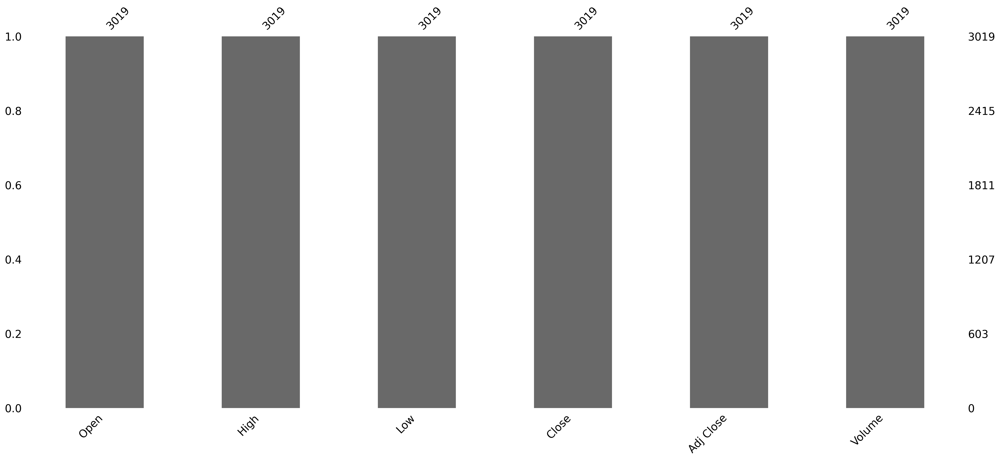

In [318]:
# Let's set the figure size
plt.figure(figsize=(10, 5), dpi=300)

# Let's visualize the missing points using barplot
msno.bar(nvidia_data_frame_viz.iloc[:, :6])
plt.show()

<br></br>
### **Data Visualizations(Distributions)**

<br></br>
#### **Closing stock price & maximum price during 12 years**

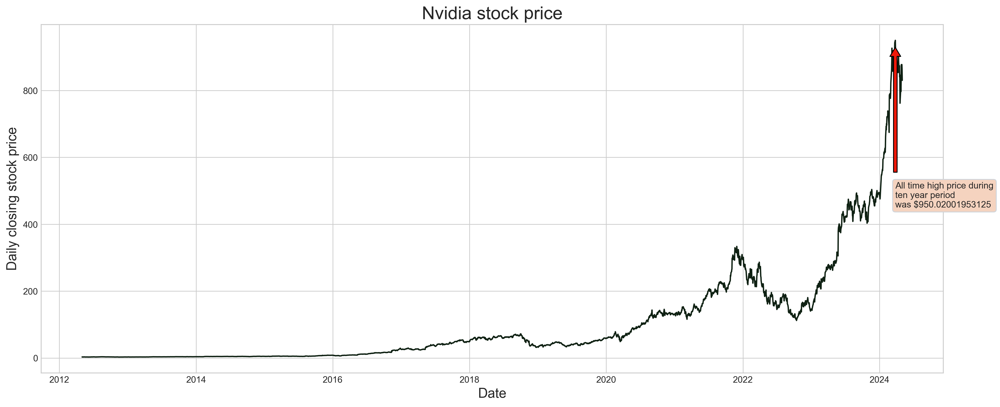

In [668]:
# Set the size and background color of the plot to be displayed.
plt.figure(figsize=(18, 7), dpi=300)

# Find the highest closing stock price and the corresponding date over the past 5 years.
high = nvidia_data_frame_viz["Close"].max()
datetime = nvidia_data_frame_viz[nvidia_data_frame_viz["Close"] == high].index.values

# Plot the closing stock prices of Nvidia over time with a specific line color.
plt.plot(nvidia_data_frame_viz.index, nvidia_data_frame_viz["Close"], color="#0f2113")
plt.title(f"Nvidia stock price", fontsize=20)
plt.xlabel("Date", fontsize=15)
plt.ylabel("Daily closing stock price", fontsize=15)

# Locate the highest closing price on the plot and create an annotation.
plt.annotate(
    f"All time high price during\nten year period\nwas ${high}",
    xy=(datetime, high),
    xytext=(datetime, high - 500),
    bbox=dict(boxstyle="round", facecolor="#f5d3bf", edgecolor="#d0d5db"),
    arrowprops=dict(facecolor="#f0190a", headlength=10, shrink=0.05),
)

# Display the plot with all the features set above.
plt.savefig("plots/closing_price_plot.png", dpi=300)
plt.show()

<br></br>
#### **Nvidia - Monthly and Yearly Stock Trends**

In [320]:
# Let's get monthly averages of nvidia data_frame
monthly_avg = nvidia_data_frame_viz["Close"].resample("M").mean()

# Let's get yearly averages of nvidia data_frame
yearly_avg = nvidia_data_frame_viz["Close"].resample("A").mean()

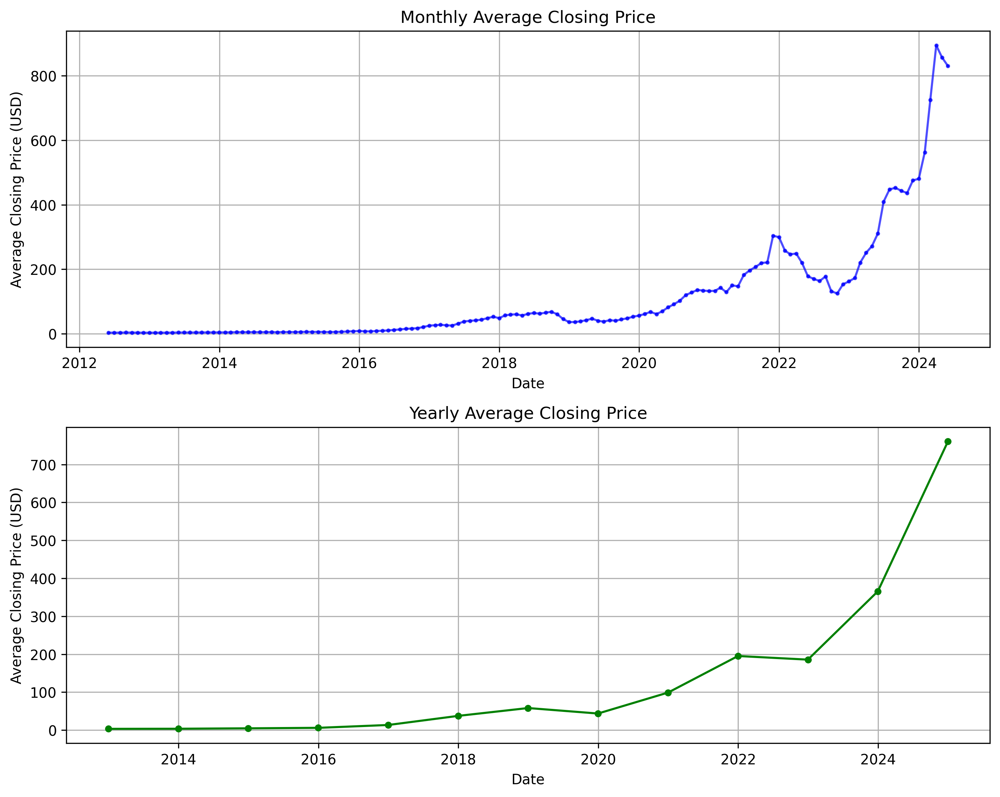

In [331]:
# Create a figure and a set of subplots
fig, ax = plt.subplots(
    2, 1, figsize=(10, 8), dpi=300
)  # 2 rows, 1 column, figure size of 10x8 inches

# Monthly averages plot
ax[0].plot(
    monthly_avg.index,
    monthly_avg,
    color="blue",
    marker="o",
    linestyle="-",
    markersize=2,
    alpha=0.7,
)
ax[0].set_title("Monthly Average Closing Price")
ax[0].set_xlabel("Date")
ax[0].set_ylabel("Average Closing Price (USD)")
ax[0].grid(True)

# Yearly averages plot
ax[1].plot(
    yearly_avg.index, yearly_avg, color="green", marker="o", linestyle="-", markersize=4
)
ax[1].set_title("Yearly Average Closing Price")
ax[1].set_xlabel("Date")
ax[1].set_ylabel("Average Closing Price (USD)")
ax[1].grid(True)

# Improve layout and show the plot
plt.tight_layout()
plt.show()

<br></br>
### **Decomposition of Nvidia Stock Prices into Trend, Seasonality, and Residual Components**

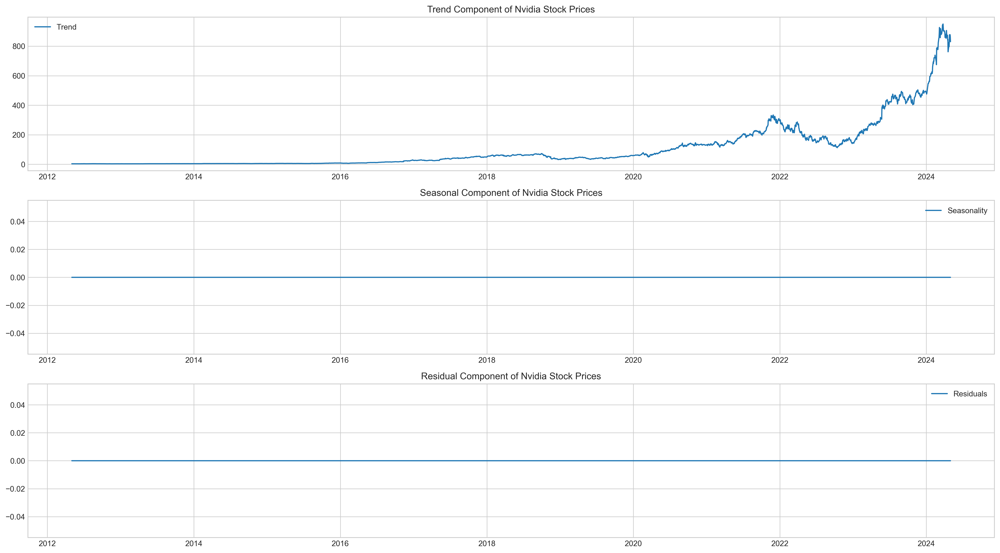

In [686]:
# Decomposing the time series using the Close prices
result = seasonal_decompose(
    nvidia_data_frame_viz["Close"], model="additive", period=1
)  # 'period' depends on expected cyclic behavior

# Plotting the decomposed components of the time series
plt.figure(figsize=(18, 10), dpi=300)
plt.subplot(311)
plt.plot(result.trend, label="Trend")
plt.title("Trend Component of Nvidia Stock Prices")
plt.legend(loc="best")

plt.subplot(312)
plt.plot(result.seasonal, label="Seasonality")
plt.title("Seasonal Component of Nvidia Stock Prices")
plt.legend(loc="best")

plt.subplot(313)
plt.plot(result.resid, label="Residuals")
plt.title("Residual Component of Nvidia Stock Prices")
plt.legend(loc="best")

plt.tight_layout()
plt.savefig("plots/trend_seasonality_noise.png")
plt.show()

<br></br>
#### **Investigating Nvidia Stock Prices During Peak Periods in 2022 and 2024**

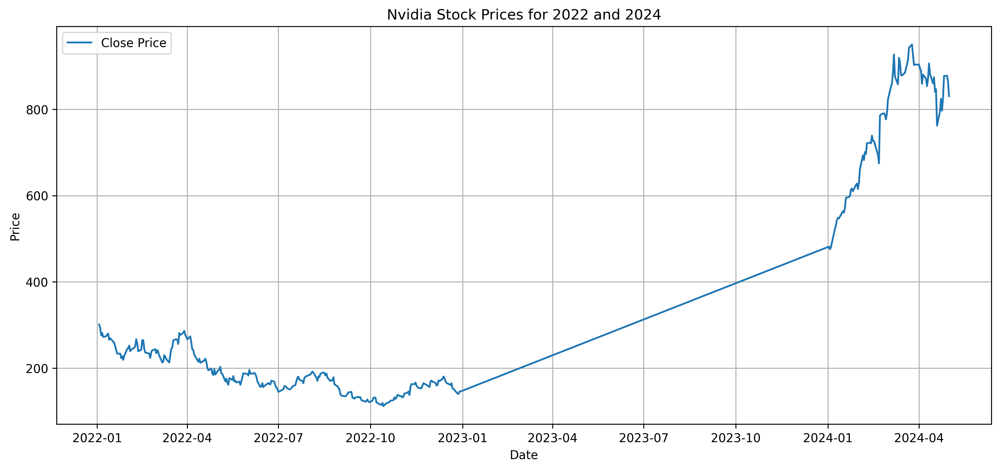

In [308]:
# Let's filter out the data_frame from year 2022 to 204
nvidia_2022_2024 = nvidia_data_frame_viz[
    nvidia_data_frame_viz.index.year.isin([2022, 2024])
]

# Set up the size and layout of the plot
plt.figure(figsize=(14, 6), dpi=300)
# Plot the closing prices on the plot, with a label for identification
plt.plot(nvidia_2022_2024["Close"], label="Close Price")
# # Plot the highest prices of the day on the plot, with a label for identification
# plt.plot(nvidia_2022_2024['High'], label='High Price')


# Add a title to the plot, which gives a general idea of what the data represents
plt.title("Nvidia Stock Prices for 2022 and 2024")
# Label the x-axis as 'Date' which shows the timeline
plt.xlabel("Date")
# Label the y-axis as 'Price' to indicate what the numbers on the y-axis represent
plt.ylabel("Price")
plt.legend()

# Add a grid to the background of the plot to improve readability of the graph
plt.grid(True)
plt.show()

<br></br>
#### **Investigating Nvidia Stock Prices During Peak Periods in 2023 and 2024**

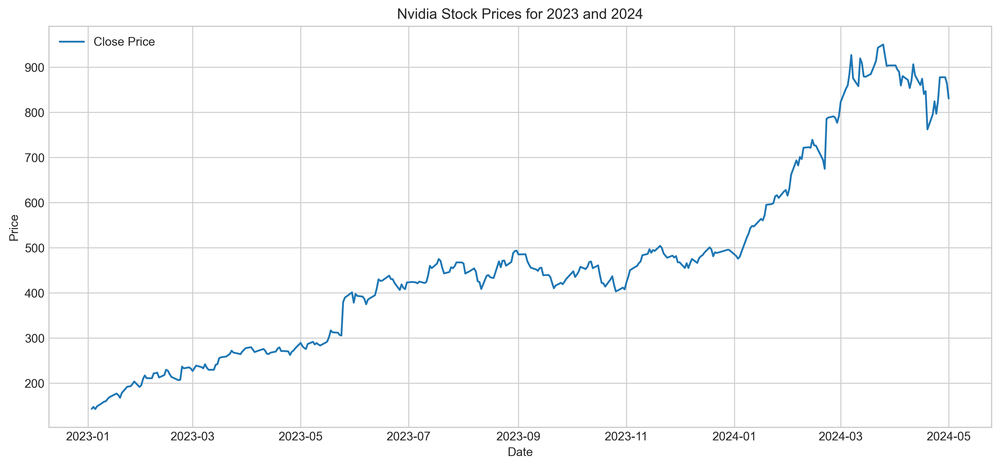

In [670]:
# Let's filter out the data_frame from year 2022 to 204
nvidia_2023_2024 = nvidia_data_frame_viz[
    nvidia_data_frame_viz.index.year.isin([2023, 2024])
]

# Set up the size and layout of the plot
plt.figure(figsize=(14, 6), dpi=300)
# Plot the closing prices on the plot, with a label for identification
plt.plot(nvidia_2023_2024["Close"], label="Close Price")
# # Plot the highest prices of the day on the plot, with a label for identification
# plt.plot(nvidia_2022_2024['High'], label='High Price')


# Add a title to the plot, which gives a general idea of what the data represents
plt.title("Nvidia Stock Prices for 2023 and 2024")
# Label the x-axis as 'Date' which shows the timeline
plt.xlabel("Date")
# Label the y-axis as 'Price' to indicate what the numbers on the y-axis represent
plt.ylabel("Price")
plt.legend()

# Add a grid to the background of the plot to improve readability of the graph
# plt.grid(True)
plt.savefig("plots/2023_2024_stock_price.png")
plt.show()

<br></br>
#### **Trade volume of Nvidia stock over a period of 2014-2024**

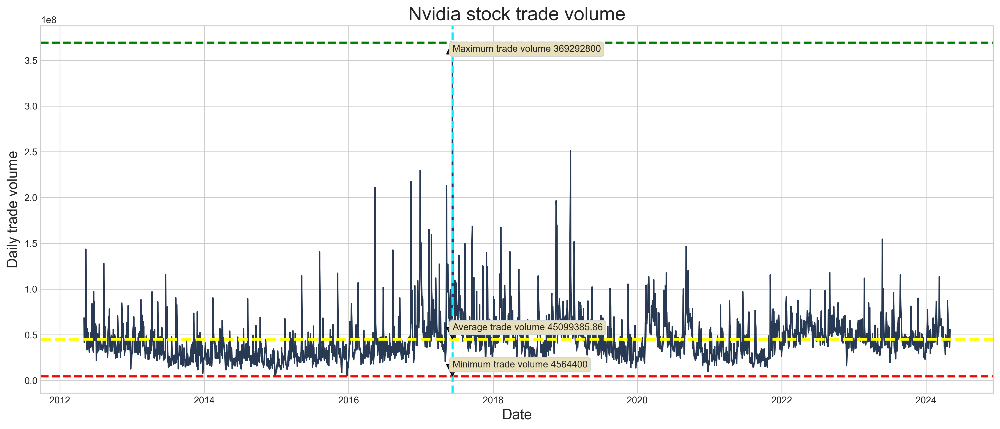

In [679]:
# Calculate the average, maximum, and minimum trade volume.
ave_y = nvidia_data_frame_viz["Volume"].mean()
max_y = nvidia_data_frame_viz["Volume"].max()
min_y = nvidia_data_frame_viz["Volume"].min()

# Set the figure size and background color.
plt.figure(figsize=(18, 7), dpi=300)

# Plot the trade volume data.
plt.plot(
    nvidia_data_frame_viz.index, nvidia_data_frame_viz["Volume"], color="#283954"
)  # Using the index as the date.
plt.title(f"Nvidia stock trade volume", fontsize=20)
plt.xlabel("Date", fontsize=15)
plt.ylabel("Daily trade volume", fontsize=15)

# Add horizontal lines for max, min, and average trade volumes.
plt.axhline(y=max_y, linestyle="--", lw=2.2, color="green")
plt.axhline(y=min_y, linestyle="--", lw=2.2, color="red")
plt.axhline(y=ave_y, linestyle="--", lw=2.8, color="yellow")

# Find the date for the maximum trade volume.
max_vol_date = nvidia_data_frame_viz[nvidia_data_frame_viz["Volume"] == max_y].index[0]

# Add a vertical line for the date with maximum trade volume.
plt.axvline(x=max_vol_date, linestyle="--", lw=2.2, color="#0aebff")

#Add annotations for average, maximum, and minimum trade volumes.
plt.annotate(
    f"Average trade volume {round(ave_y,2)}",
    xy=(max_vol_date, ave_y),
    xytext=(max_vol_date, ave_y + 10000000),
    bbox=dict(boxstyle="round", facecolor="#e8e0ba", edgecolor="#d0d5db"),
    arrowprops=dict(facecolor="#333333", shrink=0.05),
)

plt.annotate(
    f"Maximum trade volume {max_y}",
    xy=(max_vol_date, max_y),
    xytext=(max_vol_date, max_y - 10000000),
    bbox=dict(boxstyle="round", facecolor="#e8e0ba", edgecolor="#d0d5db"),
    arrowprops=dict(facecolor="#333333", shrink=0.05),
)

plt.annotate(
    f"Minimum trade volume {min_y}",
    xy=(max_vol_date, min_y),
    xytext=(max_vol_date, min_y + 10000000),
    bbox=dict(boxstyle="round", facecolor="#e8e0ba", edgecolor="#d0d5db"),
    arrowprops=dict(facecolor="#333333", shrink=0.05),
)

# Display the plot.
plt.savefig("plots/trade_volume.png")
plt.show()

<br></br>
#### **Moving average of the Nvidia stock**

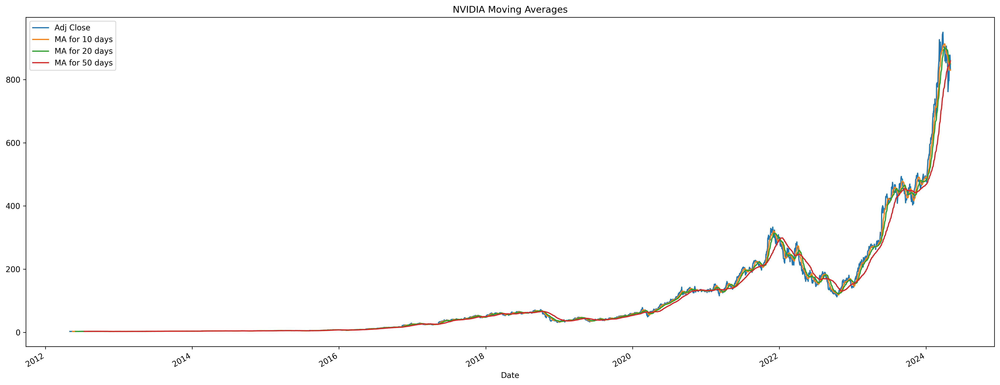

In [423]:
# List of moving average days
ma_day = [10, 20, 50]

# Compute moving averages for each specified day count in Nvidia_data_frame
for ma in ma_day:
    column_name = f"MA for {ma} days"
    nvidia_data_frame_viz[column_name] = (
        nvidia_data_frame_viz["Adj Close"].rolling(ma).mean()
    )

# Create a subplot figure for the moving averages
fig, ax = plt.subplots(dpi=300)
fig.set_figheight(7)
fig.set_figwidth(18)

# Plot the adjusted close price and moving averages
nvidia_data_frame_viz[
    ["Adj Close", "MA for 10 days", "MA for 20 days", "MA for 50 days"]
].plot(ax=ax)
ax.set_title("NVIDIA Moving Averages")

# Display the plot
plt.tight_layout()

<br></br>
#### **Daily return of the Nvidia stock on average**

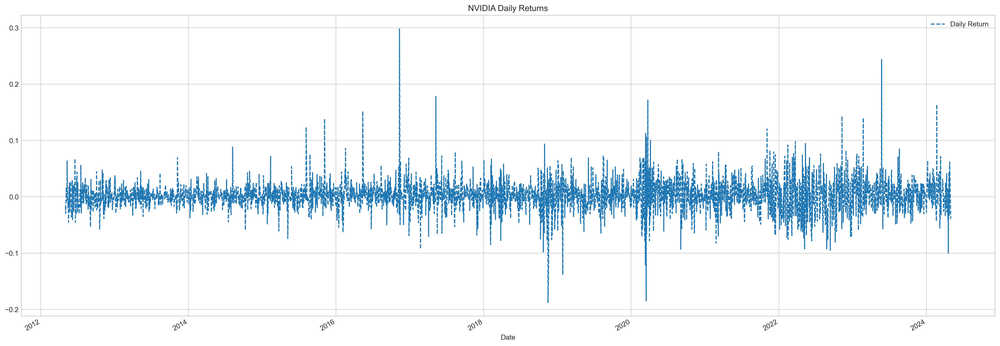

In [691]:
# Calculate the percent change for each day to find daily returns.
nvidia_data_frame_viz["Daily Return"] = nvidia_data_frame_viz["Adj Close"].pct_change()

# Create a single plot for the daily returns of NVIDIA.
fig, ax = plt.subplots(dpi=300)
fig.set_figheight(7)
fig.set_figwidth(20)

# Plot the daily return percentage with specific styling.
nvidia_data_frame_viz["Daily Return"].plot(ax=ax, legend=True, linestyle="--")
ax.set_title("NVIDIA Daily Returns")

# Properly layout the plot to handle subplots if necessary.
fig.tight_layout()

# Display the plot.
plt.savefig("plots/daily_returns.png")
plt.tight_layout()

<br></br>
#### **Candlestick charts of Nvidia stock**

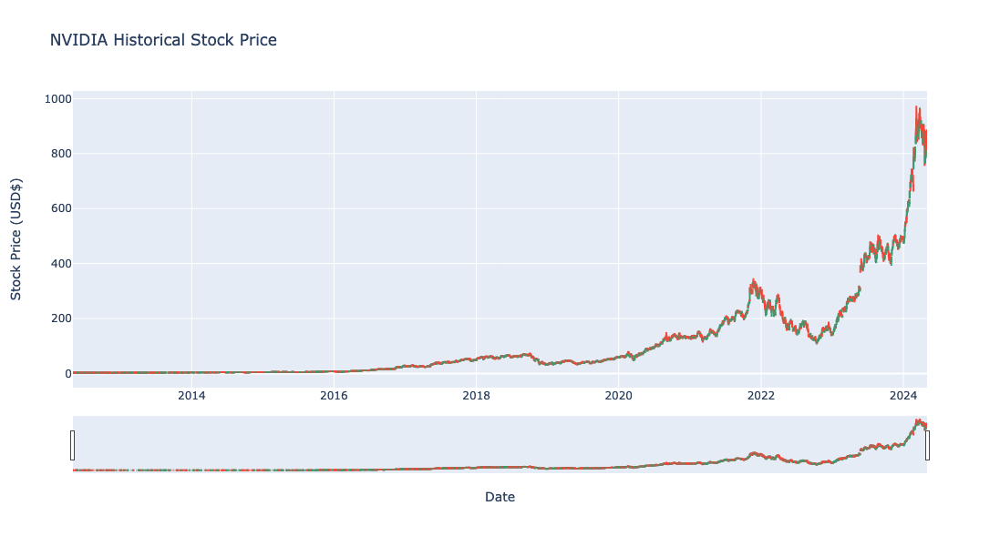

In [13]:
# Create a candlestick chart trace for NVIDIA using its stock data.
trace = go.Candlestick(
    x=nvidia_data_frame_viz.index,  # Use the DataFrame index for date
    open=nvidia_data_frame_viz["Open"],  # Opening price column
    high=nvidia_data_frame_viz["High"],  # Highest price column
    low=nvidia_data_frame_viz["Low"],  # Lowest price column
    close=nvidia_data_frame_viz["Close"],
)  # Closing price column

# Define the layout for the candlestick chart.
layout = {
    "title": f"NVIDIA Historical Stock Price",  # Title with NVIDIA's name
    "xaxis": {"title": "Date"},  # X-axis label
    "yaxis": {"title": "Stock Price (USD$)"},  # Y-axis label
}

# Combine the trace into a list to form the complete plot data.
data = [trace]

# Create the figure object with the data and layout defined above.
fig = go.Figure(data=data, layout=layout)
fig.update_layout(
    width=1100,  # Set the width of the figure (in pixels)
    height=600,  # Set the height of the figure (in pixels)
    xaxis_rangeslider_visible=True,
)
fig.show()  # Display the plot

<br></br>
### **Data Cleaning**

In [14]:
# Let's drop the unnecessary columns such as Open, High, Low, Adj Close, and Volume,
# since our objective is to predict NVIDIA's future closing price.
nvidia_data_frame.drop(
    ["Open", "High", "Low", "Adj Close", "Volume", "day_name"], axis=1, inplace=True
)
# Let's take a quick look at the shape of the dataframe
print("NVIDIA stock data shape -->", nvidia_data_frame.shape)
print()

# Let's take a brief look at the contents of the nvidia dataframe
nvidia_data_frame.head(5).style.set_properties(
    **{"background-color": "black", "color": "lawngreen", "border": "1.5px  white"}
)

NVIDIA stock data shape --> (3019, 2)



,Close,day_of_week
Date,,
2012-05-02 00:00:00,3.212500,2
2012-05-03 00:00:00,3.157500,3
2012-05-04 00:00:00,3.065000,4
2012-05-07 00:00:00,3.117500,0
2012-05-08 00:00:00,3.115000,1


<br></br>
### **Data Normalization**

In [15]:
closing_price = nvidia_data_frame.filter(["Close"])

# Convert the 'Close' and 'day_of_week' column to a numpy array
closing_price_data = closing_price.values
day_of_week_data = nvidia_data_frame[["day_of_week"]].values

# Let's create a MinMaxScaler object with a feature range from 0 to 1
scaler = MinMaxScaler(feature_range=(0, 1))
scaler_day_of_week = MinMaxScaler(feature_range=(0, 1))

# Scale the dataset to fit within the feature range of 0 to 1 and assign the result to scaled_data
nvidia_data_frame.loc[:, "Close"] = scaler.fit_transform(closing_price)
nvidia_data_frame["day_of_week"] = scaler_day_of_week.fit_transform(day_of_week_data)

# Let's see few values of the scaled data
nvidia_data_frame.head(5).style.set_properties(
    **{"background-color": "black", "color": "lawngreen", "border": "1.5px  white"}
)

,Close,day_of_week
Date,,
2012-05-02 00:00:00,0.000388,0.500000
2012-05-03 00:00:00,0.000330,0.750000
2012-05-04 00:00:00,0.000232,1.000000
2012-05-07 00:00:00,0.000288,0.000000
2012-05-08 00:00:00,0.000285,0.250000


<br></br>
#### **Descriptive statisctics after normalization**

In [16]:
# Let's see descriptive statistics for all numeric columns after normalization
nvidia_data_frame.describe()

,Close,day_of_week
count,3019.000000,3019.000000
mean,0.108417,0.506211
std,0.168653,0.349759
min,0.000000,0.000000
25%,0.002663,0.250000
50%,0.042384,0.500000
75%,0.142983,0.750000
max,1.000000,1.000000


<br></br>
### **Data Preparation**

In [17]:
# Function to create sequences of 90/180 timesteps as inputs with the corresponding outputs
def create_windowed_df(data, period):
    # Initialize empty lists to hold the input and output parts of the training data
    X = []
    y = []
    # Loop over the training data to create sequences of 90/180 timesteps as inputs with the corresponding outputs
    for i in range(period, len(data)):
        X.append(
            data[i - period : i, 0]
        )  # Append the past 90/180 values as a single input sequence
        y.append(
            data[i, 0]
        )  # Append the current value as the output for the input sequence
    return X, y

In [18]:
# Get the number of rows to train the model on
training_data_len = int(np.ceil(len(nvidia_data_frame) * 0.8))
validation_data_len = int(np.ceil(len(nvidia_data_frame) * 0.9))


# Let's print the training data length
print("Length of Training Data -->", training_data_len)
print("Length of Validation Data -->", validation_data_len - training_data_len)
print("Lenagth of Test Data -->", len(nvidia_data_frame) - validation_data_len)

Length of Training Data --> 2416
Length of Validation Data --> 302
Lenagth of Test Data --> 301


<br></br>
#### **Data Splitting (3 months Window)**

In [19]:
# Extract the whole training subset from the Nvidia data frame
overall_data = nvidia_data_frame.values

overall_x_train_3_months, overall_y_train_3_months = create_windowed_df(
    overall_data, period=90
)

# Convert the list of input sequences and outputs into numpy arrays for machine learning processing
overall_x_train_3_months, overall_y_train_3_months = np.array(
    overall_x_train_3_months
), np.array(overall_y_train_3_months)

# Reshape the input data to fit the model's expected input shape (samples, timesteps, features)
overall_x_train_3_months = np.reshape(
    overall_x_train_3_months,
    (overall_x_train_3_months.shape[0], overall_x_train_3_months.shape[1], 1),
)

In [20]:
# Extract the whole training subset from the Nvidia data frame
train_data_3_months = overall_data[0 : int(training_data_len)]

x_train_3_months, y_train_3_months = create_windowed_df(train_data_3_months, period=90)

# Convert the list of input sequences and outputs into numpy arrays for machine learning processing
x_train_3_months, y_train_3_months = np.array(x_train_3_months), np.array(
    y_train_3_months
)

# Reshape the input data to fit the model's expected input shape (samples, timesteps, features)
x_train_3_months = np.reshape(
    x_train_3_months, (x_train_3_months.shape[0], x_train_3_months.shape[1], 1)
)

In [21]:
# Extract the whole training subset from the Nvidia data frame
validation_data_3_months = overall_data[
    int(training_data_len) : int(validation_data_len)
]

x_valid_3_months, y_valid_3_months = create_windowed_df(
    validation_data_3_months, period=90
)

# Convert the list of input sequences and outputs into numpy arrays for machine learning processing
x_valid_3_months, y_valid_3_months = np.array(x_valid_3_months), np.array(
    y_valid_3_months
)

# Reshape the input data to fit the model's expected input shape (samples, timesteps, features)
x_valid_3_months = np.reshape(
    x_valid_3_months, (x_valid_3_months.shape[0], x_valid_3_months.shape[1], 1)
)

In [22]:
# Extract the whole training subset from the Nvidia data frame
test_data_3_months = overall_data[int(validation_data_len) :]

x_test_3_months, y_test_3_months = create_windowed_df(test_data_3_months, period=90)

# Convert the list of input sequences and outputs into numpy arrays for machine learning processing
x_test_3_months, y_test_3_months = np.array(x_test_3_months), np.array(y_test_3_months)

# Reshape the input data to fit the model's expected input shape (samples, timesteps, features)
x_test_3_months = np.reshape(
    x_test_3_months, (x_test_3_months.shape[0], x_test_3_months.shape[1], 1)
)

<br></br>
#### **Data Splitting (6 months Window)**

In [23]:
# Extract the whole training subset from the Nvidia data frame
overall_data = nvidia_data_frame.values

overall_x_train_6_months, overall_y_train_6_months = create_windowed_df(
    overall_data, period=180
)

# Convert the list of input sequences and outputs into numpy arrays for machine learning processing
overall_x_train_6_months, overall_y_train_6_months = np.array(
    overall_x_train_6_months
), np.array(overall_y_train_6_months)

# Reshape the input data to fit the model's expected input shape (samples, timesteps, features)
overall_x_train_6_months = np.reshape(
    overall_x_train_6_months,
    (overall_x_train_6_months.shape[0], overall_x_train_6_months.shape[1], 1),
)

In [24]:
# Extract the whole training subset from the Nvidia data frame
train_data_6_months = overall_data[0 : int(training_data_len)]

x_train_6_months, y_train_6_months = create_windowed_df(train_data_6_months, period=180)

# Convert the list of input sequences and outputs into numpy arrays for machine learning processing
x_train_6_months, y_train_6_months = np.array(x_train_6_months), np.array(
    y_train_6_months
)

# Reshape the input data to fit the model's expected input shape (samples, timesteps, features)
x_train_6_months = np.reshape(
    x_train_6_months, (x_train_6_months.shape[0], x_train_6_months.shape[1], 1)
)

In [25]:
# Extract the whole training subset from the Nvidia data frame
validation_data_6_months = overall_data[
    int(training_data_len) : int(validation_data_len)
]

x_valid_6_months, y_valid_6_months = create_windowed_df(
    validation_data_6_months, period=180
)

# Convert the list of input sequences and outputs into numpy arrays for machine learning processing
x_valid_6_months, y_valid_6_months = np.array(x_valid_6_months), np.array(
    y_valid_6_months
)

# Reshape the input data to fit the model's expected input shape (samples, timesteps, features)
x_valid_6_months = np.reshape(
    x_valid_6_months, (x_valid_6_months.shape[0], x_valid_6_months.shape[1], 1)
)

In [26]:
# Extract the whole training subset from the Nvidia data frame
test_data_6_months = overall_data[int(validation_data_len) :]

x_test_6_months, y_test_6_months = create_windowed_df(test_data_6_months, period=180)

# Convert the list of input sequences and outputs into numpy arrays for machine learning processing
x_test_6_months, y_test_6_months = np.array(x_test_6_months), np.array(y_test_6_months)

# Reshape the input data to fit the model's expected input shape (samples, timesteps, features)
x_test_6_months = np.reshape(
    x_test_6_months, (x_test_6_months.shape[0], x_test_6_months.shape[1], 1)
)

<br></br>
#### **Let's see shapes of validation and test dataset(3 month window)**

In [27]:
print("Shape of input Training Data(3 month window)   -->", x_train_3_months.shape)
print("Shape of input Validation Data(3 month window) -->", x_valid_3_months.shape)
print("Shape of input Test Data (3 month window)      -->", x_test_3_months.shape)

Shape of input Training Data(3 month window)   --> (2326, 90, 1)
Shape of input Validation Data(3 month window) --> (212, 90, 1)
Shape of input Test Data (3 month window)      --> (211, 90, 1)


In [28]:
print("Shape of output Training Data(3 month window)   -->", y_train_3_months.shape)
print("Shape of output Validation Data(3 month window) -->", y_valid_3_months.shape)
print("Shape of output Test Data(3 month window)       -->", y_test_3_months.shape)

Shape of output Training Data(3 month window)   --> (2326,)
Shape of output Validation Data(3 month window) --> (212,)
Shape of output Test Data(3 month window)       --> (211,)


<br></br>
#### **Let's see shapes of validation and test dataset(6 month window)**

In [29]:
print("Shape of input Training Data(3 month window)   -->", x_train_6_months.shape)
print("Shape of input Validation Data(3 month window) -->", x_valid_6_months.shape)
print("Shape of input Test Data (3 month window)      -->", x_test_6_months.shape)

Shape of input Training Data(3 month window)   --> (2236, 180, 1)
Shape of input Validation Data(3 month window) --> (122, 180, 1)
Shape of input Test Data (3 month window)      --> (121, 180, 1)


In [30]:
print("Shape of output Training Data(3 month window)   -->", y_train_6_months.shape)
print("Shape of output Validation Data(3 month window) -->", y_valid_6_months.shape)
print("Shape of output Test Data(3 month window)       -->", y_test_6_months.shape)

Shape of output Training Data(3 month window)   --> (2236,)
Shape of output Validation Data(3 month window) --> (122,)
Shape of output Test Data(3 month window)       --> (121,)


<br></br>
### **Build a model to overfit on the entire dataset**

In [716]:
# Function to plot the loss and mean absolute error
def plot_loss_and_mae(model_name, model_history):
    figure, (ax1, ax2) = plt.subplots(
        1, 2, figsize=(18, 6), dpi=300
    )  # Define a figure with two subplots
    figure.suptitle(model_name)  # Set the title of the figure

    # Plot the loss over epochs on the first subplot
    ax1.plot(
        model_history.history["loss"], label="Loss", color="blue"
    )  # Plot the loss history
    ax1.set_title("Training Loss")  # Title for the loss plot
    ax1.set_xlabel("Epoch")  # Label for the x-axis
    ax1.set_ylabel("Loss")  # Label for the y-axis
    ax1.legend(loc="upper right")  # Legend positioned in the upper right

    # Plot the mean absolute error over epochs on the second subplot
    ax2.plot(
        model_history.history["mean_absolute_error"],
        label="Mean Absolute Error",
        color="green",
    )  # Plot the MAE history
    ax2.set_title("Training Mean Absolute Error")  # Title for the MAE plot
    ax2.set_xlabel("Epoch")  # Label for the x-axis
    ax2.set_ylabel("Mean Absolute Error")  # Label for the y-axis
    ax2.legend(loc="upper right")  # Legend positioned in the upper right
    plt.savefig("plots/best_overfitting_arch.png")
    plt.show()  # Show the plot

In [32]:
class PrintMetricsCallback(Callback):
    def __init__(self, print_validation=False):
        super().__init__()
        self.print_validation = print_validation

    # Define a callback to print metrics at the end of each epoch
    def on_epoch_end(self, epoch, logs=None):
        # Check if the epoch number plus one is divisible by 10 to print every 10 epochs, or it's the first epoch
        if (epoch + 1) % 10 == 0 or epoch == 0:
            output = f"Epoch {epoch + 1}: Loss = {logs['loss']:.4f}, MAE = {logs.get('mean_absolute_error', 'N/A'):.4f}"
            if self.print_validation:
                # Append validation metrics to the output string if flag is true
                output += f", Val Loss = {logs.get('val_loss', 'N/A'):.4f}, Val MAE = {logs.get('val_mean_absolute_error', 'N/A'):.4f}"
            print(output)

<br></br>
#### **Model Building with one LSTM layer and one Dense Layer (8-1) and 30 epochs 3 months window**

In [33]:
# Let's create a keras sequential model
model_8_1_30_3_months_overfit = Sequential()

# Let's add LSTM layer to the model network
model_8_1_30_3_months_overfit.add(
    LSTM(8, return_sequences=False, input_shape=(x_train_3_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_8_1_30_3_months_overfit.add(Dense(1))

In [34]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [35]:
# Let's fit the sequential model with input features and output label
history_8_1_30_3_months_overfit = model_8_1_30_3_months_overfit.fit(
    overall_x_train_3_months, overall_y_train_3_months, batch_size=1, epochs=30
)

Epoch 1/30
2929/2929 [==============================] - 21s 7ms/step - loss: 4.6071e-04 - mean_absolute_error: 0.0095
Epoch 2/30
2929/2929 [==============================] - 20s 7ms/step - loss: 1.3417e-04 - mean_absolute_error: 0.0069
Epoch 3/30
2929/2929 [==============================] - 20s 7ms/step - loss: 1.1416e-04 - mean_absolute_error: 0.0064
Epoch 4/30
2929/2929 [==============================] - 20s 7ms/step - loss: 9.7010e-05 - mean_absolute_error: 0.0059
Epoch 5/30
2929/2929 [==============================] - 20s 7ms/step - loss: 9.9265e-05 - mean_absolute_error: 0.0057
Epoch 6/30
2929/2929 [==============================] - 20s 7ms/step - loss: 9.2572e-05 - mean_absolute_error: 0.0056
Epoch 7/30
2929/2929 [==============================] - 20s 7ms/step - loss: 7.8645e-05 - mean_absolute_error: 0.0052
Epoch 8/30
2929/2929 [==============================] - 20s 7ms/step - loss: 8.0537e-05 - mean_absolute_error: 0.0052
Epoch 9/30
2929/2929 [==============================] - 

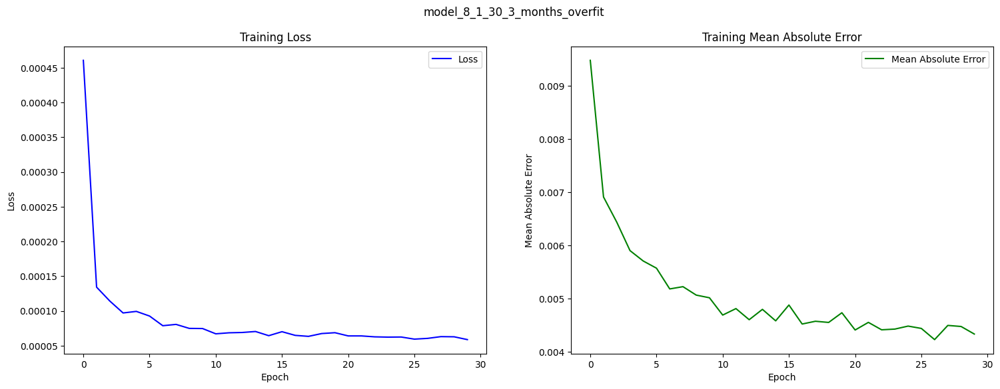

In [36]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_8_1_30_3_months_overfit",
    model_history=history_8_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the mean absolute error is decreasing gradually; one option to potentially decrease it further is to enhance the model's complexity by adding more or removing neurons/layers.

- 1 LSTM(8) 1 Dense(1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 5.8642e-05
- Mean Absolute Error: 0.0043

<br></br>
#### **Model Building with one LSTM layer and one Dense Layer (8-1) and 30 epochs 6 months window**

In [37]:
# Let's create a keras sequential model
model_8_1_30_6_months_overfit = Sequential()

# Let's add LSTM layer to the model network
model_8_1_30_6_months_overfit.add(
    LSTM(8, return_sequences=False, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_8_1_30_6_months_overfit.add(Dense(1))

In [38]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [39]:
# Let's fit the sequential model with input features and output label
history_8_1_30_6_months_overfit = model_8_1_30_6_months_overfit.fit(
    overall_x_train_6_months, overall_y_train_6_months, batch_size=1, epochs=30
)

Epoch 1/30
2839/2839 [==============================] - 38s 13ms/step - loss: 0.0045 - mean_absolute_error: 0.0246
Epoch 2/30
2839/2839 [==============================] - 37s 13ms/step - loss: 2.9035e-04 - mean_absolute_error: 0.0106
Epoch 3/30
2839/2839 [==============================] - 37s 13ms/step - loss: 1.9972e-04 - mean_absolute_error: 0.0085
Epoch 4/30
2839/2839 [==============================] - 37s 13ms/step - loss: 1.5518e-04 - mean_absolute_error: 0.0076
Epoch 5/30
2839/2839 [==============================] - 37s 13ms/step - loss: 1.3069e-04 - mean_absolute_error: 0.0069
Epoch 6/30
2839/2839 [==============================] - 37s 13ms/step - loss: 1.1599e-04 - mean_absolute_error: 0.0065
Epoch 7/30
2839/2839 [==============================] - 37s 13ms/step - loss: 9.8349e-05 - mean_absolute_error: 0.0060
Epoch 8/30
2839/2839 [==============================] - 37s 13ms/step - loss: 9.4472e-05 - mean_absolute_error: 0.0059
Epoch 9/30
2839/2839 [==============================

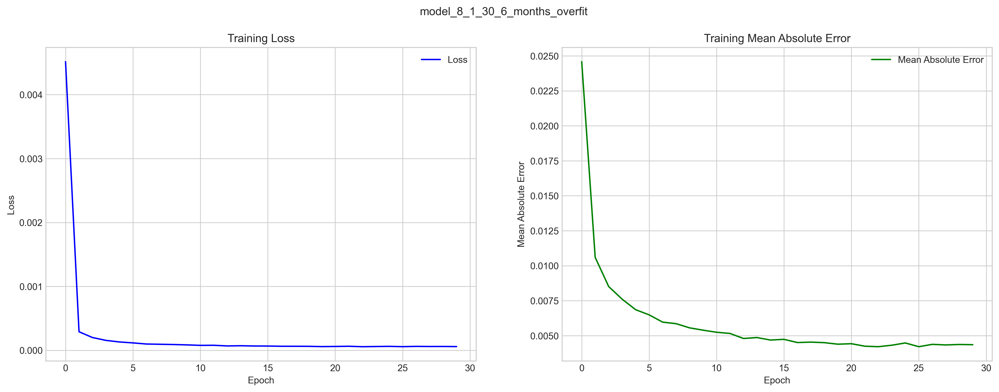

In [693]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_8_1_30_6_months_overfit",
    model_history=history_8_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the mean absolute error is decreasing gradually and is almost similar to the model trained with window data from the past three months. One option to potentially decrease it further is to enhance the model's complexity by adding or removing more layers or neurons.

- 1 LSTM(8) 1 Dense(1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 5.8490e-05
- Mean Absolute Error: 0.0044

<br></br>
#### **Model Building with one LSTM layer and one Dense Layer (64-1) and 30 epochs 3 months window**

In [41]:
# Let's create a keras sequential model
model_64_1_30_3_months_overfit = Sequential()

# Let's add LSTM layer to the model network
model_64_1_30_3_months_overfit.add(
    LSTM(64, return_sequences=False, input_shape=(x_train_3_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_64_1_30_3_months_overfit.add(Dense(1))

In [42]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_64_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [43]:
# Let's fit the sequential model with input features and output label
history_64_1_30_3_months_overfit = model_64_1_30_3_months_overfit.fit(
    overall_x_train_3_months, overall_y_train_3_months, batch_size=1, epochs=30
)

Epoch 1/30
2929/2929 [==============================] - 25s 8ms/step - loss: 4.0641e-04 - mean_absolute_error: 0.0103
Epoch 2/30
2929/2929 [==============================] - 23s 8ms/step - loss: 2.2345e-04 - mean_absolute_error: 0.0087
Epoch 3/30
2929/2929 [==============================] - 23s 8ms/step - loss: 1.8468e-04 - mean_absolute_error: 0.0074
Epoch 4/30
2929/2929 [==============================] - 23s 8ms/step - loss: 1.5090e-04 - mean_absolute_error: 0.0068
Epoch 5/30
2929/2929 [==============================] - 23s 8ms/step - loss: 1.1301e-04 - mean_absolute_error: 0.0059
Epoch 6/30
2929/2929 [==============================] - 23s 8ms/step - loss: 1.1173e-04 - mean_absolute_error: 0.0058
Epoch 7/30
2929/2929 [==============================] - 23s 8ms/step - loss: 9.7083e-05 - mean_absolute_error: 0.0056
Epoch 8/30
2929/2929 [==============================] - 23s 8ms/step - loss: 9.4722e-05 - mean_absolute_error: 0.0055
Epoch 9/30
2929/2929 [==============================] - 

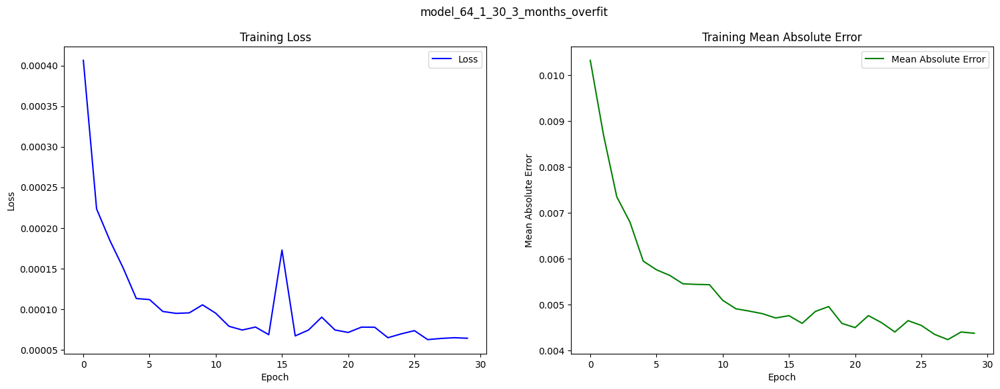

In [44]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_64_1_30_3_months_overfit",
    model_history=history_64_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the mean absolute error is gradually decreasing; however, at the 15th epoch, the training loss observed a spike, and the mean absolute error is almost similar to that observed with a single LSTM layer with 8 neurons. To potentially further reduce the error, one option is to enhance the model's complexity by adding or removing layers or neurons.

- 1 LSTM(64) 1 Dense(1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 6.4091e-05
- Mean Absolute Error: 0.0044

<br></br>
#### **Model Building with one LSTM layer and one Dense Layer (64-1) and 30 epochs 6 months window**

In [48]:
# Let's create a keras sequential model
model_64_1_30_6_months_overfit = Sequential()

# Let's add LSTM layer to the model network
model_64_1_30_6_months_overfit.add(
    LSTM(64, return_sequences=False, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_64_1_30_6_months_overfit.add(Dense(1))

In [49]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_64_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [50]:
# Let's fit the sequential model with input features and output label
history_64_1_30_6_months_overfit = model_64_1_30_6_months_overfit.fit(
    overall_x_train_6_months, overall_y_train_6_months, batch_size=1, epochs=30
)

Epoch 1/30
2839/2839 [==============================] - 47s 16ms/step - loss: 4.8622e-04 - mean_absolute_error: 0.0116
Epoch 2/30
2839/2839 [==============================] - 46s 16ms/step - loss: 1.8034e-04 - mean_absolute_error: 0.0080
Epoch 3/30
2839/2839 [==============================] - 45s 16ms/step - loss: 1.6576e-04 - mean_absolute_error: 0.0076
Epoch 4/30
2839/2839 [==============================] - 46s 16ms/step - loss: 1.4660e-04 - mean_absolute_error: 0.0071
Epoch 5/30
2839/2839 [==============================] - 45s 16ms/step - loss: 1.2880e-04 - mean_absolute_error: 0.0061
Epoch 6/30
2839/2839 [==============================] - 46s 16ms/step - loss: 1.1063e-04 - mean_absolute_error: 0.0059
Epoch 7/30
2839/2839 [==============================] - 46s 16ms/step - loss: 1.1188e-04 - mean_absolute_error: 0.0055
Epoch 8/30
2839/2839 [==============================] - 46s 16ms/step - loss: 9.4581e-05 - mean_absolute_error: 0.0055
Epoch 9/30
2839/2839 [==========================

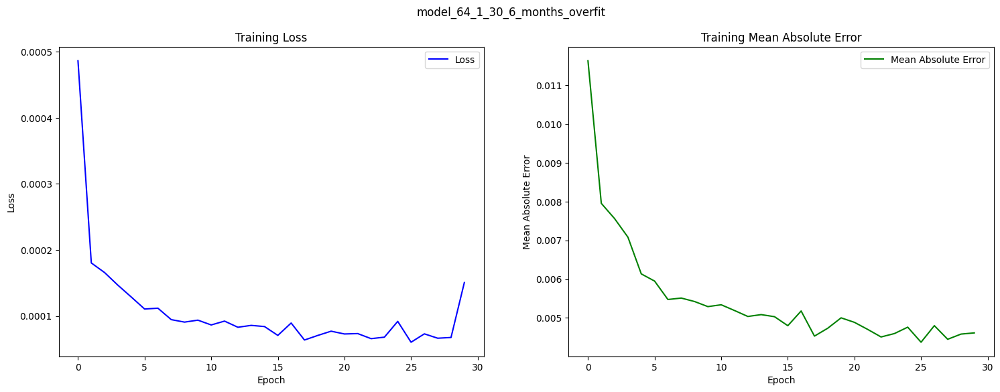

In [51]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_64_1_30_6_months_overfit",
    model_history=history_64_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the mean absolute error is fluctuating i.e increasing or decreasing, the observed mean absolute error is almost similar compared to the one LSTM layer with 8 neurons. One option to potentially decrease it further is to enhance the model's complexity by adding or removing more layers or neurons.

- 1 LSTM(64) 1 Dense(1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.5068e-04
- Mean Absolute Error: 0.0046

<br></br>
#### **Model Building with one LSTM layer and Dense layer (128-1) and 30 epochs - 3 months window**

In [52]:
# Let's create a keras sequential model
model_128_1_30_3_months_overfit = Sequential()

# Let's add LSTM layer to the model network
model_128_1_30_3_months_overfit.add(
    LSTM(128, return_sequences=False, input_shape=(x_train_3_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_128_1_30_3_months_overfit.add(Dense(1))

In [53]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [54]:
# Let's fit the sequential model with input features and output label
history_128_1_30_3_months_overfit = model_128_1_30_3_months_overfit.fit(
    overall_x_train_3_months, overall_y_train_3_months, batch_size=1, epochs=30
)

Epoch 1/30
2929/2929 [==============================] - 36s 12ms/step - loss: 7.0601e-04 - mean_absolute_error: 0.0127
Epoch 2/30
2929/2929 [==============================] - 34s 12ms/step - loss: 2.4975e-04 - mean_absolute_error: 0.0086
Epoch 3/30
2929/2929 [==============================] - 35s 12ms/step - loss: 1.9843e-04 - mean_absolute_error: 0.0072
Epoch 4/30
2929/2929 [==============================] - 34s 12ms/step - loss: 1.3483e-04 - mean_absolute_error: 0.0063
Epoch 5/30
2929/2929 [==============================] - 34s 12ms/step - loss: 1.1947e-04 - mean_absolute_error: 0.0063
Epoch 6/30
2929/2929 [==============================] - 34s 12ms/step - loss: 1.1321e-04 - mean_absolute_error: 0.0059
Epoch 7/30
2929/2929 [==============================] - 34s 12ms/step - loss: 1.3068e-04 - mean_absolute_error: 0.0062
Epoch 8/30
2929/2929 [==============================] - 34s 12ms/step - loss: 9.6143e-05 - mean_absolute_error: 0.0055
Epoch 9/30
2929/2929 [==========================

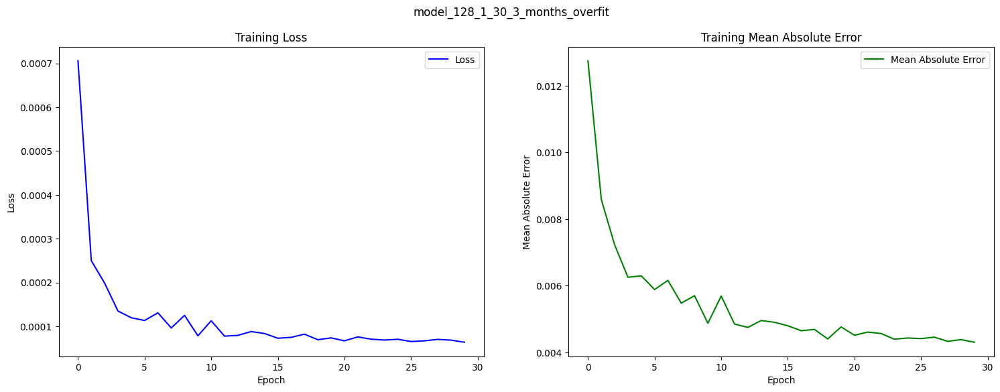

In [55]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_128_1_30_3_months_overfit",
    model_history=history_128_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the mean absolute error is fluctuating, i.e., increasing and decreasing gradually, the observed mean absolute error is exactly similar compared to that of one LSTM layer with 8 neurons. One option to potentially decrease it further is to increase/deccrease the number of layers/neurons.

- 1 LSTM(128) 1 Dense(1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 6.3571e-05
- Mean Absolute Error: 0.0043

<br></br>
#### **Model Building with one LSTM layer and Dense layer (128-1) and 30 epochs - 6 months window**

In [56]:
# Let's create a keras sequential model
model_128_1_30_6_months_overfit = Sequential()

# Let's add LSTM layer to the model network
model_128_1_30_6_months_overfit.add(
    LSTM(128, return_sequences=False, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_128_1_30_6_months_overfit.add(Dense(1))

In [57]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [58]:
# Let's fit the sequential model with input features and output label
history_128_1_30_6_months_overfit = model_128_1_30_6_months_overfit.fit(
    overall_x_train_6_months, overall_y_train_6_months, batch_size=1, epochs=30
)

Epoch 1/30
2839/2839 [==============================] - 52s 18ms/step - loss: 8.2755e-04 - mean_absolute_error: 0.0121
Epoch 2/30
2839/2839 [==============================] - 39s 14ms/step - loss: 2.3723e-04 - mean_absolute_error: 0.0088
Epoch 3/30
2839/2839 [==============================] - 39s 14ms/step - loss: 1.7473e-04 - mean_absolute_error: 0.0077
Epoch 4/30
2839/2839 [==============================] - 38s 14ms/step - loss: 1.8289e-04 - mean_absolute_error: 0.0072
Epoch 5/30
2839/2839 [==============================] - 38s 13ms/step - loss: 1.2653e-04 - mean_absolute_error: 0.0063
Epoch 6/30
2839/2839 [==============================] - 38s 13ms/step - loss: 1.1183e-04 - mean_absolute_error: 0.0059
Epoch 7/30
2839/2839 [==============================] - 38s 13ms/step - loss: 1.1199e-04 - mean_absolute_error: 0.0058
Epoch 8/30
2839/2839 [==============================] - 39s 14ms/step - loss: 9.5425e-05 - mean_absolute_error: 0.0054
Epoch 9/30
2839/2839 [==========================

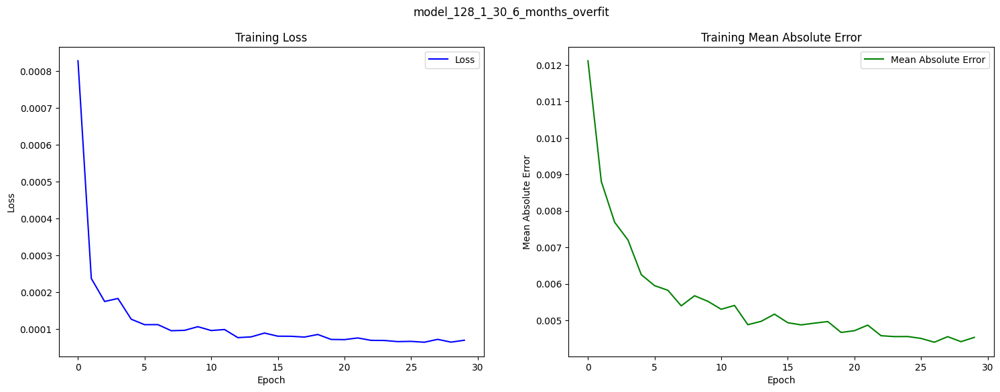

In [59]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_128_1_30_6_months_overfit",
    model_history=history_128_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the mean absolute error is decreasing gradually. After 10 epochs, the observed mean absolute error is almost similar to that of a single LSTM layer with 8 neurons. One option to potentially decrease it further is to increase or decrease the number of layers or neurons.

- 1 LSTM(128) 1 Dense(1) - 6 months
- Epochs: 10
- Batch Size: 1
- Training Loss: 1.0197e-04
- Mean Absolute Error: 0.0057

<br></br>
#### **Model Building with 2 LSTM layers and 2 Dense layers (128-64-8-1) and 30 epochs - 3 months**

In [60]:
# Let's create a keras sequential model
model_128_64_8_1_30_3_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_8_1_30_3_months_overfit.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_128_64_8_1_30_3_months_overfit.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_8_1_30_3_months_overfit.add(Dense(8))
model_128_64_8_1_30_3_months_overfit.add(Dense(1))

In [61]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_8_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [62]:
# Let's fit the sequential model with input features and output label
history_128_64_8_1_30_3_months_overfit = model_128_64_8_1_30_3_months_overfit.fit(
    overall_x_train_3_months, overall_y_train_3_months, batch_size=1, epochs=30
)

Epoch 1/30
2929/2929 [==============================] - 43s 14ms/step - loss: 0.0014 - mean_absolute_error: 0.0160
Epoch 2/30
2929/2929 [==============================] - 42s 14ms/step - loss: 4.5242e-04 - mean_absolute_error: 0.0114
Epoch 3/30
2929/2929 [==============================] - 42s 14ms/step - loss: 3.6377e-04 - mean_absolute_error: 0.0090
Epoch 4/30
2929/2929 [==============================] - 41s 14ms/step - loss: 4.3048e-04 - mean_absolute_error: 0.0090
Epoch 5/30
2929/2929 [==============================] - 42s 14ms/step - loss: 1.5984e-04 - mean_absolute_error: 0.0065
Epoch 6/30
2929/2929 [==============================] - 42s 14ms/step - loss: 2.5367e-04 - mean_absolute_error: 0.0080
Epoch 7/30
2929/2929 [==============================] - 43s 15ms/step - loss: 1.6424e-04 - mean_absolute_error: 0.0071
Epoch 8/30
2929/2929 [==============================] - 42s 14ms/step - loss: 1.7357e-04 - mean_absolute_error: 0.0073
Epoch 9/30
2929/2929 [==============================

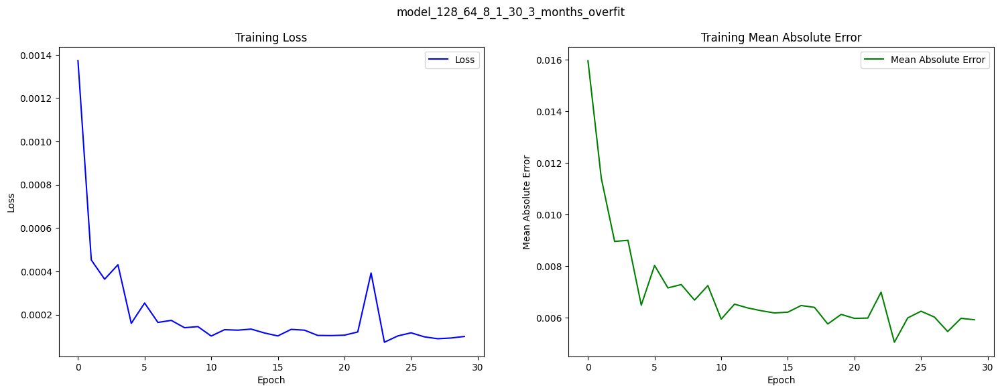

In [63]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_128_64_8_1_30_3_months_overfit",
    model_history=history_128_64_8_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the training loss observed a spike between 20 and 25 epochs; however, the mean absolute error is fluctuating, i.e., increasing and decreasing. The observed mean absolute error is slightly higher than what was observed during the training of a single LSTM layer with 8 neurons. One option to potentially decrease it further is to increase or decrease the number of layers or neurons.

- 2 LSTM(128-64) 2 Dense(8-1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 9.9356e-05
- Mean Absolute Error: 0.0059

<br></br>
#### **Model Building with 2 LSTM layers and 2 Dense layers (128-64-8-1) and 30 epochs - 6 months**

In [64]:
# Let's create a keras sequential model
model_128_64_8_1_30_6_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_8_1_30_6_months_overfit.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_128_64_8_1_30_6_months_overfit.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_8_1_30_6_months_overfit.add(Dense(8))
model_128_64_8_1_30_6_months_overfit.add(Dense(1))

In [65]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_8_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [66]:
# Let's fit the sequential model with input features and output label
history_128_64_8_1_30_6_months_overfit = model_128_64_8_1_30_6_months_overfit.fit(
    overall_x_train_6_months, overall_y_train_6_months, batch_size=1, epochs=30
)

Epoch 1/30
2839/2839 [==============================] - 79s 27ms/step - loss: 0.0012 - mean_absolute_error: 0.0161
Epoch 2/30
2839/2839 [==============================] - 78s 27ms/step - loss: 5.4512e-04 - mean_absolute_error: 0.0122
Epoch 3/30
2839/2839 [==============================] - 79s 28ms/step - loss: 3.3772e-04 - mean_absolute_error: 0.0101
Epoch 4/30
2839/2839 [==============================] - 80s 28ms/step - loss: 2.9478e-04 - mean_absolute_error: 0.0085
Epoch 5/30
2839/2839 [==============================] - 81s 28ms/step - loss: 3.5223e-04 - mean_absolute_error: 0.0089
Epoch 6/30
2839/2839 [==============================] - 82s 29ms/step - loss: 2.3264e-04 - mean_absolute_error: 0.0078
Epoch 7/30
2839/2839 [==============================] - 82s 29ms/step - loss: 1.6574e-04 - mean_absolute_error: 0.0074
Epoch 8/30
2839/2839 [==============================] - 81s 28ms/step - loss: 1.6986e-04 - mean_absolute_error: 0.0074
Epoch 9/30
2839/2839 [==============================

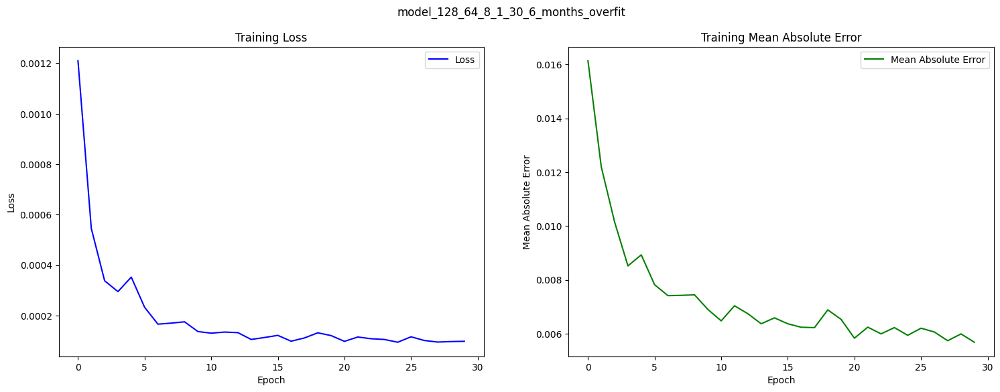

In [67]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_128_64_8_1_30_6_months_overfit",
    model_history=history_128_64_8_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the training is decreasing gradually; however, the mean absolute error is fluctuating, i.e., increasing and decreasing. The observed mean absolute error is slightly higher than what was observed during the training of a single LSTM layer with 8 neurons. One option to potentially decrease it further is to increase/decrease the number of layers or neurons.

- 2 LSTM(128-64) 2 Dense(8-1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 9.7770e-05
- Mean Absolute Error: 0.0057

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 3 months**

In [708]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_3_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_3_months_overfit.add(
    LSTM(128, return_sequences=False, input_shape=(x_train_3_months.shape[1], 1))
)
model_128_64_64_8_8_1_30_3_months_overfit.add(LSTM(64, return_sequences=True))
model_128_64_64_8_8_1_30_3_months_overfit.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_3_months_overfit.add(Dense(8))
model_128_64_64_8_8_1_30_3_months_overfit.add(Dense(8))
model_128_64_64_8_8_1_30_3_months_overfit.add(Dense(1))

In [709]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [710]:
# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_3_months_overfit = (
    model_128_64_64_8_8_1_30_3_months_overfit.fit(
        overall_x_train_3_months, overall_y_train_3_months, batch_size=1, epochs=30
    )
)

Epoch 1/30
2929/2929 [==============================] - 23s 7ms/step - loss: 6.0830e-04 - mean_absolute_error: 0.0131
Epoch 2/30
2929/2929 [==============================] - 22s 7ms/step - loss: 2.3212e-04 - mean_absolute_error: 0.0085
Epoch 3/30
2929/2929 [==============================] - 23s 8ms/step - loss: 1.5396e-04 - mean_absolute_error: 0.0072
Epoch 4/30
2929/2929 [==============================] - 23s 8ms/step - loss: 1.8716e-04 - mean_absolute_error: 0.0070
Epoch 5/30
2929/2929 [==============================] - 22s 7ms/step - loss: 1.5713e-04 - mean_absolute_error: 0.0065
Epoch 6/30
2929/2929 [==============================] - 21s 7ms/step - loss: 1.1781e-04 - mean_absolute_error: 0.0057
Epoch 7/30
2929/2929 [==============================] - 22s 8ms/step - loss: 1.0321e-04 - mean_absolute_error: 0.0059
Epoch 8/30
2929/2929 [==============================] - 22s 7ms/step - loss: 1.0808e-04 - mean_absolute_error: 0.0058
Epoch 9/30
2929/2929 [==============================] - 

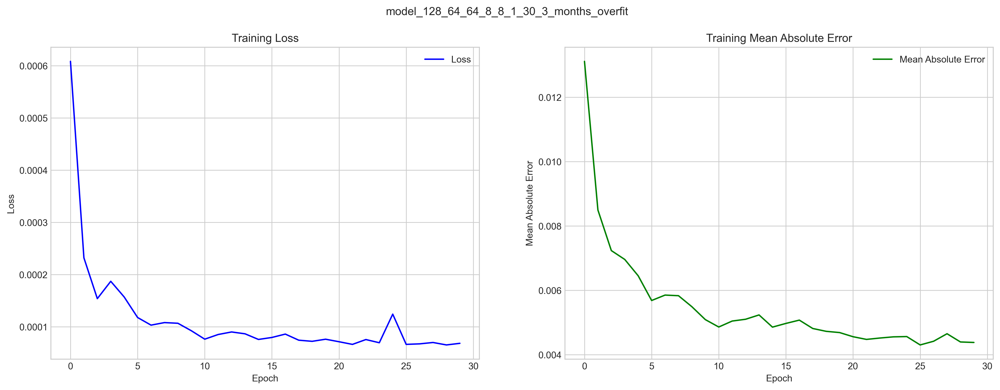

In [711]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_128_64_64_8_8_1_30_3_months_overfit",
    model_history=history_128_64_64_8_8_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, training loss and MAE is fluctuating i.e increasing and decreasing in between 2 and 20 epochs. Increasing the number of LSTM and dense layers has resulted in a decrease in mean absolute error compared to either one LSTM layer or two LSTM layers. To potentially further reduce the mean absolute error, increasing/decreasing the number of layers/neurons may be effective.


- 3 LSTM(128-64-64) 2 Dense(8-8-1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 6.8383e-05
- Mean Absolute Error: 0.0044

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [712]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_overfit.add(
    LSTM(128, return_sequences=False, input_shape=(x_train_6_months.shape[1], 1))
)
model_128_64_64_8_8_1_30_6_months_overfit.add(LSTM(64, return_sequences=True))
model_128_64_64_8_8_1_30_6_months_overfit.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_overfit.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_overfit.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_overfit.add(Dense(1))

In [713]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [714]:
# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_overfit = (
    model_128_64_64_8_8_1_30_6_months_overfit.fit(
        overall_x_train_6_months, overall_y_train_6_months, batch_size=1, epochs=30
    )
)

Epoch 1/30
2839/2839 [==============================] - 45s 15ms/step - loss: 4.3836e-04 - mean_absolute_error: 0.0119
Epoch 2/30
2839/2839 [==============================] - 39s 14ms/step - loss: 2.1257e-04 - mean_absolute_error: 0.0079
Epoch 3/30
2839/2839 [==============================] - 43s 15ms/step - loss: 1.6693e-04 - mean_absolute_error: 0.0071
Epoch 4/30
2839/2839 [==============================] - 41s 14ms/step - loss: 1.3622e-04 - mean_absolute_error: 0.0065
Epoch 5/30
2839/2839 [==============================] - 41s 14ms/step - loss: 1.5691e-04 - mean_absolute_error: 0.0065
Epoch 6/30
2839/2839 [==============================] - 40s 14ms/step - loss: 1.0279e-04 - mean_absolute_error: 0.0056
Epoch 7/30
2839/2839 [==============================] - 41s 14ms/step - loss: 1.2296e-04 - mean_absolute_error: 0.0063
Epoch 8/30
2839/2839 [==============================] - 42s 15ms/step - loss: 1.2930e-04 - mean_absolute_error: 0.0057
Epoch 9/30
2839/2839 [==========================

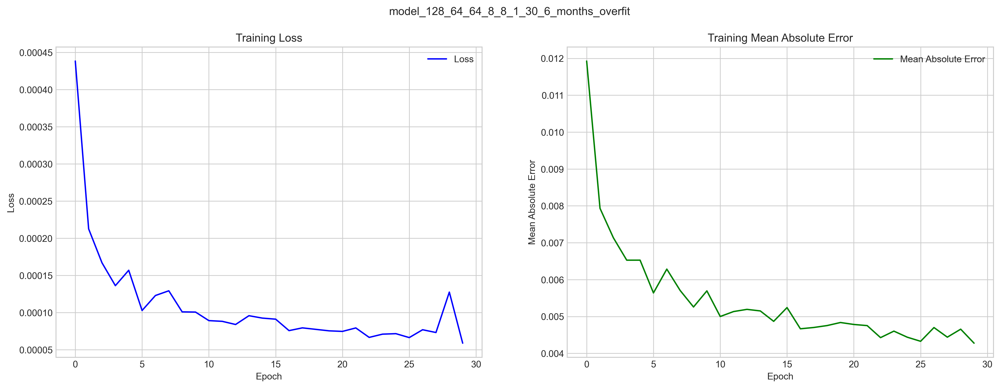

In [717]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_128_64_64_8_8_1_30_6_months_overfit",
    model_history=history_128_64_64_8_8_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, training loss and MAE is fluctuating i.e increasing and decreasing in between 2 and 20 epochs. Increasing the number of LSTM and dense layers has not resulted in a decrease in mean absolute error compared to either one LSTM layer or two LSTM layers. To potentially further reduce the mean absolute error, increasing/decreasing the number of layers/neurons may be effective.


- 3 LSTM(128-64-64) 2 Dense(8-8-1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.2476e-04
- Mean Absolute Error: 0.0070

<br></br>
#### **Model Building with 4 LSTM and 3 Dense layers (8-16-16-32-8-8-1) and 30 epochs - 3 months**

In [76]:
# Let's create a keras sequential model
model_8_16_16_32_8_8_1_30_3_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_8_8_1_30_3_months_overfit.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_8_16_16_32_8_8_1_30_3_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_8_8_1_30_3_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_8_8_1_30_3_months_overfit.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_8_8_1_30_3_months_overfit.add(Dense(8))
model_8_16_16_32_8_8_1_30_3_months_overfit.add(Dense(8))
model_8_16_16_32_8_8_1_30_3_months_overfit.add(Dense(1))

In [77]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_8_8_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [78]:
# Let's fit the sequential model with input features and output label
history_8_16_16_32_8_8_1_30_3_months_overfit = (
    model_8_16_16_32_8_8_1_30_3_months_overfit.fit(
        overall_x_train_3_months,
        overall_y_train_3_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2929/2929 [==============================] - 59s 19ms/step - loss: 0.0025 - mean_absolute_error: 0.0265
Epoch 2/30
2929/2929 [==============================] - 56s 19ms/step - loss: 9.9980e-04 - mean_absolute_error: 0.0179
Epoch 3/30
2929/2929 [==============================] - 55s 19ms/step - loss: 5.7611e-04 - mean_absolute_error: 0.0151
Epoch 4/30
2929/2929 [==============================] - 55s 19ms/step - loss: 5.3420e-04 - mean_absolute_error: 0.0139
Epoch 5/30
2929/2929 [==============================] - 55s 19ms/step - loss: 4.3510e-04 - mean_absolute_error: 0.0130
Epoch 6/30
2929/2929 [==============================] - 56s 19ms/step - loss: 3.8278e-04 - mean_absolute_error: 0.0121
Epoch 7/30
2929/2929 [==============================] - 55s 19ms/step - loss: 2.8334e-04 - mean_absolute_error: 0.0108
Epoch 8/30
2929/2929 [==============================] - 56s 19ms/step - loss: 2.2956e-04 - mean_absolute_error: 0.0097
Epoch 9/30
2929/2929 [==============================

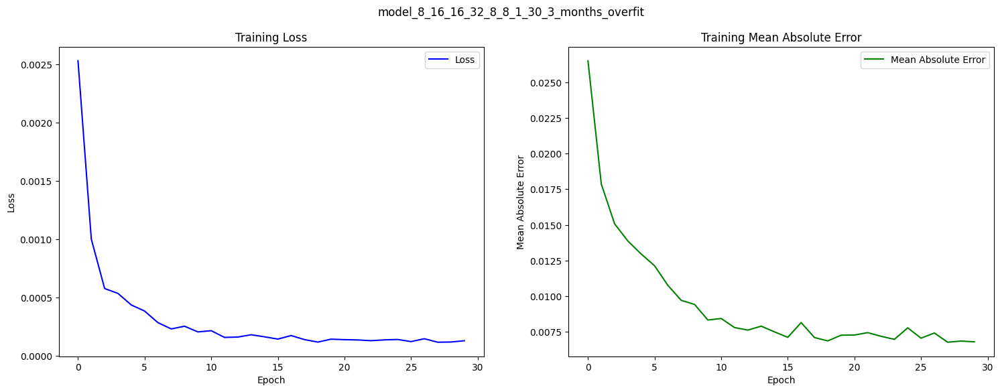

In [79]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_8_16_16_32_8_8_1_30_3_months_overfit",
    model_history=history_8_16_16_32_8_8_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, training loss and mean absolute error are decreasing gradually. Increasing the number of layers from three LSTM and three dense layer to four LSTM and three dense layers has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 30 epochs. To potentially further reduce the mean absolute error, increasing or decreasing the number of layers/neurons may be effective.

- 3 LSTM(8-16-16-32) 3 Dense(8-8-1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.2815e-04
- Mean Absolute Error: 0.0068

<br></br>
#### **Model Building with 4 LSTM and 3 Dense layers (8-16-16-32-8-8-1) and 30 epochs - 6 months**

In [80]:
# Let's create a keras sequential model
model_8_16_16_32_8_8_1_30_6_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_8_8_1_30_6_months_overfit.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_8_16_16_32_8_8_1_30_6_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_8_8_1_30_6_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_8_8_1_30_6_months_overfit.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_8_8_1_30_6_months_overfit.add(Dense(8))
model_8_16_16_32_8_8_1_30_6_months_overfit.add(Dense(8))
model_8_16_16_32_8_8_1_30_6_months_overfit.add(Dense(1))

In [81]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_8_8_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [82]:
# Let's fit the sequential model with input features and output label
history_8_16_16_32_8_8_1_30_6_months_overfit = (
    model_8_16_16_32_8_8_1_30_6_months_overfit.fit(
        overall_x_train_6_months,
        overall_y_train_6_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2839/2839 [==============================] - 112s 39ms/step - loss: 0.0016 - mean_absolute_error: 0.0235
Epoch 2/30
2839/2839 [==============================] - 110s 39ms/step - loss: 8.7240e-04 - mean_absolute_error: 0.0163
Epoch 3/30
2839/2839 [==============================] - 109s 38ms/step - loss: 6.1269e-04 - mean_absolute_error: 0.0146
Epoch 4/30
2839/2839 [==============================] - 109s 38ms/step - loss: 4.8074e-04 - mean_absolute_error: 0.0130
Epoch 5/30
2839/2839 [==============================] - 110s 39ms/step - loss: 3.4548e-04 - mean_absolute_error: 0.0114
Epoch 6/30
2839/2839 [==============================] - 109s 38ms/step - loss: 2.9197e-04 - mean_absolute_error: 0.0106
Epoch 7/30
2839/2839 [==============================] - 109s 38ms/step - loss: 2.6560e-04 - mean_absolute_error: 0.0101
Epoch 8/30
2839/2839 [==============================] - 110s 39ms/step - loss: 2.6036e-04 - mean_absolute_error: 0.0100
Epoch 9/30
2839/2839 [======================

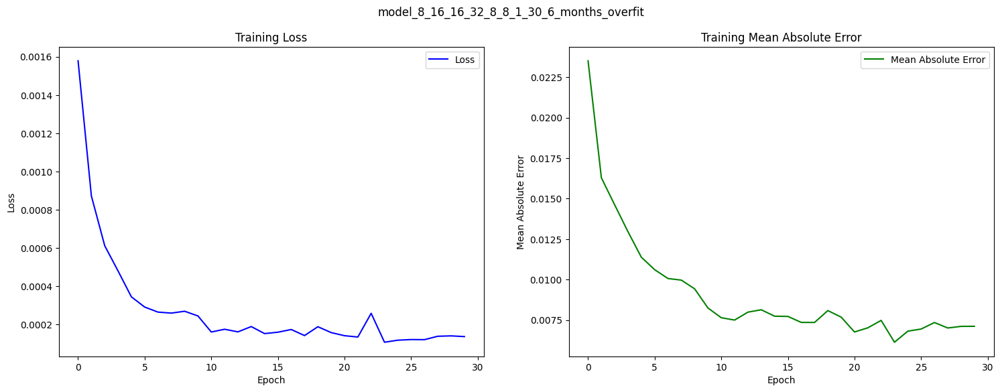

In [83]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_8_16_16_32_8_8_1_30_6_months_overfit",
    model_history=history_8_16_16_32_8_8_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, training loss and mean absolute error are decreasing gradually. Increasing the number of layers from three LSTM and three dense layer to four LSTM and three dense layers has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 30 epochs. To potentially further reduce the mean absolute error, increasing or decreasing the number of layers/neurons may be effective.

- 3 LSTM(8-16-16-32) 3 Dense(8-8-1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.3762e-04
- Mean Absolute Error: 0.0071

<br></br>
#### **Model Building with 4 LSTM and 4 Dense layers (8-16-16-32-32-16-16-1) and 30 epochs - 3 months**

In [84]:
# Let's create a keras sequential model
model_8_16_16_32_32_16_16_1_30_3_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_32_16_16_1_30_3_months_overfit.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_8_16_16_32_32_16_16_1_30_3_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_32_16_16_1_30_3_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_32_16_16_1_30_3_months_overfit.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_32_16_16_1_30_3_months_overfit.add(Dense(32))
model_8_16_16_32_32_16_16_1_30_3_months_overfit.add(Dense(16))
model_8_16_16_32_32_16_16_1_30_3_months_overfit.add(Dense(16))
model_8_16_16_32_32_16_16_1_30_3_months_overfit.add(Dense(1))

In [85]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_32_16_16_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [86]:
# Let's fit the sequential model with input features and output label
history_8_16_16_32_32_16_16_1_30_3_months_overfit = (
    model_8_16_16_32_32_16_16_1_30_3_months_overfit.fit(
        overall_x_train_3_months,
        overall_y_train_3_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2929/2929 [==============================] - 57s 19ms/step - loss: 0.0023 - mean_absolute_error: 0.0268
Epoch 2/30
2929/2929 [==============================] - 55s 19ms/step - loss: 0.0013 - mean_absolute_error: 0.0213
Epoch 3/30
2929/2929 [==============================] - 55s 19ms/step - loss: 0.0017 - mean_absolute_error: 0.0207
Epoch 4/30
2929/2929 [==============================] - 55s 19ms/step - loss: 6.6528e-04 - mean_absolute_error: 0.0147
Epoch 5/30
2929/2929 [==============================] - 55s 19ms/step - loss: 5.6577e-04 - mean_absolute_error: 0.0157
Epoch 6/30
2929/2929 [==============================] - 55s 19ms/step - loss: 4.7583e-04 - mean_absolute_error: 0.0138
Epoch 7/30
2929/2929 [==============================] - 56s 19ms/step - loss: 4.7474e-04 - mean_absolute_error: 0.0136
Epoch 8/30
2929/2929 [==============================] - 56s 19ms/step - loss: 5.6703e-04 - mean_absolute_error: 0.0136
Epoch 9/30
2929/2929 [==============================] - 55s 

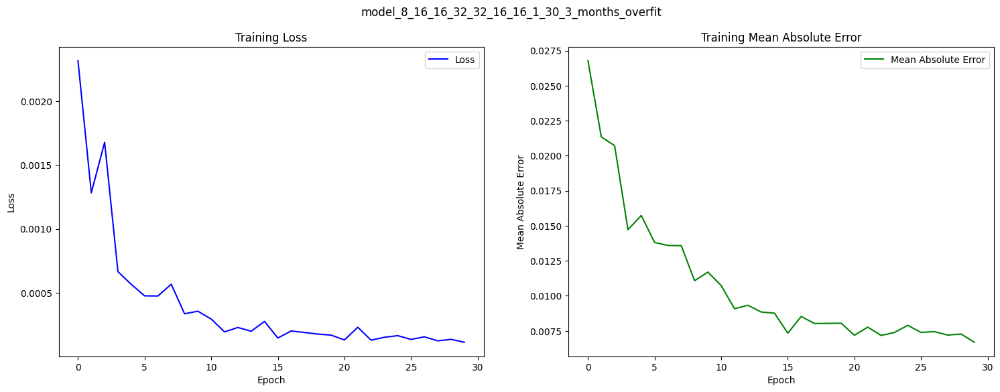

In [87]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_8_16_16_32_32_16_16_1_30_3_months_overfit",
    model_history=history_8_16_16_32_32_16_16_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, training loss and mean absolute error are fluctuating i.e increasing and decreasing. Increasing the number of LSTM and Dense layers and neurons has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 30 epochs. To potentially further reduce the mean absolute error, increasing/decreasing the number of LSTM layers or neurons may result in a decrease in MAE.

- 4 LSTM(8-16-16-32) 4 Dense(32-32-16-16-1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.1268e-04
- Mean Absolute Error: 0.0067

<br></br>
#### **Model Building with 4 LSTM and 4 Dense layers (8-16-16-32-32-16-16-1) and 30 epochs - 6 months**

In [88]:
# Let's create a keras sequential model
model_8_16_16_32_32_16_16_1_30_6_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_32_16_16_1_30_6_months_overfit.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_8_16_16_32_32_16_16_1_30_6_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_32_16_16_1_30_6_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_32_16_16_1_30_6_months_overfit.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_32_16_16_1_30_6_months_overfit.add(Dense(32))
model_8_16_16_32_32_16_16_1_30_6_months_overfit.add(Dense(16))
model_8_16_16_32_32_16_16_1_30_6_months_overfit.add(Dense(16))
model_8_16_16_32_32_16_16_1_30_6_months_overfit.add(Dense(1))

In [89]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_32_16_16_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [90]:
# Let's fit the sequential model with input features and output label
history_8_16_16_32_32_16_16_1_30_6_months_overfit = (
    model_8_16_16_32_32_16_16_1_30_6_months_overfit.fit(
        overall_x_train_6_months,
        overall_y_train_6_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2839/2839 [==============================] - 114s 39ms/step - loss: 0.0017 - mean_absolute_error: 0.0244
Epoch 2/30
2839/2839 [==============================] - 111s 39ms/step - loss: 0.0011 - mean_absolute_error: 0.0196
Epoch 3/30
2839/2839 [==============================] - 111s 39ms/step - loss: 7.5172e-04 - mean_absolute_error: 0.0166
Epoch 4/30
2839/2839 [==============================] - 111s 39ms/step - loss: 9.1018e-04 - mean_absolute_error: 0.0164
Epoch 5/30
2839/2839 [==============================] - 111s 39ms/step - loss: 4.9226e-04 - mean_absolute_error: 0.0137
Epoch 6/30
2839/2839 [==============================] - 111s 39ms/step - loss: 4.3106e-04 - mean_absolute_error: 0.0131
Epoch 7/30
2839/2839 [==============================] - 110s 39ms/step - loss: 3.5264e-04 - mean_absolute_error: 0.0113
Epoch 8/30
2839/2839 [==============================] - 109s 38ms/step - loss: 2.5843e-04 - mean_absolute_error: 0.0106
Epoch 9/30
2839/2839 [==========================

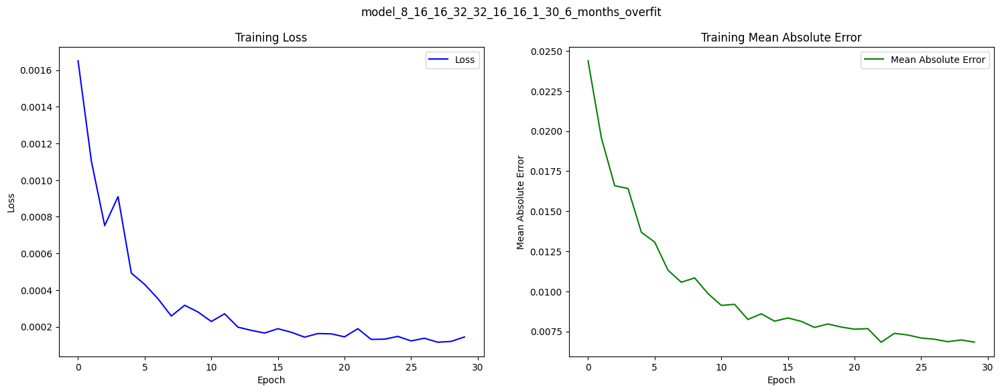

In [91]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_8_16_16_32_32_16_16_1_30_6_months_overfit",
    model_history=history_8_16_16_32_32_16_16_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, training loss and mean absolute error are decreasing gradually. Increasing the number of LSTM/Dense layers and neurons has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 30 epochs. To potentially further reduce the mean absolute error, increasing/decreasing the number of LSTM layers or neurons may result in a decrease in MAE.

- 4 LSTM(8-16-16-32) 4 Dense(32-32-16-16-1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.4419e-04
- Mean Absolute Error: 0.0068

<br></br>
#### **Model Building with 5 LSTM and 3 Dense layers (8-16-16-32-64-8-8-1) and 30 epochs - 3 months**

In [92]:
# Let's create a keras sequential model
model_8_16_16_32_64_8_8_1_30_3_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_64_8_8_1_30_3_months_overfit.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_8_16_16_32_64_8_8_1_30_3_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_3_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_3_months_overfit.add(LSTM(32, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_3_months_overfit.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_64_8_8_1_30_3_months_overfit.add(Dense(8))
model_8_16_16_32_64_8_8_1_30_3_months_overfit.add(Dense(8))
model_8_16_16_32_64_8_8_1_30_3_months_overfit.add(Dense(1))

In [93]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_64_8_8_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [94]:
# Let's fit the sequential model with input features and output label
history_8_16_16_32_64_8_8_1_30_3_months_overfit = (
    model_8_16_16_32_64_8_8_1_30_3_months_overfit.fit(
        overall_x_train_3_months,
        overall_y_train_3_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2929/2929 [==============================] - 75s 25ms/step - loss: 0.0033 - mean_absolute_error: 0.0295
Epoch 2/30
2929/2929 [==============================] - 73s 25ms/step - loss: 8.9989e-04 - mean_absolute_error: 0.0191
Epoch 3/30
2929/2929 [==============================] - 72s 25ms/step - loss: 8.9927e-04 - mean_absolute_error: 0.0183
Epoch 4/30
2929/2929 [==============================] - 72s 25ms/step - loss: 6.7194e-04 - mean_absolute_error: 0.0160
Epoch 5/30
2929/2929 [==============================] - 72s 25ms/step - loss: 5.3385e-04 - mean_absolute_error: 0.0151
Epoch 6/30
2929/2929 [==============================] - 73s 25ms/step - loss: 4.0701e-04 - mean_absolute_error: 0.0127
Epoch 7/30
2929/2929 [==============================] - 73s 25ms/step - loss: 3.5668e-04 - mean_absolute_error: 0.0118
Epoch 8/30
2929/2929 [==============================] - 72s 25ms/step - loss: 2.6977e-04 - mean_absolute_error: 0.0104
Epoch 9/30
2929/2929 [==============================

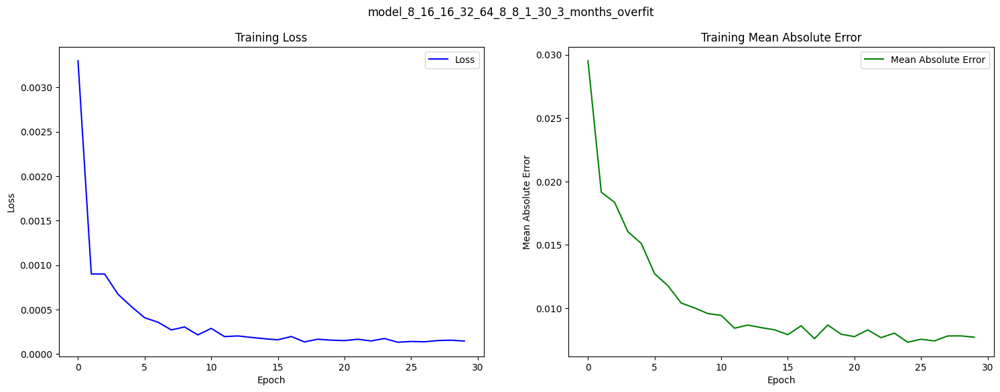

In [95]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_8_16_16_32_64_8_8_1_30_3_months_overfit",
    model_history=history_8_16_16_32_64_8_8_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, training loss and mean absolute error are decreasing gradually. Increasing the number of LSTM layers has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 30 epochs. To potentially further reduce the mean absolute error, increasing/decreasing the number of LSTM layers or neurons may result in a decrease in MAE.

- 5 LSTM(8-16-16-32-64) 3 Dense(8-8-1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.4442e-04
- Mean Absolute Error: 0.0077

<br></br>
#### **Model Building with 5 LSTM and 3 Dense layers (8-16-16-32-64-8-8-1) and 30 epochs - 6 months**

In [96]:
# Let's create a keras sequential model
model_8_16_16_32_64_8_8_1_30_6_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_64_8_8_1_30_6_months_overfit.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_8_16_16_32_64_8_8_1_30_6_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_6_months_overfit.add(LSTM(16, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_6_months_overfit.add(LSTM(32, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_6_months_overfit.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_64_8_8_1_30_6_months_overfit.add(Dense(8))
model_8_16_16_32_64_8_8_1_30_6_months_overfit.add(Dense(8))
model_8_16_16_32_64_8_8_1_30_6_months_overfit.add(Dense(1))

In [97]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_64_8_8_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [98]:
# Let's fit the sequential model with input features and output label
history_8_16_16_32_64_8_8_1_30_6_months_overfit = (
    model_8_16_16_32_64_8_8_1_30_6_months_overfit.fit(
        overall_x_train_6_months,
        overall_y_train_6_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2839/2839 [==============================] - 147s 51ms/step - loss: 0.0027 - mean_absolute_error: 0.0279
Epoch 2/30
2839/2839 [==============================] - 143s 50ms/step - loss: 0.0013 - mean_absolute_error: 0.0205
Epoch 3/30
2839/2839 [==============================] - 144s 51ms/step - loss: 6.7109e-04 - mean_absolute_error: 0.0171
Epoch 4/30
2839/2839 [==============================] - 145s 51ms/step - loss: 7.6809e-04 - mean_absolute_error: 0.0160
Epoch 5/30
2839/2839 [==============================] - 142s 50ms/step - loss: 3.6902e-04 - mean_absolute_error: 0.0129
Epoch 6/30
2839/2839 [==============================] - 142s 50ms/step - loss: 3.9476e-04 - mean_absolute_error: 0.0123
Epoch 7/30
2839/2839 [==============================] - 142s 50ms/step - loss: 3.3356e-04 - mean_absolute_error: 0.0114
Epoch 8/30
2839/2839 [==============================] - 142s 50ms/step - loss: 2.9207e-04 - mean_absolute_error: 0.0108
Epoch 9/30
2839/2839 [==========================

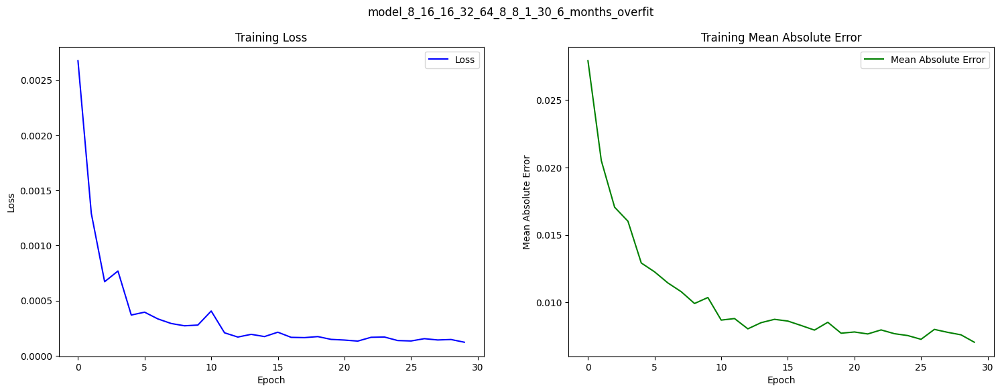

In [99]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_8_16_16_32_64_8_8_1_30_6_months_overfit",
    model_history=history_8_16_16_32_64_8_8_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, training loss and mean absolute error are decreasing gradually. Increasing the number of LSTM layers has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 30 epochs. To potentially further reduce the mean absolute error, increasing/decreasing the number of LSTM layers or neurons may result in a decrease in MAE.

- 5 LSTM(8-16-16-32-64) 3 Dense(8-8-1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.2227e-04
- Mean Absolute Error: 0.0071

<br></br>
#### **Model Building with 6 LSTM and 2 Dense layers(16-32-32-32-64-64-8-1) and 30 epochs - 3 months**

In [100]:
# Let's create a keras sequential model
model_16_32_32_32_64_64_8_1_30_3_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_16_32_32_32_64_64_8_1_30_3_months_overfit.add(
    LSTM(16, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_16_32_32_32_64_64_8_1_30_3_months_overfit.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_3_months_overfit.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_3_months_overfit.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_3_months_overfit.add(LSTM(64, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_3_months_overfit.add(LSTM(64, return_sequences=False))


# Let's add dense layer to the model network
model_16_32_32_32_64_64_8_1_30_3_months_overfit.add(Dense(8))
model_16_32_32_32_64_64_8_1_30_3_months_overfit.add(Dense(1))

In [101]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_16_32_32_32_64_64_8_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [102]:
# Let's fit the sequential model with input features and output label
history_16_32_32_32_64_64_8_1_30_3_months_overfit = (
    model_16_32_32_32_64_64_8_1_30_3_months_overfit.fit(
        overall_x_train_3_months,
        overall_y_train_3_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2929/2929 [==============================] - 98s 32ms/step - loss: 0.0028 - mean_absolute_error: 0.0290
Epoch 2/30
2929/2929 [==============================] - 95s 33ms/step - loss: 0.0011 - mean_absolute_error: 0.0212
Epoch 3/30
2929/2929 [==============================] - 96s 33ms/step - loss: 0.0014 - mean_absolute_error: 0.0219
Epoch 4/30
2929/2929 [==============================] - 96s 33ms/step - loss: 6.6454e-04 - mean_absolute_error: 0.0171
Epoch 5/30
2929/2929 [==============================] - 95s 33ms/step - loss: 5.3178e-04 - mean_absolute_error: 0.0147
Epoch 6/30
2929/2929 [==============================] - 95s 33ms/step - loss: 0.0045 - mean_absolute_error: 0.0196
Epoch 7/30
2929/2929 [==============================] - 95s 33ms/step - loss: 4.0227e-04 - mean_absolute_error: 0.0133
Epoch 8/30
2929/2929 [==============================] - 95s 33ms/step - loss: 3.7761e-04 - mean_absolute_error: 0.0137
Epoch 9/30
2929/2929 [==============================] - 96s 33ms

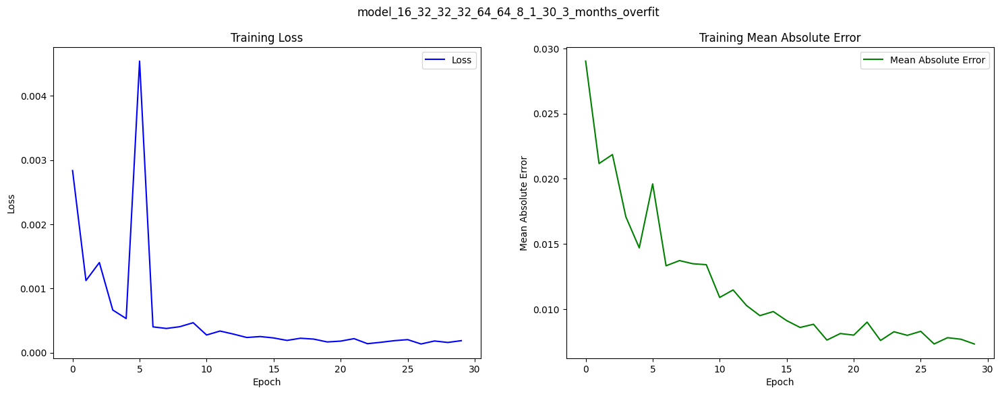

In [103]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_16_32_32_32_64_64_8_1_30_3_months_overfit",
    model_history=history_16_32_32_32_64_64_8_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, increasing the number of LSTM layers from five to six for 30 epochs, while reducing the number of dense layers from three to two, has not resulted in a decrease in the mean absolute error. Further steps, including increasing/decreasing the number of LSTM layers or neurons during training, might further reduce the mean absolute error.

- 6 LSTM(16-32-32-32-64-64) and 2 Dense(8-1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.8751e-04
- Mean Absolute Error: 0.0073

<br></br>
#### **Model Building with 6 LSTM and 2 Dense layers(16-32-32-32-64-64-8-1) and 30 epochs - 6 months**

In [104]:
# Let's create a keras sequential model
model_16_32_32_32_64_64_8_1_30_6_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_16_32_32_32_64_64_8_1_30_6_months_overfit.add(
    LSTM(16, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_16_32_32_32_64_64_8_1_30_6_months_overfit.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_6_months_overfit.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_6_months_overfit.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_6_months_overfit.add(LSTM(64, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_6_months_overfit.add(LSTM(64, return_sequences=False))


# Let's add dense layer to the model network
model_16_32_32_32_64_64_8_1_30_6_months_overfit.add(Dense(8))
model_16_32_32_32_64_64_8_1_30_6_months_overfit.add(Dense(1))

In [105]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_16_32_32_32_64_64_8_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [106]:
# Let's fit the sequential model with input features and output label
history_16_32_32_32_64_64_8_1_30_6_months_overfit = (
    model_16_32_32_32_64_64_8_1_30_6_months_overfit.fit(
        overall_x_train_6_months,
        overall_y_train_6_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2839/2839 [==============================] - 188s 65ms/step - loss: 0.0029 - mean_absolute_error: 0.0306
Epoch 2/30
2839/2839 [==============================] - 185s 65ms/step - loss: 0.0013 - mean_absolute_error: 0.0228
Epoch 3/30
2839/2839 [==============================] - 184s 65ms/step - loss: 8.0480e-04 - mean_absolute_error: 0.0180
Epoch 4/30
2839/2839 [==============================] - 183s 65ms/step - loss: 6.8614e-04 - mean_absolute_error: 0.0159
Epoch 5/30
2839/2839 [==============================] - 187s 66ms/step - loss: 4.8392e-04 - mean_absolute_error: 0.0139
Epoch 6/30
2839/2839 [==============================] - 184s 65ms/step - loss: 4.3624e-04 - mean_absolute_error: 0.0133
Epoch 7/30
2839/2839 [==============================] - 200s 70ms/step - loss: 2.7267e-04 - mean_absolute_error: 0.0105
Epoch 8/30
2839/2839 [==============================] - 195s 69ms/step - loss: 3.5529e-04 - mean_absolute_error: 0.0112
Epoch 9/30
2839/2839 [==========================

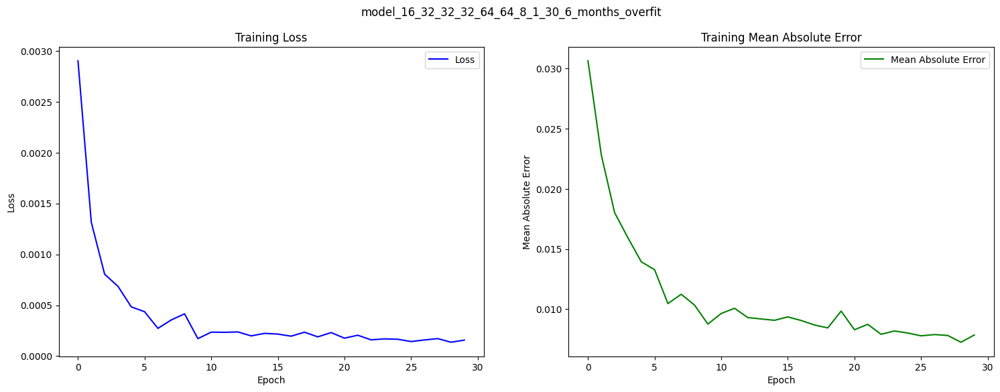

In [107]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_16_32_32_32_64_64_8_1_30_6_months_overfit",
    model_history=history_16_32_32_32_64_64_8_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, increasing the number of LSTM layers from five to six for 30 epochs, while reducing the number of dense layers from three to two, has not resulted in a decrease in the mean absolute error. Further steps, include increasing the number of neurons during training, might further reduce the mean absolute error.

- 6 LSTM(16-32-32-32-64-64) and 2 Dense(8-1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.5718e-04
- Mean Absolute Error: 0.0079

<br></br>
### **Increasing number of neurons in LSTM layers**
<br></br>
#### **Model Building with 3LSTM and 2Dense layers(64-128-128-8-1) and 30 epochs --> 3 months**

In [108]:
# Let's create a keras sequential model
model_16_128_128_8_1_30_3_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_16_128_128_8_1_30_3_months_overfit.add(
    LSTM(64, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_16_128_128_8_1_30_3_months_overfit.add(LSTM(128, return_sequences=True))
model_16_128_128_8_1_30_3_months_overfit.add(LSTM(128, return_sequences=False))

# Let's add dense layer to the model network
model_16_128_128_8_1_30_3_months_overfit.add(Dense(8))
model_16_128_128_8_1_30_3_months_overfit.add(Dense(1))

In [109]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_16_128_128_8_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [110]:
# Let's fit the sequential model with input features and output label
history_16_128_128_8_1_30_3_months_overfit = (
    model_16_128_128_8_1_30_3_months_overfit.fit(
        overall_x_train_3_months,
        overall_y_train_3_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2929/2929 [==============================] - 128s 42ms/step - loss: 0.0017 - mean_absolute_error: 0.0192
Epoch 2/30
2929/2929 [==============================] - 120s 41ms/step - loss: 7.5301e-04 - mean_absolute_error: 0.0144
Epoch 3/30
2929/2929 [==============================] - 122s 42ms/step - loss: 7.3310e-04 - mean_absolute_error: 0.0123
Epoch 4/30
2929/2929 [==============================] - 123s 42ms/step - loss: 2.7189e-04 - mean_absolute_error: 0.0100
Epoch 5/30
2929/2929 [==============================] - 125s 43ms/step - loss: 2.3684e-04 - mean_absolute_error: 0.0097
Epoch 6/30
2929/2929 [==============================] - 132s 45ms/step - loss: 2.1949e-04 - mean_absolute_error: 0.0092
Epoch 7/30
2929/2929 [==============================] - 129s 44ms/step - loss: 2.9558e-04 - mean_absolute_error: 0.0097
Epoch 8/30
2929/2929 [==============================] - 127s 43ms/step - loss: 1.8197e-04 - mean_absolute_error: 0.0080
Epoch 9/30
2929/2929 [======================

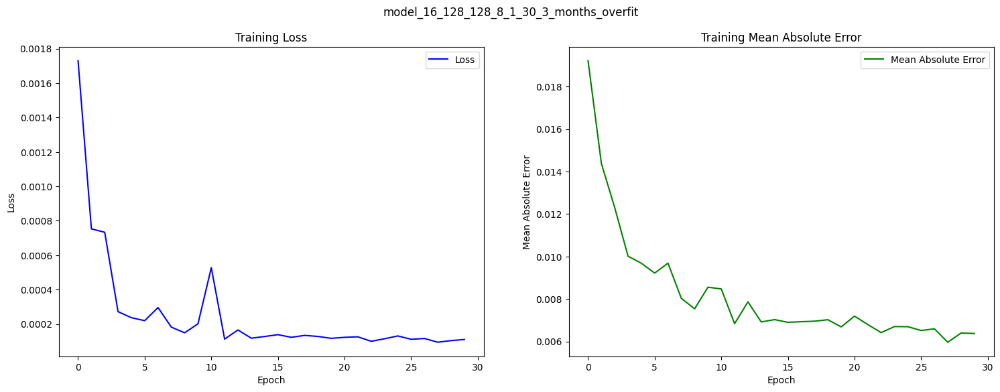

In [111]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_16_128_128_8_1_30_3_months_overfit",
    model_history=history_16_128_128_8_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, increasing the number of neurons in LSTM layers has resulted in a decrease in the mean absolute error. Further steps, include increasing the number of both LSTM layers and neurons during training, might further reduce the mean absolute error.

- 3 LSTM(64-128-128) and 2 Dense(8-1) - 3 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.1014e-04
- Mean Absolute Error: 0.0064

<br></br>
#### **Model Building with 3LSTM and 2Dense layers(64-128-128-8-1) and 30 epochs --> 6 months**

In [112]:
# Let's create a keras sequential model
model_16_128_128_8_1_30_6_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_16_128_128_8_1_30_6_months_overfit.add(
    LSTM(64, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_16_128_128_8_1_30_6_months_overfit.add(LSTM(128, return_sequences=True))
model_16_128_128_8_1_30_6_months_overfit.add(LSTM(128, return_sequences=False))

# Let's add dense layer to the model network
model_16_128_128_8_1_30_6_months_overfit.add(Dense(8))
model_16_128_128_8_1_30_6_months_overfit.add(Dense(1))

In [113]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_16_128_128_8_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [114]:
# Let's fit the sequential model with input features and output label
history_16_128_128_8_1_30_6_months_overfit = (
    model_16_128_128_8_1_30_6_months_overfit.fit(
        overall_x_train_6_months,
        overall_y_train_6_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2839/2839 [==============================] - 236s 82ms/step - loss: 0.0021 - mean_absolute_error: 0.0212
Epoch 2/30
2839/2839 [==============================] - 236s 83ms/step - loss: 5.4197e-04 - mean_absolute_error: 0.0127
Epoch 3/30
2839/2839 [==============================] - 235s 83ms/step - loss: 0.0023 - mean_absolute_error: 0.0131
Epoch 4/30
2839/2839 [==============================] - 239s 84ms/step - loss: 2.6934e-04 - mean_absolute_error: 0.0083
Epoch 5/30
2839/2839 [==============================] - 236s 83ms/step - loss: 2.9150e-04 - mean_absolute_error: 0.0096
Epoch 6/30
2839/2839 [==============================] - 243s 86ms/step - loss: 3.0606e-04 - mean_absolute_error: 0.0102
Epoch 7/30
2839/2839 [==============================] - 241s 85ms/step - loss: 2.5924e-04 - mean_absolute_error: 0.0098
Epoch 8/30
2839/2839 [==============================] - 237s 84ms/step - loss: 2.8250e-04 - mean_absolute_error: 0.0095
Epoch 9/30
2839/2839 [==========================

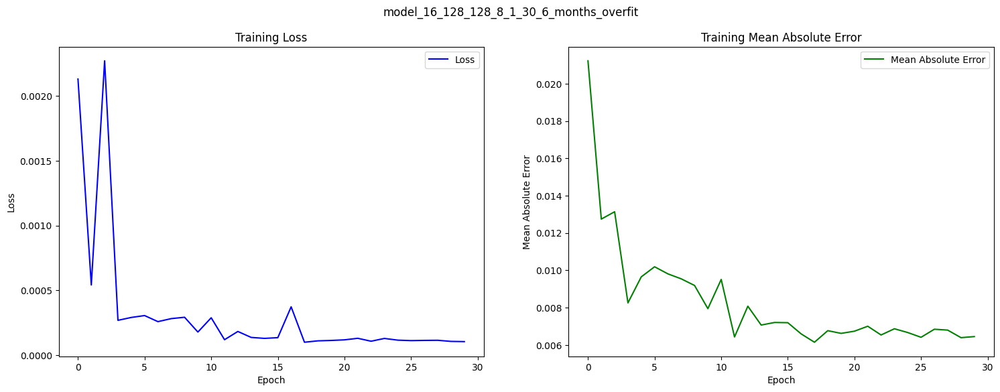

In [115]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_16_128_128_8_1_30_6_months_overfit",
    model_history=history_16_128_128_8_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, increasing the number of neurons in LSTM layers has resulted in a decrease in the mean absolute error. Further steps, include increasing the number of both LSTM layers and neurons during training, might further reduce the mean absolute error.

- 3 LSTM(64-128-128) and 2 Dense(8-1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 1.0524e-04
- Mean Absolute Error: 0.0064

<br></br>
#### **Model Building with 4 LSTM and 4 Dense layers (128-64-64-32-8-8-8-1) and 30 epochs - 3 months**

In [116]:
# Let's create a keras sequential model
model_128_64_64_32_8_8_8_1_30_3_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_32_8_8_8_1_30_3_months_overfit.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_128_64_64_32_8_8_8_1_30_3_months_overfit.add(LSTM(64, return_sequences=True))
model_128_64_64_32_8_8_8_1_30_3_months_overfit.add(LSTM(64, return_sequences=True))
model_128_64_64_32_8_8_8_1_30_3_months_overfit.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_32_8_8_8_1_30_3_months_overfit.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_3_months_overfit.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_3_months_overfit.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_3_months_overfit.add(Dense(1))

In [117]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_32_8_8_8_1_30_3_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [118]:
# Let's fit the sequential model with input features and output label
history_128_64_64_32_8_8_8_1_30_3_months_overfit = (
    model_128_64_64_32_8_8_8_1_30_3_months_overfit.fit(
        overall_x_train_3_months,
        overall_y_train_3_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2929/2929 [==============================] - 82s 27ms/step - loss: 0.0024 - mean_absolute_error: 0.0256
Epoch 2/30
2929/2929 [==============================] - 79s 27ms/step - loss: 9.3084e-04 - mean_absolute_error: 0.0192
Epoch 3/30
2929/2929 [==============================] - 81s 28ms/step - loss: 0.0186 - mean_absolute_error: 0.0740
Epoch 4/30
2929/2929 [==============================] - 82s 28ms/step - loss: 0.0295 - mean_absolute_error: 0.1170
Epoch 5/30
2929/2929 [==============================] - 79s 27ms/step - loss: 0.0294 - mean_absolute_error: 0.1174
Epoch 6/30
2929/2929 [==============================] - 78s 27ms/step - loss: 0.0294 - mean_absolute_error: 0.1177
Epoch 7/30
2929/2929 [==============================] - 78s 27ms/step - loss: 0.0293 - mean_absolute_error: 0.1177
Epoch 8/30
2929/2929 [==============================] - 82s 28ms/step - loss: 0.0292 - mean_absolute_error: 0.1170
Epoch 9/30
2929/2929 [==============================] - 78s 27ms/step - loss

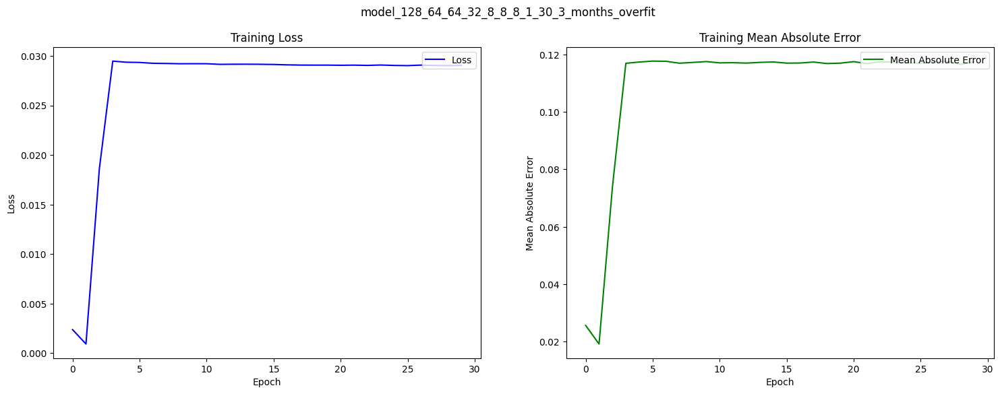

In [119]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_128_64_64_32_8_8_8_1_30_3_months_overfit",
    model_history=history_128_64_64_32_8_8_8_1_30_3_months_overfit,
)

##### **Observations**
Using three months of data as a window to predict the stock price, training loss and mean absolute error are increasing gradually. Increasing the number of neurons in LSTM layers has resulted in an increase in mean absolute error when compared to one LSTM and one dense layer, which was trained for 30 epochs.

- 4 LSTM(128-64-64-32) 4 Dense(8-8-8-1)
- Epochs: 30
- Batch Size: 1
- Training Loss: 0.0291
- Mean Absolute Error: 0.1175

<br></br>
#### **Model Building with 4 LSTM and 4 Dense layers (128-64-64-32-8-8-8-1) and 30 epochs - 6 months**

In [120]:
# Let's create a keras sequential model
model_128_64_64_32_8_8_8_1_30_6_months_overfit = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_32_8_8_8_1_30_6_months_overfit.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_128_64_64_32_8_8_8_1_30_6_months_overfit.add(LSTM(64, return_sequences=True))
model_128_64_64_32_8_8_8_1_30_6_months_overfit.add(LSTM(64, return_sequences=True))
model_128_64_64_32_8_8_8_1_30_6_months_overfit.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_32_8_8_8_1_30_6_months_overfit.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_6_months_overfit.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_6_months_overfit.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_6_months_overfit.add(Dense(1))

In [121]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_32_8_8_8_1_30_6_months_overfit.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [122]:
# Let's fit the sequential model with input features and output label
history_128_64_64_32_8_8_8_1_30_6_months_overfit = (
    model_128_64_64_32_8_8_8_1_30_6_months_overfit.fit(
        overall_x_train_6_months,
        overall_y_train_6_months,
        batch_size=1,
        epochs=30,
    )
)

Epoch 1/30
2839/2839 [==============================] - 154s 54ms/step - loss: 0.0020 - mean_absolute_error: 0.0247
Epoch 2/30
2839/2839 [==============================] - 152s 54ms/step - loss: 0.0013 - mean_absolute_error: 0.0211
Epoch 3/30
2839/2839 [==============================] - 152s 54ms/step - loss: 8.4741e-04 - mean_absolute_error: 0.0165
Epoch 4/30
2839/2839 [==============================] - 152s 53ms/step - loss: 4.5321e-04 - mean_absolute_error: 0.0139
Epoch 5/30
2839/2839 [==============================] - 154s 54ms/step - loss: 5.3346e-04 - mean_absolute_error: 0.0134
Epoch 6/30
2839/2839 [==============================] - 152s 54ms/step - loss: 3.0682e-04 - mean_absolute_error: 0.0112
Epoch 7/30
2839/2839 [==============================] - 155s 55ms/step - loss: 2.9179e-04 - mean_absolute_error: 0.0106
Epoch 8/30
2839/2839 [==============================] - 154s 54ms/step - loss: 2.4326e-04 - mean_absolute_error: 0.0100
Epoch 9/30
2839/2839 [==========================

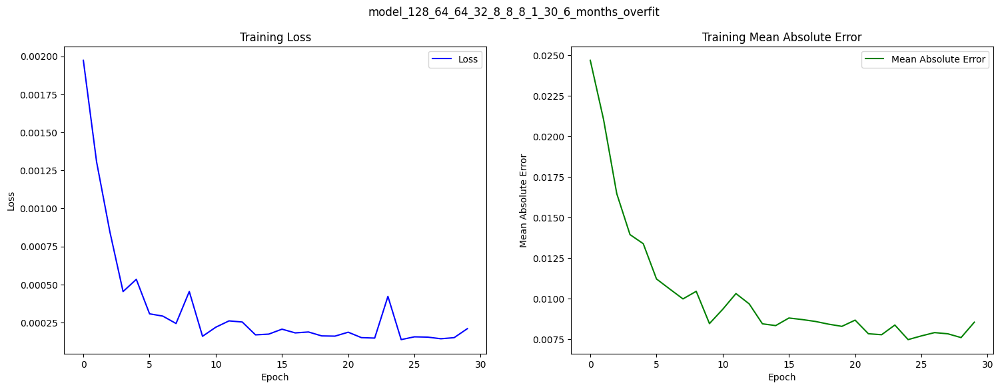

In [123]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae(
    model_name="model_128_64_64_32_8_8_8_1_30_6_months_overfit",
    model_history=history_128_64_64_32_8_8_8_1_30_6_months_overfit,
)

##### **Observations**
Using six months of data as a window to predict the stock price, training loss and mean absolute error are increasing gradually. Increasing the number of neurons in LSTM layers has resulted in an increase in mean absolute error when compared to one LSTM and one dense layer, which was trained for 30 epochs.

- 4 LSTM(128-64-64-32) 4 Dense(8-8-8-1) - 6 months
- Epochs: 30
- Batch Size: 1
- Training Loss: 2.0935e-04
- Mean Absolute Error: 0.0085

<br></br>
### **Increasing Validation Accuracy**

In [277]:
# Let's import keras package and set the logging status to ERROR
import keras

tf.compat.v1.logging.set_verbosity(tf.compat.v1.logging.ERROR)

In [288]:
# Function to plot the training and validation loss and mean absolute error
def plot_loss_and_mae_validation(model_name, model_history):
    figure, (ax1, ax2) = plt.subplots(
        1, 2, figsize=(18, 6)
    )  # Define a figure with two subplots
    figure.suptitle(model_name)  # Set the title of the figure

    # Plot the training and validation loss on the first subplot
    ax1.plot(
        model_history.history["loss"], label="Training Loss", color="blue"
    )  # Plot the training loss history
    ax1.plot(
        model_history.history["val_loss"], label="Validation Loss", color="red"
    )  # Plot the validation loss history
    ax1.set_title("Training and Validation Loss")  # Title for the loss plot
    ax1.set_xlabel("Epoch")  # Label for the x-axis
    ax1.set_ylabel("Loss")  # Label for the y-axis
    ax1.legend(loc="upper right")  # Legend positioned in the upper right

    # Plot the training and validation mean absolute error on the second subplot
    ax2.plot(
        model_history.history["mean_absolute_error"],
        label="Training MAE",
        color="green",
    )  # Plot the training MAE history
    ax2.plot(
        model_history.history["val_mean_absolute_error"],
        label="Validation MAE",
        color="orange",
    )  # Plot the validation MAE history
    ax2.set_title("Training and Validation MAE")  # Title for the MAE plot
    ax2.set_xlabel("Epoch")  # Label for the x-axis
    ax2.set_ylabel("Mean Absolute Error")  # Label for the y-axis
    ax2.legend(loc="upper right")  # Legend positioned in the upper right

    plt.show()  # Show the plot

<br></br>
#### **Model Building with one LSTM layer and one Dense Layer (8-1) and 30 epochs - 3 months**

In [129]:
# Let's create a keras sequential model
model_8_1_30_3_months_validation = Sequential()

# Let's add LSTM layer to the model network
model_8_1_30_3_months_validation.add(
    LSTM(8, return_sequences=False, input_shape=(x_train_3_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_8_1_30_3_months_validation.add(Dense(1))

In [130]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [131]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_8_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_8_1_30_3_months_validation = model_8_1_30_3_months_validation.fit(
    x_train_3_months,
    y_train_3_months,
    batch_size=16,
    epochs=30,
    validation_data=(x_valid_3_months, y_valid_3_months),
    callbacks=[cb_check, cb_early],
)

Epoch 1/30
146/146 [==============================] - 4s 18ms/step - loss: 0.0032 - mean_absolute_error: 0.0389 - val_loss: 0.0016 - val_mean_absolute_error: 0.0382
Epoch 2/30
146/146 [==============================] - 6s 38ms/step - loss: 7.8524e-05 - mean_absolute_error: 0.0055 - val_loss: 2.2856e-04 - val_mean_absolute_error: 0.0121
Epoch 3/30
146/146 [==============================] - 1s 8ms/step - loss: 2.5850e-05 - mean_absolute_error: 0.0034 - val_loss: 2.5316e-04 - val_mean_absolute_error: 0.0126
Epoch 4/30
146/146 [==============================] - 2s 16ms/step - loss: 2.1940e-05 - mean_absolute_error: 0.0030 - val_loss: 2.2610e-04 - val_mean_absolute_error: 0.0120
Epoch 5/30
146/146 [==============================] - 2s 16ms/step - loss: 2.0836e-05 - mean_absolute_error: 0.0028 - val_loss: 2.0072e-04 - val_mean_absolute_error: 0.0115
Epoch 6/30
146/146 [==============================] - 1s 8ms/step - loss: 1.8935e-05 - mean_absolute_error: 0.0026 - val_loss: 2.0363e-04 - val_

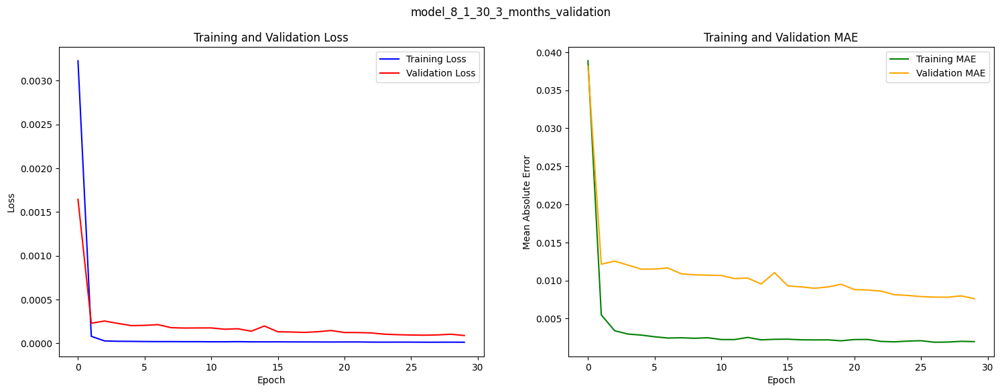

In [132]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_8_1_30_3_months_validation",
    model_history=history_8_1_30_3_months_validation,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation mean absolute error is fluctuating, i.e., increasing and decreasing. One option to potentially decrease the validation MAE further is to increase or decrease the model's complexity by adding more layers or neurons.

- 1 LSTM(8) 1 Dense(1) - 3 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 1.0982e-05
- Validation Loss: 8.7737e-05
- Training MAE: 0.0020
- Validation MAE: 0.0076

<br></br>
#### **Model Building with one LSTM layer and one Dense Layer (8-1) and 30 epochs - 6 months**

In [133]:
# Let's create a keras sequential model
model_8_1_30_6_months_validation = Sequential()

# Let's add LSTM layer to the model network
model_8_1_30_6_months_validation.add(
    LSTM(8, return_sequences=False, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_8_1_30_6_months_validation.add(Dense(1))

In [134]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [135]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_8_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_8_1_30_6_months_validation = model_8_1_30_6_months_validation.fit(
    x_train_6_months,
    y_train_6_months,
    batch_size=16,
    epochs=30,
    validation_data=(x_valid_6_months, y_valid_6_months),
    callbacks=[cb_check, cb_early],
)

Epoch 1/30
140/140 [==============================] - 4s 23ms/step - loss: 3.9203e-05 - mean_absolute_error: 0.0037 - val_loss: 2.4682e-04 - val_mean_absolute_error: 0.0126
Epoch 2/30
140/140 [==============================] - 3s 22ms/step - loss: 2.1954e-05 - mean_absolute_error: 0.0027 - val_loss: 2.2222e-04 - val_mean_absolute_error: 0.0119
Epoch 3/30
140/140 [==============================] - 3s 21ms/step - loss: 2.0909e-05 - mean_absolute_error: 0.0027 - val_loss: 1.8407e-04 - val_mean_absolute_error: 0.0112
Epoch 4/30
140/140 [==============================] - 3s 21ms/step - loss: 1.9613e-05 - mean_absolute_error: 0.0026 - val_loss: 1.7649e-04 - val_mean_absolute_error: 0.0108
Epoch 5/30
140/140 [==============================] - 3s 22ms/step - loss: 1.8573e-05 - mean_absolute_error: 0.0026 - val_loss: 1.6033e-04 - val_mean_absolute_error: 0.0104
Epoch 6/30
140/140 [==============================] - 2s 15ms/step - loss: 1.7676e-05 - mean_absolute_error: 0.0025 - val_loss: 1.7206e

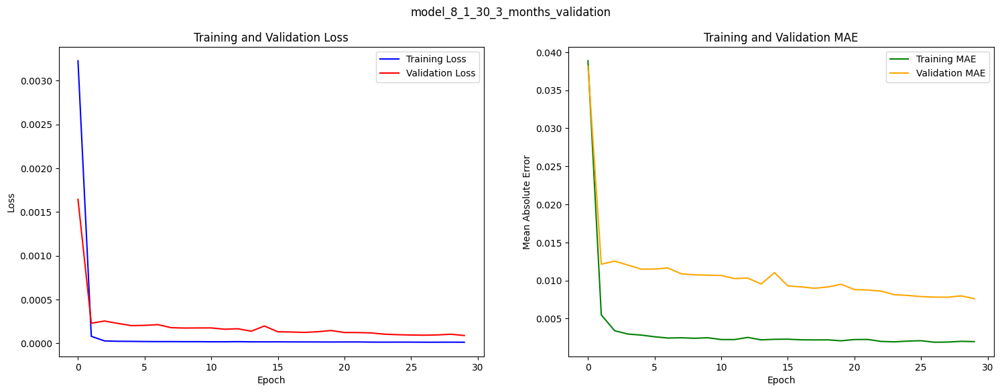

In [136]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_8_1_30_3_months_validation",
    model_history=history_8_1_30_3_months_validation,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation mean absolute error is fluctuating, i.e., increasing and decreasing. The observed validation MAE is lower compared to that using three months of data as a window. One option to potentially decrease the validation MAE further is to increase or decrease the model's complexity by adding more layers or neurons.

- 1 LSTM(8) 1 Dense(1) - 6 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 1.1369e-05
- Validation Loss: 6.8301e-05
- Training MAE: 0.0021
- Validation MAE: 0.0068

<br></br>
#### **Model Building with one LSTM layer and one Dense Layer (64-1) and 30 epochs - 3 months**

In [137]:
# Let's create a keras sequential model
model_64_1_30_3_months_validation = Sequential()

# Let's add LSTM layer to the model network
model_64_1_30_3_months_validation.add(
    LSTM(64, return_sequences=False, input_shape=(x_train_3_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_64_1_30_3_months_validation.add(Dense(1))

In [138]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_64_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [139]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_64_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_64_1_30_3_months_validation = model_64_1_30_3_months_validation.fit(
    x_train_3_months,
    y_train_3_months,
    batch_size=16,
    epochs=30,
    callbacks=[cb_check, cb_early],
    validation_data=(x_valid_3_months, y_valid_3_months),
)

Epoch 1/30
146/146 [==============================] - 5s 30ms/step - loss: 2.1252e-04 - mean_absolute_error: 0.0066 - val_loss: 2.2478e-04 - val_mean_absolute_error: 0.0124
Epoch 2/30
146/146 [==============================] - 3s 19ms/step - loss: 2.7293e-05 - mean_absolute_error: 0.0033 - val_loss: 2.1015e-04 - val_mean_absolute_error: 0.0118
Epoch 3/30
146/146 [==============================] - 2s 13ms/step - loss: 2.3973e-05 - mean_absolute_error: 0.0031 - val_loss: 2.2477e-04 - val_mean_absolute_error: 0.0118
Epoch 4/30
146/146 [==============================] - 3s 18ms/step - loss: 2.1215e-05 - mean_absolute_error: 0.0028 - val_loss: 1.4018e-04 - val_mean_absolute_error: 0.0096
Epoch 5/30
146/146 [==============================] - 3s 18ms/step - loss: 1.8734e-05 - mean_absolute_error: 0.0026 - val_loss: 1.3327e-04 - val_mean_absolute_error: 0.0094
Epoch 6/30
146/146 [==============================] - 2s 12ms/step - loss: 1.6463e-05 - mean_absolute_error: 0.0025 - val_loss: 2.5561e

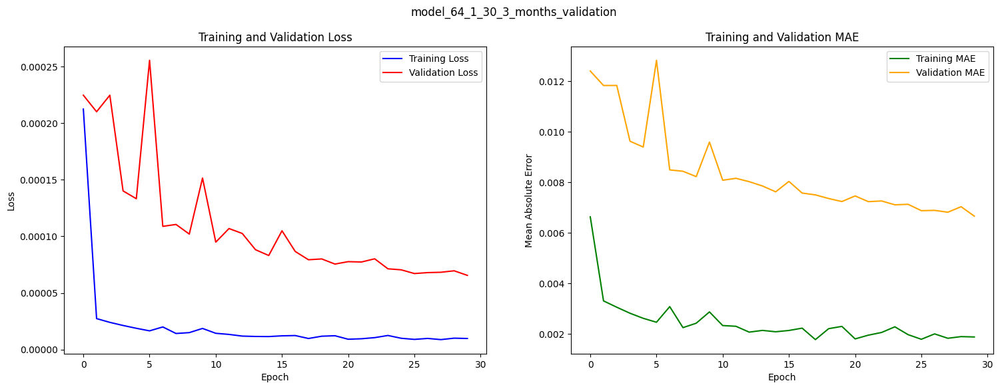

In [140]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_64_1_30_3_months_validation",
    model_history=history_64_1_30_3_months_validation,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation loss and validation mean absolute error are fluctuating, i.e., increasing and decreasing. The observed validation MAE is lower compared to that using one LSTM layer with one neuron. One option to potentially decrease the validation MAE further is to increase or decrease the model's complexity by adding/reducing more layers or neurons.

- 1 LSTM(64) 1 Dense(1) - 3 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 9.7072e-06
- Validation Loss: 6.5499e-05
- Training MAE: 0.0019
- Validation MAE: 0.0067

<br></br>
#### **Model Building with one LSTM layer and one Dense Layer (64-1) and 30 epochs - 6 months**

In [141]:
# Let's create a keras sequential model
model_64_1_30_6_months_validation = Sequential()

# Let's add LSTM layer to the model network
model_64_1_30_6_months_validation.add(
    LSTM(64, return_sequences=False, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_64_1_30_6_months_validation.add(Dense(1))

In [142]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_64_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [143]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_64_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_64_1_30_6_months_validation = model_64_1_30_6_months_validation.fit(
    x_train_6_months,
    y_train_6_months,
    batch_size=16,
    epochs=30,
    callbacks=[cb_check, cb_early],
    validation_data=(x_valid_6_months, y_valid_6_months),
)

Epoch 1/30
140/140 [==============================] - 5s 32ms/step - loss: 1.8658e-04 - mean_absolute_error: 0.0065 - val_loss: 2.3132e-04 - val_mean_absolute_error: 0.0125
Epoch 2/30
140/140 [==============================] - 4s 30ms/step - loss: 2.8214e-05 - mean_absolute_error: 0.0032 - val_loss: 1.9370e-04 - val_mean_absolute_error: 0.0114
Epoch 3/30
140/140 [==============================] - 4s 30ms/step - loss: 2.4355e-05 - mean_absolute_error: 0.0031 - val_loss: 1.7152e-04 - val_mean_absolute_error: 0.0105
Epoch 4/30
140/140 [==============================] - 5s 37ms/step - loss: 2.8602e-05 - mean_absolute_error: 0.0035 - val_loss: 1.6264e-04 - val_mean_absolute_error: 0.0103
Epoch 5/30
140/140 [==============================] - 4s 29ms/step - loss: 1.8020e-05 - mean_absolute_error: 0.0026 - val_loss: 1.6054e-04 - val_mean_absolute_error: 0.0100
Epoch 6/30
140/140 [==============================] - 4s 29ms/step - loss: 1.9152e-05 - mean_absolute_error: 0.0027 - val_loss: 1.1625e

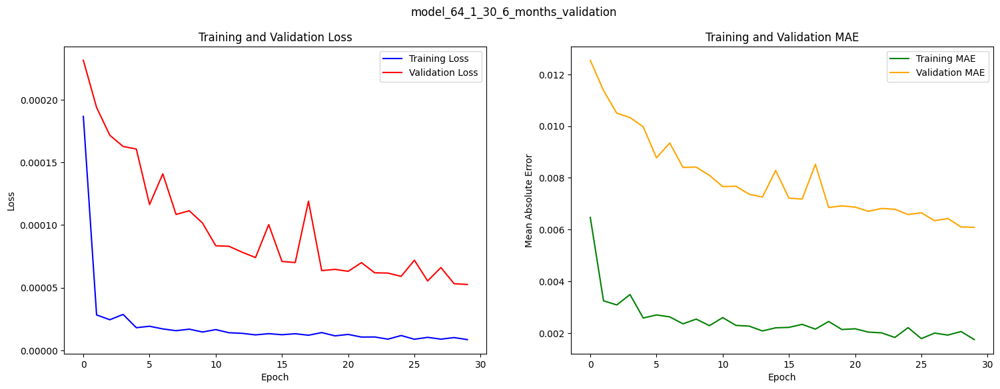

In [144]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_64_1_30_6_months_validation",
    model_history=history_64_1_30_6_months_validation,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation loss and validation mean absolute error are fluctuating, i.e., increasing and decreasing. The observed validation MAE is lower compared to that using three months of data as a window. One option to potentially further decrease the validation MAE is to increase or decrease the model's complexity by adding or reducing layers or neurons.

- 1 LSTM(64) 1 Dense(1) - 6 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 8.5071e-06
- Validation Loss: 5.2503e-05
- Training MAE: 0.0017
- Validation MAE: 0.0061

<br></br>
#### **Model Building with one LSTM layer and Dense layer (128-1) and 30 epochs - 3 months**

In [145]:
# Let's create a keras sequential model
model_128_1_30_3_months_validation = Sequential()

# Let's add LSTM layer to the model network
model_128_1_30_3_months_validation.add(
    LSTM(128, return_sequences=False, input_shape=(x_train_3_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_128_1_30_3_months_validation.add(Dense(1))

In [146]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [147]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_1_30_3_months_validation = model_128_1_30_3_months_validation.fit(
    x_train_3_months,
    y_train_3_months,
    batch_size=16,
    epochs=30,
    callbacks=[cb_check, cb_early],
    validation_data=(x_valid_3_months, y_valid_3_months),
)

Epoch 1/30
146/146 [==============================] - 7s 41ms/step - loss: 2.3608e-04 - mean_absolute_error: 0.0066 - val_loss: 2.1569e-04 - val_mean_absolute_error: 0.0119
Epoch 2/30
146/146 [==============================] - 4s 25ms/step - loss: 2.7367e-05 - mean_absolute_error: 0.0032 - val_loss: 2.1988e-04 - val_mean_absolute_error: 0.0117
Epoch 3/30
146/146 [==============================] - 5s 31ms/step - loss: 2.1176e-05 - mean_absolute_error: 0.0028 - val_loss: 1.4830e-04 - val_mean_absolute_error: 0.0098
Epoch 4/30
146/146 [==============================] - 4s 31ms/step - loss: 2.1537e-05 - mean_absolute_error: 0.0030 - val_loss: 1.3202e-04 - val_mean_absolute_error: 0.0092
Epoch 5/30
146/146 [==============================] - 5s 31ms/step - loss: 2.0688e-05 - mean_absolute_error: 0.0029 - val_loss: 1.2300e-04 - val_mean_absolute_error: 0.0090
Epoch 6/30
146/146 [==============================] - 4s 24ms/step - loss: 1.8999e-05 - mean_absolute_error: 0.0027 - val_loss: 1.6314e

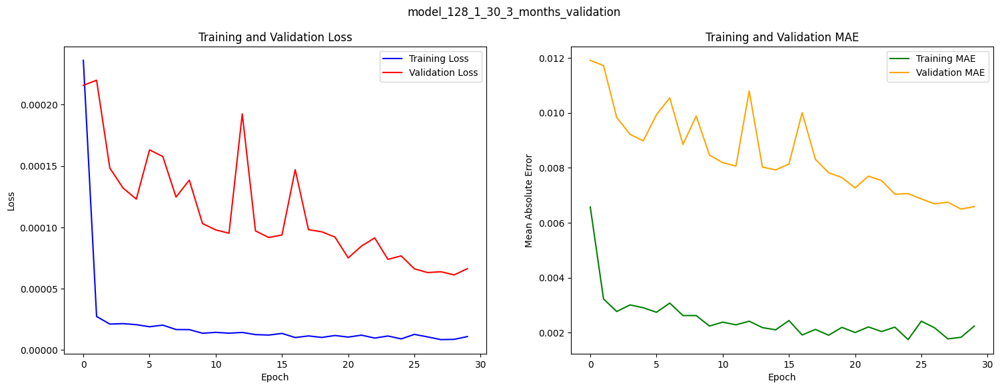

In [148]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_1_30_3_months_validation",
    model_history=history_128_1_30_3_months_validation,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation loss and validation mean absolute error are fluctuating, i.e., increasing and decreasing. The observed validation MAE is higher compared to that of using one LSTM layer with 64 neurons with 6 months of data as a window. One option to potentially further decrease the validation MAE is to increase or decrease the model's complexity by adding or reducing layers or neurons.

- 1 LSTM(128) 1 Dense(1) - 3 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 1.0987e-05
- Validation Loss: 6.6363e-05
- Training MAE: 0.0022
- Validation MAE: 0.0065

<br></br>
#### **Model Building with one LSTM layer and Dense layer (128-1) and 30 epochs - 6 months**

In [149]:
# Let's create a keras sequential model
model_128_1_30_6_months_validation = Sequential()

# Let's add LSTM layer to the model network
model_128_1_30_6_months_validation.add(
    LSTM(128, return_sequences=False, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add dense layer to the model network
model_128_1_30_6_months_validation.add(Dense(1))

In [150]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [151]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_1_30_6_months_validation = model_128_1_30_6_months_validation.fit(
    x_train_6_months,
    y_train_6_months,
    batch_size=16,
    epochs=30,
    callbacks=[cb_check, cb_early],
    validation_data=(x_valid_6_months, y_valid_6_months),
)

Epoch 1/30
140/140 [==============================] - 9s 57ms/step - loss: 1.2548e-04 - mean_absolute_error: 0.0056 - val_loss: 1.6437e-04 - val_mean_absolute_error: 0.0105
Epoch 2/30
140/140 [==============================] - 8s 55ms/step - loss: 2.6504e-05 - mean_absolute_error: 0.0034 - val_loss: 1.6220e-04 - val_mean_absolute_error: 0.0103
Epoch 3/30
140/140 [==============================] - 8s 57ms/step - loss: 2.1865e-05 - mean_absolute_error: 0.0031 - val_loss: 1.2300e-04 - val_mean_absolute_error: 0.0090
Epoch 4/30
140/140 [==============================] - 8s 57ms/step - loss: 2.0788e-05 - mean_absolute_error: 0.0028 - val_loss: 1.1704e-04 - val_mean_absolute_error: 0.0087
Epoch 5/30
140/140 [==============================] - 8s 57ms/step - loss: 1.9368e-05 - mean_absolute_error: 0.0028 - val_loss: 9.4113e-05 - val_mean_absolute_error: 0.0081
Epoch 6/30
140/140 [==============================] - 7s 48ms/step - loss: 1.6071e-05 - mean_absolute_error: 0.0025 - val_loss: 9.5063e

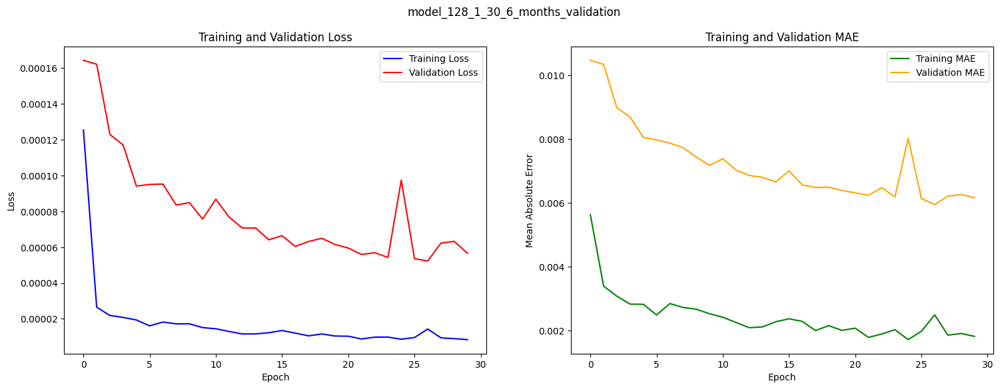

In [152]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_1_30_6_months_validation",
    model_history=history_128_1_30_6_months_validation,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation loss and validation mean absolute error are fluctuating, i.e., increasing and decreasing. The observed validation MAE is similar to that of compared to that of using one LSTM layer with 64 neurons with 6 months of data as a window. One option to potentially further decrease the validation MAE is to increase or decrease the model's complexity by adding or reducing layers or neurons.

- 1 LSTM(128) 1 Dense(1) - 6 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 8.3871e-06
- Validation Loss: 5.6586e-05
- Training MAE: 0.0018
- Validation MAE: 0.0062

<br></br>
#### **Model Building with 2 LSTM layers and two Dense layers (128-64-8-1) and 30 epochs - 3 months**

In [153]:
# Let's create a keras sequential model
model_128_64_8_1_30_3_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_8_1_30_3_months_validation.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_128_64_8_1_30_3_months_validation.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_8_1_30_3_months_validation.add(Dense(8))
model_128_64_8_1_30_3_months_validation.add(Dense(1))

In [154]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_8_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [155]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_8_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_8_1_30_3_months_validation = model_128_64_8_1_30_3_months_validation.fit(
    x_train_3_months,
    y_train_3_months,
    batch_size=16,
    epochs=30,
    callbacks=[cb_check, cb_early],
    validation_data=(x_valid_3_months, y_valid_3_months),
)

Epoch 1/30
146/146 [==============================] - 10s 60ms/step - loss: 1.5865e-04 - mean_absolute_error: 0.0061 - val_loss: 3.4999e-04 - val_mean_absolute_error: 0.0147
Epoch 2/30
146/146 [==============================] - 8s 58ms/step - loss: 4.0777e-05 - mean_absolute_error: 0.0043 - val_loss: 1.8920e-04 - val_mean_absolute_error: 0.0113
Epoch 3/30
146/146 [==============================] - 9s 59ms/step - loss: 3.1651e-05 - mean_absolute_error: 0.0037 - val_loss: 1.5898e-04 - val_mean_absolute_error: 0.0103
Epoch 4/30
146/146 [==============================] - 7s 49ms/step - loss: 3.3430e-05 - mean_absolute_error: 0.0041 - val_loss: 1.5997e-04 - val_mean_absolute_error: 0.0103
Epoch 5/30
146/146 [==============================] - 9s 59ms/step - loss: 5.2252e-05 - mean_absolute_error: 0.0048 - val_loss: 1.4264e-04 - val_mean_absolute_error: 0.0096
Epoch 6/30
146/146 [==============================] - 11s 72ms/step - loss: 2.0082e-05 - mean_absolute_error: 0.0029 - val_loss: 1.225

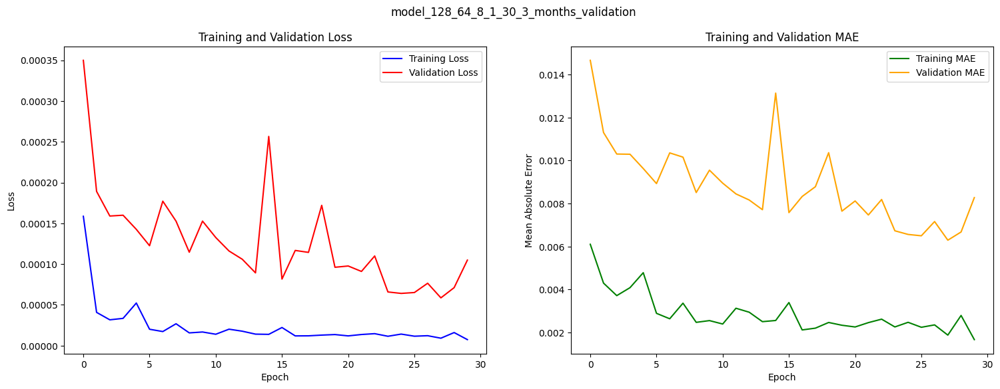

In [156]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_8_1_30_3_months_validation",
    model_history=history_128_64_8_1_30_3_months_validation,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation loss and validation MAE are fluctuating, i.e., increasing and decreasing. The observed validation MAE is higher to that of compared to that of using one LSTM layer with 128 neurons with 6 months of data as a window. One option to potentially decrease the validation MAE further is to increase or decrease the model's complexity.

- 2 LSTM(128-64) 2 Dense(8-1) - 3 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 7.3708e-06
- Validation Loss: 1.0489e-04
- Training MAE: 0.0017
- Validation MAE: 0.0083

<br></br>
#### **Model Building with 2 LSTM layers and two Dense layers (128-64-8-1) and 30 epochs - 6 months**

In [157]:
# Let's create a keras sequential model
model_128_64_8_1_30_6_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_8_1_30_6_months_validation.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_128_64_8_1_30_6_months_validation.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_8_1_30_6_months_validation.add(Dense(8))
model_128_64_8_1_30_6_months_validation.add(Dense(1))

In [158]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_8_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [159]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_8_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_8_1_30_6_months_validation = model_128_64_8_1_30_6_months_validation.fit(
    x_train_6_months,
    y_train_6_months,
    batch_size=16,
    epochs=30,
    callbacks=[cb_check, cb_early],
    validation_data=(x_valid_6_months, y_valid_6_months),
)

Epoch 1/30
140/140 [==============================] - 16s 105ms/step - loss: 2.3243e-04 - mean_absolute_error: 0.0071 - val_loss: 3.1130e-04 - val_mean_absolute_error: 0.0138
Epoch 2/30
140/140 [==============================] - 16s 114ms/step - loss: 4.1988e-05 - mean_absolute_error: 0.0042 - val_loss: 2.2554e-04 - val_mean_absolute_error: 0.0121
Epoch 3/30
140/140 [==============================] - 12s 85ms/step - loss: 3.1558e-05 - mean_absolute_error: 0.0036 - val_loss: 2.2600e-04 - val_mean_absolute_error: 0.0123
Epoch 4/30
140/140 [==============================] - 14s 101ms/step - loss: 2.6691e-05 - mean_absolute_error: 0.0033 - val_loss: 2.0955e-04 - val_mean_absolute_error: 0.0113
Epoch 5/30
140/140 [==============================] - 14s 99ms/step - loss: 2.4613e-05 - mean_absolute_error: 0.0034 - val_loss: 1.3687e-04 - val_mean_absolute_error: 0.0095
Epoch 6/30
140/140 [==============================] - 12s 86ms/step - loss: 2.3111e-05 - mean_absolute_error: 0.0032 - val_loss

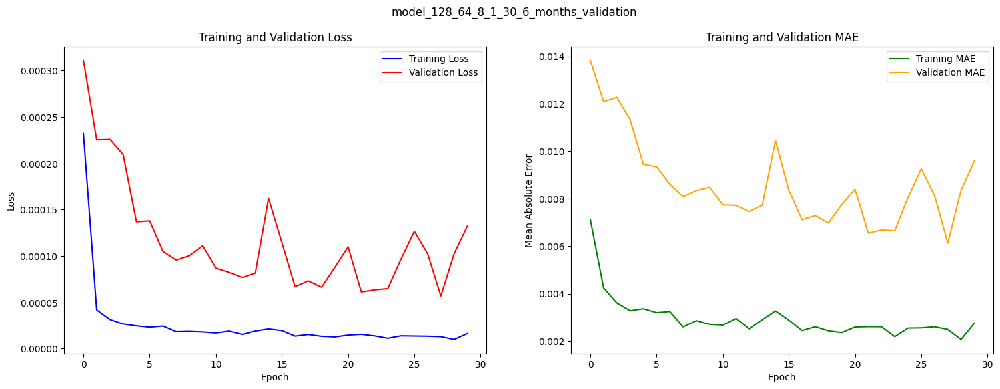

In [160]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_8_1_30_6_months_validation",
    model_history=history_128_64_8_1_30_6_months_validation,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation loss and validation MAE are fluctuating, i.e., increasing and decreasing. The observed validation MAE is almost similar to that of compared to that of using one LSTM layer with 64 neurons with 6 months of data as a window. One option to potentially decrease the validation MAE further is to increase or decrease the model's complexity.

- 2 LSTM(128-64) 2 Dense(8-1) - 6 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 1.6302e-05
- Validation Loss: 1.3228e-04
- Training MAE: 0.0028
- Validation MAE: 0.0061

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 3 months**

In [161]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_3_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_3_months_validation.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_128_64_64_8_8_1_30_3_months_validation.add(LSTM(64, return_sequences=True))
model_128_64_64_8_8_1_30_3_months_validation.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_3_months_validation.add(Dense(8))
model_128_64_64_8_8_1_30_3_months_validation.add(Dense(8))
model_128_64_64_8_8_1_30_3_months_validation.add(Dense(1))

In [162]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [163]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_3_months_validation = (
    model_128_64_64_8_8_1_30_3_months_validation.fit(
        x_train_3_months,
        y_train_3_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_3_months, y_valid_3_months),
    )
)

Epoch 1/30
146/146 [==============================] - 14s 85ms/step - loss: 2.3189e-04 - mean_absolute_error: 0.0083 - val_loss: 6.6465e-04 - val_mean_absolute_error: 0.0205
Epoch 2/30
146/146 [==============================] - 9s 63ms/step - loss: 6.7811e-05 - mean_absolute_error: 0.0052 - val_loss: 7.0893e-04 - val_mean_absolute_error: 0.0210
Epoch 3/30
146/146 [==============================] - 12s 81ms/step - loss: 7.1001e-05 - mean_absolute_error: 0.0059 - val_loss: 5.0707e-04 - val_mean_absolute_error: 0.0183
Epoch 4/30
146/146 [==============================] - 13s 89ms/step - loss: 3.9086e-05 - mean_absolute_error: 0.0040 - val_loss: 2.6350e-04 - val_mean_absolute_error: 0.0135
Epoch 5/30
146/146 [==============================] - 9s 60ms/step - loss: 4.2576e-05 - mean_absolute_error: 0.0045 - val_loss: 3.1700e-04 - val_mean_absolute_error: 0.0141
Epoch 6/30
146/146 [==============================] - 12s 80ms/step - loss: 3.4198e-05 - mean_absolute_error: 0.0040 - val_loss: 1.9

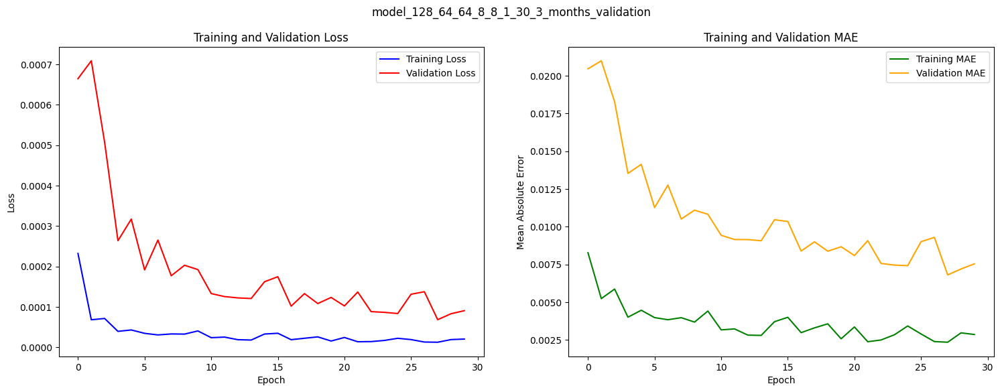

In [164]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_3_months_validation",
    model_history=history_128_64_64_8_8_1_30_3_months_validation,
)

##### **Observations**
Using three months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation loss and validation MAE are fluctuating, i.e., increasing and decreasing. The observed validation MAE is almost similar to that of compared to that of using 2 LSTM layers and 2 Dense layers with 6 months of data as a window. One option to potentially decrease the validation MAE further is to increase or decrease the model's complexity.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 3 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 2.0030e-05
- Validation Loss: 9.0370e-05
- Training MAE: 0.0023
- Validation MAE: 0.0068

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [165]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_validation.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_128_64_64_8_8_1_30_6_months_validation.add(LSTM(64, return_sequences=True))
model_128_64_64_8_8_1_30_6_months_validation.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_validation.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation.add(Dense(1))

In [166]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [167]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_validation = (
    model_128_64_64_8_8_1_30_6_months_validation.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 23s 136ms/step - loss: 1.8734e-04 - mean_absolute_error: 0.0077 - val_loss: 3.8976e-04 - val_mean_absolute_error: 0.0166
Epoch 2/30
140/140 [==============================] - 16s 115ms/step - loss: 5.6671e-05 - mean_absolute_error: 0.0050 - val_loss: 6.7751e-04 - val_mean_absolute_error: 0.0217
Epoch 3/30
140/140 [==============================] - 19s 136ms/step - loss: 4.2503e-05 - mean_absolute_error: 0.0041 - val_loss: 2.6947e-04 - val_mean_absolute_error: 0.0135
Epoch 4/30
140/140 [==============================] - 16s 117ms/step - loss: 3.8298e-05 - mean_absolute_error: 0.0041 - val_loss: 3.6633e-04 - val_mean_absolute_error: 0.0150
Epoch 5/30
140/140 [==============================] - 19s 136ms/step - loss: 4.9774e-05 - mean_absolute_error: 0.0049 - val_loss: 2.6623e-04 - val_mean_absolute_error: 0.0134
Epoch 6/30
140/140 [==============================] - 20s 142ms/step - loss: 2.5409e-05 - mean_absolute_error: 0.0032 - val_l

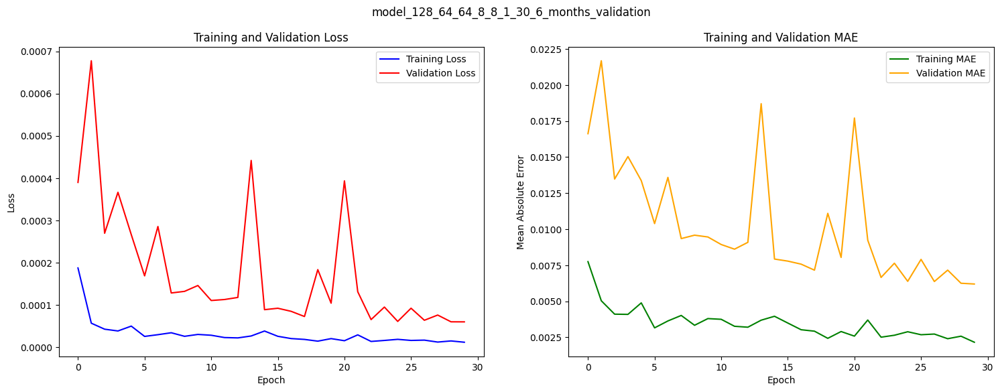

In [168]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_validation",
    model_history=history_128_64_64_8_8_1_30_6_months_validation,
)

##### **Observations**
Using six months of data as a window to predict the stock price, the training loss and training mean absolute error are decreasing gradually, whereas the validation loss and validation MAE are fluctuating, i.e., increasing and decreasing. The observed validation MAE is almost similar to that of compared to that of using 2 LSTM layers and 2 Dense layers with 6 months of data as a window. One option to potentially decrease the validation MAE further is to increase or decrease the model's complexity.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months
- Epochs: 30
- Batch Size: 16
- Training Loss: 1.1644e-05
- Validation Loss: 5.9832e-05
- Training MAE: 0.0022
- Validation MAE: 0.0062

<br></br>
#### **Model Building with 4 LSTM and 3 Dense layers (8-16-16-32-8-8-1) and 30 epochs - 3 months**

In [169]:
# Let's create a keras sequential model
model_8_16_16_32_8_8_1_30_3_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_8_8_1_30_3_months_validation.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_8_16_16_32_8_8_1_30_3_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_8_8_1_30_3_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_8_8_1_30_3_months_validation.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_8_8_1_30_3_months_validation.add(Dense(8))
model_8_16_16_32_8_8_1_30_3_months_validation.add(Dense(8))
model_8_16_16_32_8_8_1_30_3_months_validation.add(Dense(1))

In [170]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_8_8_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [171]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_8_16_16_32_8_8_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_8_16_16_32_8_8_1_30_3_months_validation = (
    model_8_16_16_32_8_8_1_30_3_months_validation.fit(
        x_train_3_months,
        y_train_3_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_3_months, y_valid_3_months),
    )
)

Epoch 1/30
146/146 [==============================] - 13s 70ms/step - loss: 7.2493e-04 - mean_absolute_error: 0.0151 - val_loss: 0.0011 - val_mean_absolute_error: 0.0272
Epoch 2/30
146/146 [==============================] - 5s 34ms/step - loss: 7.9525e-05 - mean_absolute_error: 0.0057 - val_loss: 0.0015 - val_mean_absolute_error: 0.0301
Epoch 3/30
146/146 [==============================] - 5s 34ms/step - loss: 6.7729e-05 - mean_absolute_error: 0.0053 - val_loss: 0.0016 - val_mean_absolute_error: 0.0315
Epoch 4/30
146/146 [==============================] - 8s 56ms/step - loss: 6.7200e-05 - mean_absolute_error: 0.0051 - val_loss: 9.1907e-04 - val_mean_absolute_error: 0.0241
Epoch 5/30
146/146 [==============================] - 8s 58ms/step - loss: 6.2734e-05 - mean_absolute_error: 0.0052 - val_loss: 7.1895e-04 - val_mean_absolute_error: 0.0217
Epoch 6/30
146/146 [==============================] - 5s 35ms/step - loss: 6.7805e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0013 - val_mean_

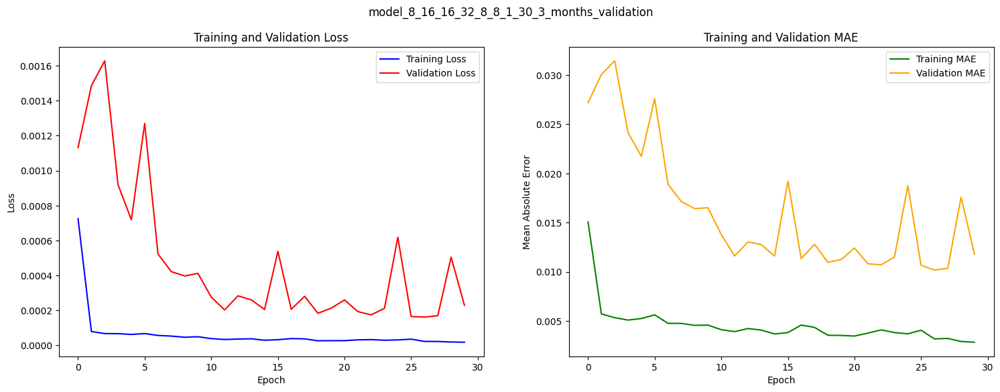

In [172]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_8_16_16_32_8_8_1_30_3_months_validation",
    model_history=history_8_16_16_32_8_8_1_30_3_months_validation,
)

##### **Observations**
Training loss and mean absolute error are decreasing gradually. Increasing the number of layers from three LSTM and three dense layer to four LSTM and three dense layers has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 50 epochs. To potentially further reduce the mean absolute error, increasing the number of epochs may result in a decrease in MAE.

- 3 LSTM(8-16-16-32) 3 Dense(8-8-1)
- Epochs: 50
- Batch Size: 1
- Training Loss: 1.2574e-04
- Mean Absolute Error: 0.0071

<br></br>
#### **Model Building with 4 LSTM and 3 Dense layers (8-16-16-32-8-8-1) and 30 epochs - 6 months**

In [173]:
# Let's create a keras sequential model
model_8_16_16_32_8_8_1_30_6_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_8_8_1_30_6_months_validation.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_8_16_16_32_8_8_1_30_6_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_8_8_1_30_6_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_8_8_1_30_6_months_validation.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_8_8_1_30_6_months_validation.add(Dense(8))
model_8_16_16_32_8_8_1_30_6_months_validation.add(Dense(8))
model_8_16_16_32_8_8_1_30_6_months_validation.add(Dense(1))

In [174]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_8_8_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [175]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_8_16_16_32_8_8_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_8_16_16_32_8_8_1_30_6_months_validation = (
    model_8_16_16_32_8_8_1_30_6_months_validation.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 17s 102ms/step - loss: 5.2403e-04 - mean_absolute_error: 0.0125 - val_loss: 0.0012 - val_mean_absolute_error: 0.0285
Epoch 2/30
140/140 [==============================] - 13s 92ms/step - loss: 9.5819e-05 - mean_absolute_error: 0.0061 - val_loss: 0.0011 - val_mean_absolute_error: 0.0268
Epoch 3/30
140/140 [==============================] - 13s 90ms/step - loss: 9.4477e-05 - mean_absolute_error: 0.0065 - val_loss: 9.2375e-04 - val_mean_absolute_error: 0.0259
Epoch 4/30
140/140 [==============================] - 15s 104ms/step - loss: 1.0992e-04 - mean_absolute_error: 0.0070 - val_loss: 8.4143e-04 - val_mean_absolute_error: 0.0243
Epoch 5/30
140/140 [==============================] - 13s 90ms/step - loss: 7.9623e-05 - mean_absolute_error: 0.0058 - val_loss: 7.3670e-04 - val_mean_absolute_error: 0.0230
Epoch 6/30
140/140 [==============================] - 9s 67ms/step - loss: 7.8633e-05 - mean_absolute_error: 0.0056 - val_loss: 8.3744e-

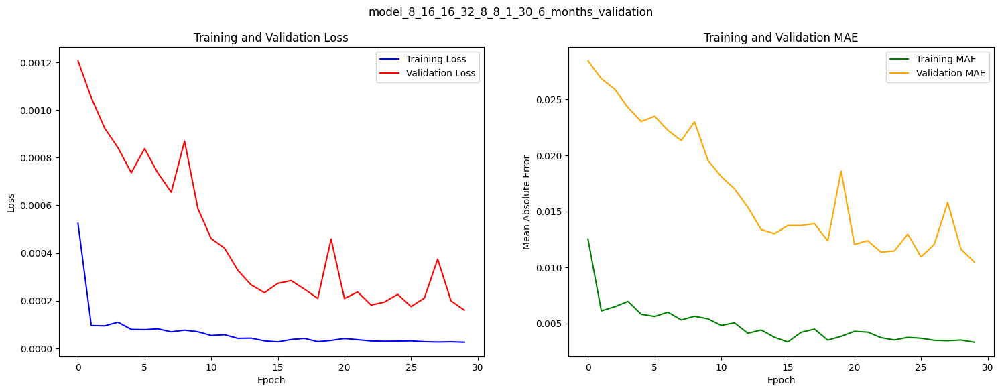

In [176]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_8_16_16_32_8_8_1_30_6_months_validation",
    model_history=history_8_16_16_32_8_8_1_30_6_months_validation,
)

##### **Observations**
Training loss and mean absolute error are decreasing gradually. Increasing the number of layers from three LSTM and three dense layer to four LSTM and three dense layers has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 50 epochs. To potentially further reduce the mean absolute error, increasing the number of epochs may result in a decrease in MAE.

- 3 LSTM(8-16-16-32) 3 Dense(8-8-1)
- Epochs: 50
- Batch Size: 1
- Training Loss: 1.2574e-04
- Mean Absolute Error: 0.0071

<br></br>
#### **Model Building with 4 LSTM and 4 Dense layers (8-16-16-32-32-16-16-1) and 30 epochs - 3 months**

In [177]:
# Let's create a keras sequential model
model_8_16_16_32_32_16_16_1_30_3_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_32_16_16_1_30_3_months_validation.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_8_16_16_32_32_16_16_1_30_3_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_32_16_16_1_30_3_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_32_16_16_1_30_3_months_validation.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_32_16_16_1_30_3_months_validation.add(Dense(32))
model_8_16_16_32_32_16_16_1_30_3_months_validation.add(Dense(16))
model_8_16_16_32_32_16_16_1_30_3_months_validation.add(Dense(16))
model_8_16_16_32_32_16_16_1_30_3_months_validation.add(Dense(1))

In [178]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_32_16_16_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [179]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_8_16_16_32_32_16_16_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_8_16_16_32_32_16_16_1_30_3_months_validation = (
    model_8_16_16_32_32_16_16_1_30_3_months_validation.fit(
        x_train_3_months,
        y_train_3_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_3_months, y_valid_3_months),
    )
)

Epoch 1/30
146/146 [==============================] - 15s 74ms/step - loss: 3.5111e-04 - mean_absolute_error: 0.0102 - val_loss: 0.0010 - val_mean_absolute_error: 0.0264
Epoch 2/30
146/146 [==============================] - 14s 99ms/step - loss: 9.1027e-05 - mean_absolute_error: 0.0065 - val_loss: 8.1941e-04 - val_mean_absolute_error: 0.0240
Epoch 3/30
146/146 [==============================] - 5s 34ms/step - loss: 9.7719e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0046 - val_mean_absolute_error: 0.0572
Epoch 4/30
146/146 [==============================] - 5s 34ms/step - loss: 1.0607e-04 - mean_absolute_error: 0.0067 - val_loss: 9.3181e-04 - val_mean_absolute_error: 0.0246
Epoch 5/30
146/146 [==============================] - 9s 61ms/step - loss: 7.3099e-05 - mean_absolute_error: 0.0057 - val_loss: 6.6123e-04 - val_mean_absolute_error: 0.0218
Epoch 6/30
146/146 [==============================] - 5s 35ms/step - loss: 6.6972e-05 - mean_absolute_error: 0.0053 - val_loss: 7.1324e-04 - 

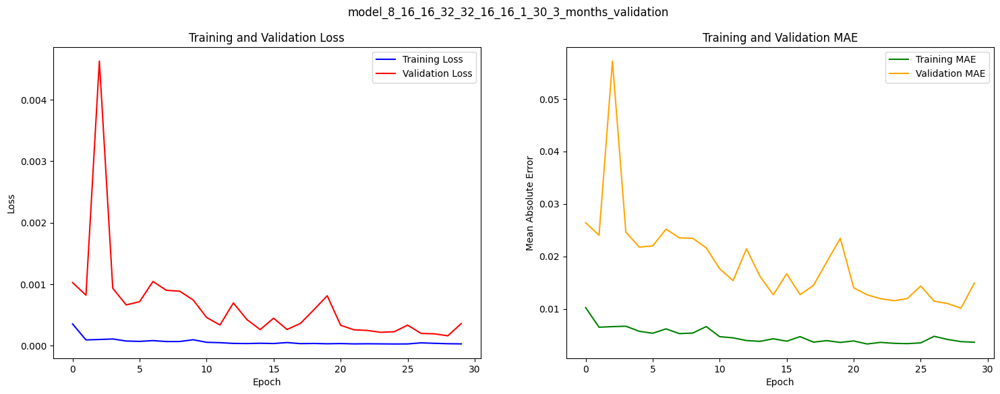

In [224]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_8_16_16_32_32_16_16_1_30_3_months_validation",
    model_history=history_8_16_16_32_32_16_16_1_30_3_months_validation,
)

##### **Observations**
Training loss and mean absolute error are decreasing gradually. Increasing the number of Dense layers and neurons has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 50 epochs. To potentially further reduce the mean absolute error, increasing the number of LSTM layers and neurons may result in a decrease in MAE.

- 4 LSTM(8-16-16-32) 4 Dense(32-32-16-16-1)
- Epochs: 50
- Batch Size: 1
- Training Loss: 1.1192e-04
- Mean Absolute Error: 0.0070

<br></br>
#### **Model Building with 4 LSTM and 4 Dense layers (8-16-16-32-32-16-16-1) and 30 epochs - 6 months**

In [181]:
# Let's create a keras sequential model
model_8_16_16_32_32_16_16_1_30_6_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_32_16_16_1_30_6_months_validation.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_8_16_16_32_32_16_16_1_30_6_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_32_16_16_1_30_6_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_32_16_16_1_30_6_months_validation.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_32_16_16_1_30_6_months_validation.add(Dense(32))
model_8_16_16_32_32_16_16_1_30_6_months_validation.add(Dense(16))
model_8_16_16_32_32_16_16_1_30_6_months_validation.add(Dense(16))
model_8_16_16_32_32_16_16_1_30_6_months_validation.add(Dense(1))

In [182]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_32_16_16_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [183]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_8_16_16_32_32_16_16_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_8_16_16_32_32_16_16_1_30_6_months_validation = (
    model_8_16_16_32_32_16_16_1_30_6_months_validation.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 16s 97ms/step - loss: 2.7461e-04 - mean_absolute_error: 0.0097 - val_loss: 0.0016 - val_mean_absolute_error: 0.0314
Epoch 2/30
140/140 [==============================] - 13s 93ms/step - loss: 1.1742e-04 - mean_absolute_error: 0.0073 - val_loss: 7.7340e-04 - val_mean_absolute_error: 0.0243
Epoch 3/30
140/140 [==============================] - 15s 105ms/step - loss: 8.2311e-05 - mean_absolute_error: 0.0062 - val_loss: 7.6410e-04 - val_mean_absolute_error: 0.0236
Epoch 4/30
140/140 [==============================] - 13s 91ms/step - loss: 8.9169e-05 - mean_absolute_error: 0.0064 - val_loss: 6.8764e-04 - val_mean_absolute_error: 0.0226
Epoch 5/30
140/140 [==============================] - 10s 70ms/step - loss: 8.9308e-05 - mean_absolute_error: 0.0064 - val_loss: 7.2488e-04 - val_mean_absolute_error: 0.0232
Epoch 6/30
140/140 [==============================] - 10s 70ms/step - loss: 7.3532e-05 - mean_absolute_error: 0.0055 - val_loss: 8.33

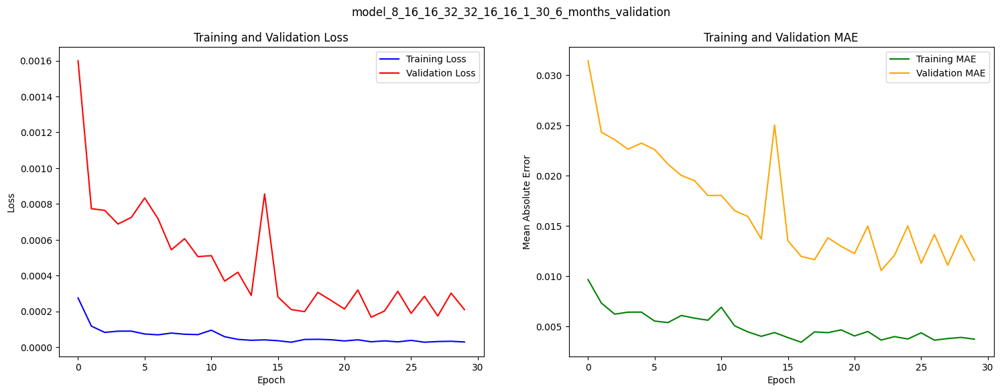

In [223]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_8_16_16_32_32_16_16_1_30_6_months_validation",
    model_history=history_8_16_16_32_32_16_16_1_30_6_months_validation,
)

##### **Observations**
Training loss and mean absolute error are decreasing gradually. Increasing the number of Dense layers and neurons has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 50 epochs. To potentially further reduce the mean absolute error, increasing the number of LSTM layers and neurons may result in a decrease in MAE.

- 4 LSTM(8-16-16-32) 4 Dense(32-32-16-16-1)
- Epochs: 50
- Batch Size: 1
- Training Loss: 1.1192e-04
- Mean Absolute Error: 0.0070

<br></br>
#### **Model Building with 5 LSTM and 3 Dense layers (8-16-16-32-64-8-8-1) and 30 epochs - 3 months**

In [185]:
# Let's create a keras sequential model
model_8_16_16_32_64_8_8_1_30_3_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_64_8_8_1_30_3_months_validation.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_8_16_16_32_64_8_8_1_30_3_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_3_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_3_months_validation.add(LSTM(32, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_3_months_validation.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_64_8_8_1_30_3_months_validation.add(Dense(8))
model_8_16_16_32_64_8_8_1_30_3_months_validation.add(Dense(8))
model_8_16_16_32_64_8_8_1_30_3_months_validation.add(Dense(1))

In [186]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_64_8_8_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [187]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_8_16_16_32_64_8_8_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_8_16_16_32_64_8_8_1_30_3_months_validation = (
    model_8_16_16_32_64_8_8_1_30_3_months_validation.fit(
        x_train_3_months,
        y_train_3_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_3_months, y_valid_3_months),
    )
)

Epoch 1/30
146/146 [==============================] - 17s 98ms/step - loss: 3.6395e-04 - mean_absolute_error: 0.0118 - val_loss: 0.0014 - val_mean_absolute_error: 0.0312
Epoch 2/30
146/146 [==============================] - 7s 51ms/step - loss: 1.1566e-04 - mean_absolute_error: 0.0071 - val_loss: 0.0019 - val_mean_absolute_error: 0.0344
Epoch 3/30
146/146 [==============================] - 11s 77ms/step - loss: 9.8903e-05 - mean_absolute_error: 0.0066 - val_loss: 0.0011 - val_mean_absolute_error: 0.0284
Epoch 4/30
146/146 [==============================] - 7s 48ms/step - loss: 9.8803e-05 - mean_absolute_error: 0.0064 - val_loss: 0.0015 - val_mean_absolute_error: 0.0311
Epoch 5/30
146/146 [==============================] - 7s 50ms/step - loss: 1.0905e-04 - mean_absolute_error: 0.0071 - val_loss: 0.0018 - val_mean_absolute_error: 0.0338
Epoch 6/30
146/146 [==============================] - 13s 92ms/step - loss: 7.5534e-05 - mean_absolute_error: 0.0056 - val_loss: 7.7510e-04 - val_mean_ab

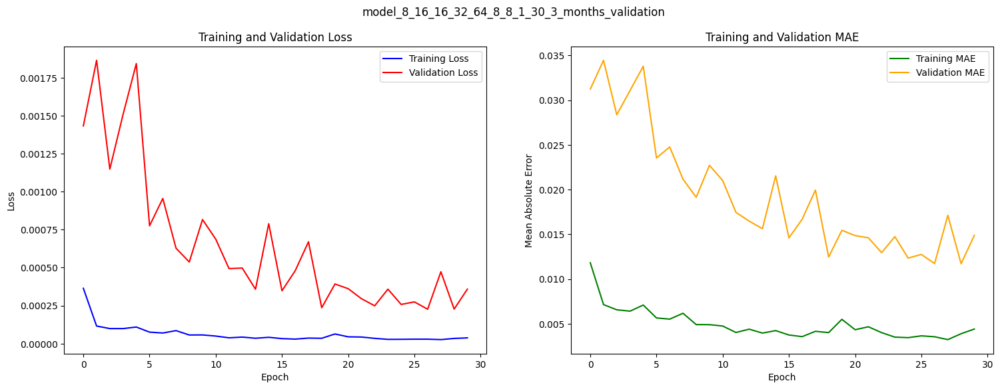

In [222]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_8_16_16_32_64_8_8_1_30_3_months_validation",
    model_history=history_8_16_16_32_64_8_8_1_30_3_months_validation,
)

##### **Observations**
Training loss and mean absolute error are decreasing gradually. Increasing the number of LSTM layers has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 50 epochs. To potentially further reduce the mean absolute error, increasing the epochs or number of LSTM layers and neurons may result in a decrease in MAE.

- 5 LSTM(8-16-16-32-64) 3 Dense(8-8-1)
- Epochs: 50
- Batch Size: 1
- Training Loss: 1.2129e-04
- Mean Absolute Error: 0.0068

<br></br>
#### **Model Building with 5 LSTM and 3 Dense layers (8-16-16-32-64-8-8-1) and 30 epochs - 6 months**

In [189]:
# Let's create a keras sequential model
model_8_16_16_32_64_8_8_1_30_6_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_8_16_16_32_64_8_8_1_30_6_months_validation.add(
    LSTM(8, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_8_16_16_32_64_8_8_1_30_6_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_6_months_validation.add(LSTM(16, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_6_months_validation.add(LSTM(32, return_sequences=True))
model_8_16_16_32_64_8_8_1_30_6_months_validation.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_8_16_16_32_64_8_8_1_30_6_months_validation.add(Dense(8))
model_8_16_16_32_64_8_8_1_30_6_months_validation.add(Dense(8))
model_8_16_16_32_64_8_8_1_30_6_months_validation.add(Dense(1))

In [190]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_8_16_16_32_64_8_8_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [191]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_8_16_16_32_64_8_8_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_8_16_16_32_64_8_8_1_30_6_months_validation = (
    model_8_16_16_32_64_8_8_1_30_6_months_validation.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 22s 133ms/step - loss: 4.5942e-04 - mean_absolute_error: 0.0116 - val_loss: 9.1896e-04 - val_mean_absolute_error: 0.0265
Epoch 2/30
140/140 [==============================] - 14s 97ms/step - loss: 1.0051e-04 - mean_absolute_error: 0.0063 - val_loss: 9.2631e-04 - val_mean_absolute_error: 0.0265
Epoch 3/30
140/140 [==============================] - 14s 98ms/step - loss: 1.0511e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0012 - val_mean_absolute_error: 0.0267
Epoch 4/30
140/140 [==============================] - 24s 172ms/step - loss: 8.3226e-05 - mean_absolute_error: 0.0059 - val_loss: 8.4088e-04 - val_mean_absolute_error: 0.0234
Epoch 5/30
140/140 [==============================] - 18s 129ms/step - loss: 8.9819e-05 - mean_absolute_error: 0.0062 - val_loss: 7.2047e-04 - val_mean_absolute_error: 0.0216
Epoch 6/30
140/140 [==============================] - 19s 133ms/step - loss: 7.4543e-05 - mean_absolute_error: 0.0058 - val_loss: 5

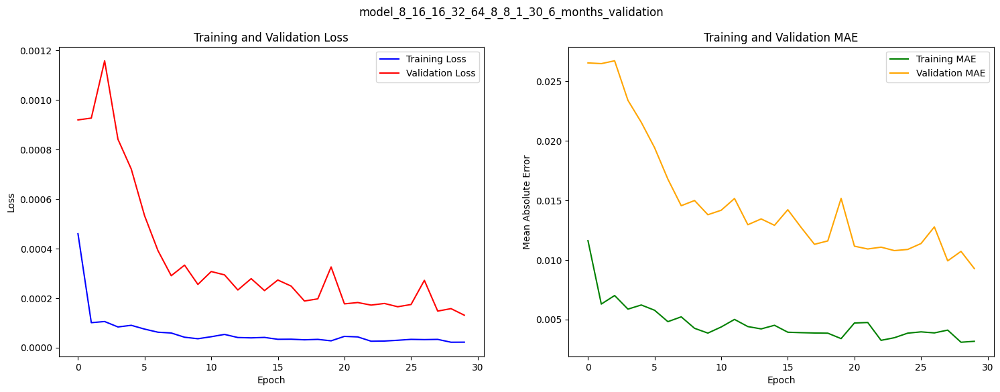

In [221]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_8_16_16_32_64_8_8_1_30_6_months_validation",
    model_history=history_8_16_16_32_64_8_8_1_30_6_months_validation,
)

##### **Observations**
Training loss and mean absolute error are decreasing gradually. Increasing the number of LSTM layers has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 50 epochs. To potentially further reduce the mean absolute error, increasing the epochs or number of LSTM layers and neurons may result in a decrease in MAE.

- 5 LSTM(8-16-16-32-64) 3 Dense(8-8-1)
- Epochs: 50
- Batch Size: 1
- Training Loss: 1.2129e-04
- Mean Absolute Error: 0.0068

<br></br>
#### **Model Building with 6 LSTM and 2 Dense layers(16-32-32-32-64-64-8-1) and 30 epochs - 3 months**

In [193]:
# Let's create a keras sequential model
model_16_32_32_32_64_64_8_1_30_3_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_16_32_32_32_64_64_8_1_30_3_months_validation.add(
    LSTM(16, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_16_32_32_32_64_64_8_1_30_3_months_validation.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_3_months_validation.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_3_months_validation.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_3_months_validation.add(LSTM(64, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_3_months_validation.add(LSTM(64, return_sequences=False))


# Let's add dense layer to the model network
model_16_32_32_32_64_64_8_1_30_3_months_validation.add(Dense(8))
model_16_32_32_32_64_64_8_1_30_3_months_validation.add(Dense(1))

In [194]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_16_32_32_32_64_64_8_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [195]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_16_32_32_32_64_64_8_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_16_32_32_32_64_64_8_1_30_3_months_validation = (
    model_16_32_32_32_64_64_8_1_30_3_months_validation.fit(
        x_train_3_months,
        y_train_3_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_3_months, y_valid_3_months),
    )
)

Epoch 1/30
146/146 [==============================] - 22s 115ms/step - loss: 4.9025e-04 - mean_absolute_error: 0.0128 - val_loss: 0.0052 - val_mean_absolute_error: 0.0573
Epoch 2/30
146/146 [==============================] - 20s 136ms/step - loss: 1.3975e-04 - mean_absolute_error: 0.0075 - val_loss: 0.0015 - val_mean_absolute_error: 0.0320
Epoch 3/30
146/146 [==============================] - 16s 109ms/step - loss: 1.2611e-04 - mean_absolute_error: 0.0070 - val_loss: 0.0012 - val_mean_absolute_error: 0.0293
Epoch 4/30
146/146 [==============================] - 11s 75ms/step - loss: 1.7005e-04 - mean_absolute_error: 0.0087 - val_loss: 0.0024 - val_mean_absolute_error: 0.0381
Epoch 5/30
146/146 [==============================] - 10s 70ms/step - loss: 8.2528e-05 - mean_absolute_error: 0.0056 - val_loss: 0.0012 - val_mean_absolute_error: 0.0285
Epoch 6/30
146/146 [==============================] - 16s 107ms/step - loss: 8.7561e-05 - mean_absolute_error: 0.0056 - val_loss: 9.8988e-04 - val_

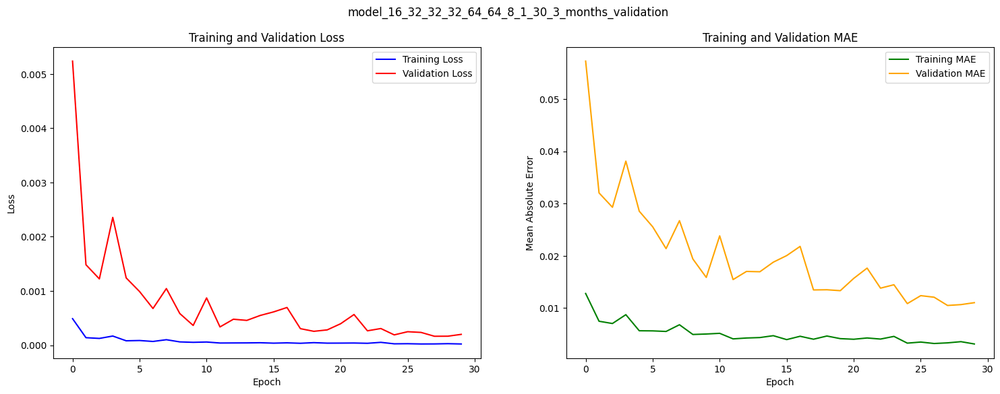

In [220]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_16_32_32_32_64_64_8_1_30_3_months_validation",
    model_history=history_16_32_32_32_64_64_8_1_30_3_months_validation,
)

##### **Observations**
Increasing the number of LSTM layers from five to six for 50 epochs, while reducing the number of dense layers from three to two, has not resulted in a decrease in the mean absolute error. Further steps, including increasing the number of epochs during training, might further reduce the mean absolute error.

- Epochs: 50
- Batch Size: 1
- Training Loss: 1.4036e-04
- Mean Absolute Error: 0.0076

<br></br>
#### **Model Building with 6 LSTM and 2 Dense layers(16-32-32-32-64-64-8-1) and 30 epochs - 6 months**

In [197]:
# Let's create a keras sequential model
model_16_32_32_32_64_64_8_1_30_6_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_16_32_32_32_64_64_8_1_30_6_months_validation.add(
    LSTM(16, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_16_32_32_32_64_64_8_1_30_6_months_validation.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_6_months_validation.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_6_months_validation.add(LSTM(32, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_6_months_validation.add(LSTM(64, return_sequences=True))
model_16_32_32_32_64_64_8_1_30_6_months_validation.add(LSTM(64, return_sequences=False))


# Let's add dense layer to the model network
model_16_32_32_32_64_64_8_1_30_6_months_validation.add(Dense(8))
model_16_32_32_32_64_64_8_1_30_6_months_validation.add(Dense(1))

In [198]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_16_32_32_32_64_64_8_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [199]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_16_32_32_32_64_64_8_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_16_32_32_32_64_64_8_1_30_6_months_validation = (
    model_16_32_32_32_64_64_8_1_30_6_months_validation.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 30s 167ms/step - loss: 3.8807e-04 - mean_absolute_error: 0.0116 - val_loss: 0.0011 - val_mean_absolute_error: 0.0292
Epoch 2/30
140/140 [==============================] - 18s 130ms/step - loss: 1.1471e-04 - mean_absolute_error: 0.0065 - val_loss: 0.0016 - val_mean_absolute_error: 0.0319
Epoch 3/30
140/140 [==============================] - 24s 169ms/step - loss: 1.2291e-04 - mean_absolute_error: 0.0071 - val_loss: 9.5226e-04 - val_mean_absolute_error: 0.0267
Epoch 4/30
140/140 [==============================] - 18s 130ms/step - loss: 1.0568e-04 - mean_absolute_error: 0.0066 - val_loss: 0.0010 - val_mean_absolute_error: 0.0269
Epoch 5/30
140/140 [==============================] - 27s 191ms/step - loss: 1.2108e-04 - mean_absolute_error: 0.0076 - val_loss: 8.2395e-04 - val_mean_absolute_error: 0.0240
Epoch 6/30
140/140 [==============================] - 24s 168ms/step - loss: 9.8437e-05 - mean_absolute_error: 0.0063 - val_loss: 6.3664e

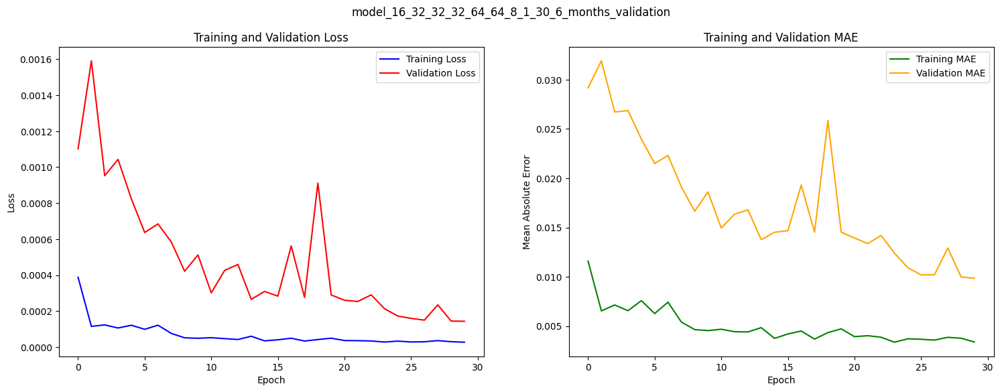

In [219]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_16_32_32_32_64_64_8_1_30_6_months_validation",
    model_history=history_16_32_32_32_64_64_8_1_30_6_months_validation,
)

##### **Observations**
Increasing the number of LSTM layers from five to six for 50 epochs, while reducing the number of dense layers from three to two, has not resulted in a decrease in the mean absolute error. Further steps, including increasing the number of epochs during training, might further reduce the mean absolute error.

- Epochs: 50
- Batch Size: 1
- Training Loss: 1.4036e-04
- Mean Absolute Error: 0.0076

<br></br>
### **Increasing number of neurons in LSTM layers**
<br></br>
#### **Model Building with 3LSTM and 2Dense layers(64-128-128-8-1) and 30 epochs - 3 months**

In [201]:
# Let's create a keras sequential model
model_64_128_128_8_1_30_3_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_64_128_128_8_1_30_3_months_validation.add(
    LSTM(64, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_64_128_128_8_1_30_3_months_validation.add(LSTM(128, return_sequences=True))
model_64_128_128_8_1_30_3_months_validation.add(LSTM(128, return_sequences=False))

# Let's add dense layer to the model network
model_64_128_128_8_1_30_3_months_validation.add(Dense(8))
model_64_128_128_8_1_30_3_months_validation.add(Dense(1))

In [202]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_64_128_128_8_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [203]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_64_128_128_8_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_64_128_128_8_1_30_3_months_validation = (
    model_64_128_128_8_1_30_3_months_validation.fit(
        x_train_3_months,
        y_train_3_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_3_months, y_valid_3_months),
    )
)

Epoch 1/30
146/146 [==============================] - 20s 119ms/step - loss: 1.8490e-04 - mean_absolute_error: 0.0075 - val_loss: 0.0013 - val_mean_absolute_error: 0.0298
Epoch 2/30
146/146 [==============================] - 21s 141ms/step - loss: 6.2841e-05 - mean_absolute_error: 0.0051 - val_loss: 3.9742e-04 - val_mean_absolute_error: 0.0157
Epoch 3/30
146/146 [==============================] - 15s 105ms/step - loss: 3.8453e-05 - mean_absolute_error: 0.0041 - val_loss: 3.4054e-04 - val_mean_absolute_error: 0.0152
Epoch 4/30
146/146 [==============================] - 15s 103ms/step - loss: 4.0289e-05 - mean_absolute_error: 0.0043 - val_loss: 1.7781e-04 - val_mean_absolute_error: 0.0110
Epoch 5/30
146/146 [==============================] - 15s 104ms/step - loss: 3.2728e-05 - mean_absolute_error: 0.0038 - val_loss: 1.5763e-04 - val_mean_absolute_error: 0.0103
Epoch 6/30
146/146 [==============================] - 12s 85ms/step - loss: 2.7713e-05 - mean_absolute_error: 0.0034 - val_loss: 

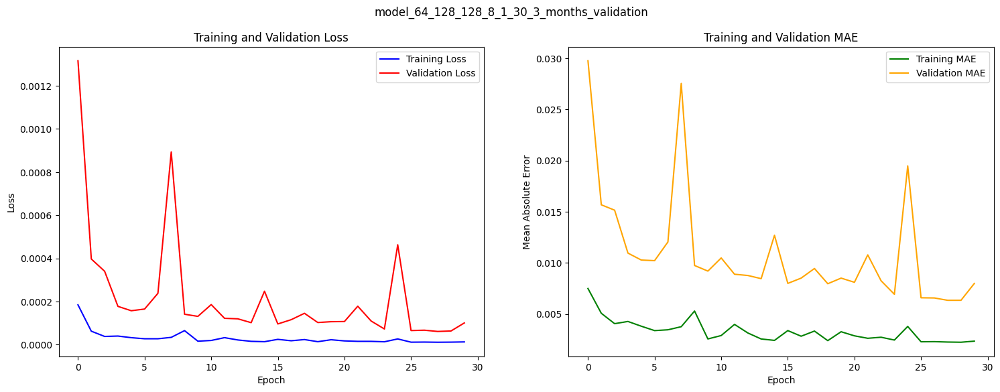

In [218]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_64_128_128_8_1_30_3_months_validation",
    model_history=history_64_128_128_8_1_30_3_months_validation,
)

##### **Observations**
Increasing the number of LSTM layers from five to six for 50 epochs, while reducing the number of dense layers from three to two, has not resulted in a decrease in the mean absolute error. Further steps, including increasing the number of epochs during training, might further reduce the mean absolute error.

- Epochs: 50
- Batch Size: 1
- Training Loss: 1.4036e-04
- Mean Absolute Error: 0.0076

<br></br>
#### **Model Building with 3LSTM and 2Dense layers(64-128-128-8-1) and 30 epochs - 6 months**

In [205]:
# Let's create a keras sequential model
model_64_128_128_8_1_30_6_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_64_128_128_8_1_30_6_months_validation.add(
    LSTM(64, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_64_128_128_8_1_30_6_months_validation.add(LSTM(128, return_sequences=True))
model_64_128_128_8_1_30_6_months_validation.add(LSTM(128, return_sequences=False))

# Let's add dense layer to the model network
model_64_128_128_8_1_30_6_months_validation.add(Dense(8))
model_64_128_128_8_1_30_6_months_validation.add(Dense(1))

In [206]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_64_128_128_8_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [207]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_64_128_128_8_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_64_128_128_8_1_30_6_months_validation = (
    model_64_128_128_8_1_30_6_months_validation.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 29s 192ms/step - loss: 2.6542e-04 - mean_absolute_error: 0.0090 - val_loss: 5.1539e-04 - val_mean_absolute_error: 0.0177
Epoch 2/30
140/140 [==============================] - 26s 187ms/step - loss: 4.4961e-05 - mean_absolute_error: 0.0041 - val_loss: 3.4336e-04 - val_mean_absolute_error: 0.0147
Epoch 3/30
140/140 [==============================] - 26s 186ms/step - loss: 5.4879e-05 - mean_absolute_error: 0.0048 - val_loss: 2.5512e-04 - val_mean_absolute_error: 0.0129
Epoch 4/30
140/140 [==============================] - 33s 238ms/step - loss: 4.6260e-05 - mean_absolute_error: 0.0045 - val_loss: 2.1481e-04 - val_mean_absolute_error: 0.0121
Epoch 5/30
140/140 [==============================] - 27s 190ms/step - loss: 3.8005e-05 - mean_absolute_error: 0.0039 - val_loss: 1.6972e-04 - val_mean_absolute_error: 0.0107
Epoch 6/30
140/140 [==============================] - 22s 159ms/step - loss: 2.9176e-05 - mean_absolute_error: 0.0035 - val_l

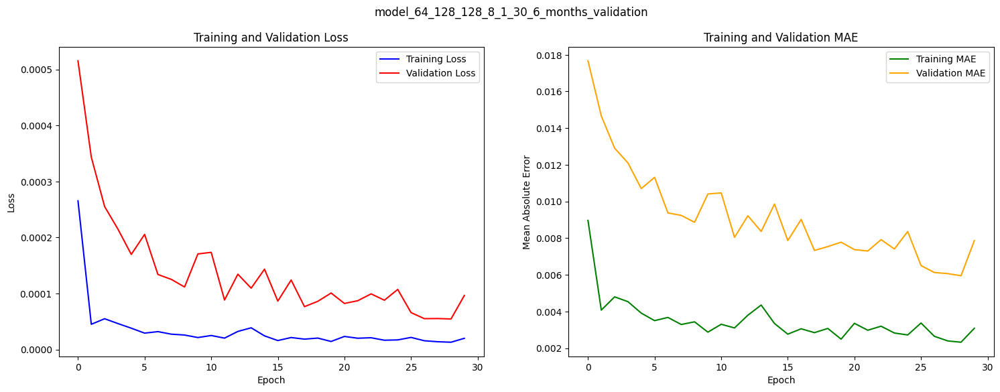

In [217]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_64_128_128_8_1_30_6_months_validation",
    model_history=history_64_128_128_8_1_30_6_months_validation,
)

##### **Observations**
Increasing the number of LSTM layers from five to six for 50 epochs, while reducing the number of dense layers from three to two, has not resulted in a decrease in the mean absolute error. Further steps, including increasing the number of epochs during training, might further reduce the mean absolute error.

- Epochs: 50
- Batch Size: 1
- Training Loss: 1.4036e-04
- Mean Absolute Error: 0.0076

<br></br>
#### **Model Building with 4 LSTM and 4 Dense layers (128-64-64-32-8-8-8-1) and 30 epochs - 3 months**

In [209]:
# Let's create a keras sequential model
model_128_64_64_32_8_8_8_1_30_3_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_32_8_8_8_1_30_3_months_validation.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_3_months.shape[1], 1))
)
model_128_64_64_32_8_8_8_1_30_3_months_validation.add(LSTM(64, return_sequences=True))
model_128_64_64_32_8_8_8_1_30_3_months_validation.add(LSTM(64, return_sequences=True))
model_128_64_64_32_8_8_8_1_30_3_months_validation.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_32_8_8_8_1_30_3_months_validation.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_3_months_validation.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_3_months_validation.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_3_months_validation.add(Dense(1))

In [210]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_32_8_8_8_1_30_3_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [211]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_32_8_8_8_1_30_3_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_32_8_8_8_1_30_3_months_validation = (
    model_128_64_64_32_8_8_8_1_30_3_months_validation.fit(
        x_train_3_months,
        y_train_3_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_3_months, y_valid_3_months),
    )
)

Epoch 1/30
146/146 [==============================] - 23s 134ms/step - loss: 2.4304e-04 - mean_absolute_error: 0.0087 - val_loss: 0.0012 - val_mean_absolute_error: 0.0271
Epoch 2/30
146/146 [==============================] - 14s 94ms/step - loss: 1.0201e-04 - mean_absolute_error: 0.0069 - val_loss: 0.0011 - val_mean_absolute_error: 0.0256
Epoch 3/30
146/146 [==============================] - 14s 96ms/step - loss: 6.7097e-05 - mean_absolute_error: 0.0053 - val_loss: 3.9207e-04 - val_mean_absolute_error: 0.0166
Epoch 4/30
146/146 [==============================] - 14s 93ms/step - loss: 4.8645e-05 - mean_absolute_error: 0.0046 - val_loss: 3.6938e-04 - val_mean_absolute_error: 0.0160
Epoch 5/30
146/146 [==============================] - 10s 70ms/step - loss: 5.5090e-05 - mean_absolute_error: 0.0052 - val_loss: 4.3613e-04 - val_mean_absolute_error: 0.0166
Epoch 6/30
146/146 [==============================] - 10s 70ms/step - loss: 5.9716e-05 - mean_absolute_error: 0.0057 - val_loss: 4.5073e-

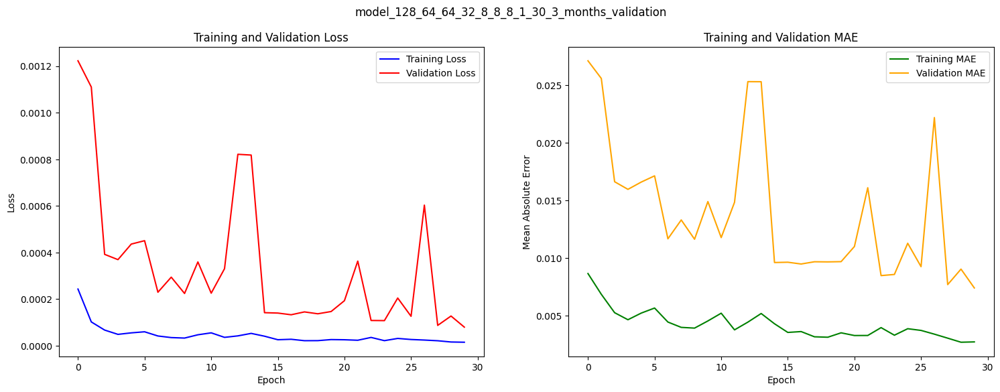

In [212]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_32_8_8_8_1_30_3_months_validation",
    model_history=history_128_64_64_32_8_8_8_1_30_3_months_validation,
)

##### **Observations**
Training loss and mean absolute error are decreasing gradually. Increasing the number of Dense layers and neurons has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 50 epochs. To potentially further reduce the mean absolute error, increasing the number of LSTM layers and neurons may result in a decrease in MAE.

- 4 LSTM(8-16-16-32) 4 Dense(32-32-16-16-1)
- Epochs: 50
- Batch Size: 1
- Training Loss: 1.1192e-04
- Mean Absolute Error: 0.0070

<br></br>
#### **Model Building with 4 LSTM and 4 Dense layers (128-64-64-32-8-8-8-1) and 30 epochs - 6 months**

In [213]:
# Let's create a keras sequential model
model_128_64_64_32_8_8_8_1_30_6_months_validation = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_32_8_8_8_1_30_6_months_validation.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
model_128_64_64_32_8_8_8_1_30_6_months_validation.add(LSTM(64, return_sequences=True))
model_128_64_64_32_8_8_8_1_30_6_months_validation.add(LSTM(64, return_sequences=True))
model_128_64_64_32_8_8_8_1_30_6_months_validation.add(LSTM(32, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_32_8_8_8_1_30_6_months_validation.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_6_months_validation.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_6_months_validation.add(Dense(8))
model_128_64_64_32_8_8_8_1_30_6_months_validation.add(Dense(1))

In [214]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_32_8_8_8_1_30_6_months_validation.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [215]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_32_8_8_8_1_30_6_months_validation_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_32_8_8_8_1_30_6_months_validation = (
    model_128_64_64_32_8_8_8_1_30_6_months_validation.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 34s 208ms/step - loss: 3.4409e-04 - mean_absolute_error: 0.0092 - val_loss: 7.4808e-04 - val_mean_absolute_error: 0.0217
Epoch 2/30
140/140 [==============================] - 23s 161ms/step - loss: 8.0116e-05 - mean_absolute_error: 0.0059 - val_loss: 5.1701e-04 - val_mean_absolute_error: 0.0194
Epoch 3/30
140/140 [==============================] - 19s 136ms/step - loss: 6.7333e-05 - mean_absolute_error: 0.0052 - val_loss: 6.0306e-04 - val_mean_absolute_error: 0.0204
Epoch 4/30
140/140 [==============================] - 23s 164ms/step - loss: 7.9842e-05 - mean_absolute_error: 0.0061 - val_loss: 3.7977e-04 - val_mean_absolute_error: 0.0162
Epoch 5/30
140/140 [==============================] - 19s 136ms/step - loss: 6.5069e-05 - mean_absolute_error: 0.0053 - val_loss: 4.4539e-04 - val_mean_absolute_error: 0.0166
Epoch 6/30
140/140 [==============================] - 22s 161ms/step - loss: 5.1347e-05 - mean_absolute_error: 0.0047 - val_l

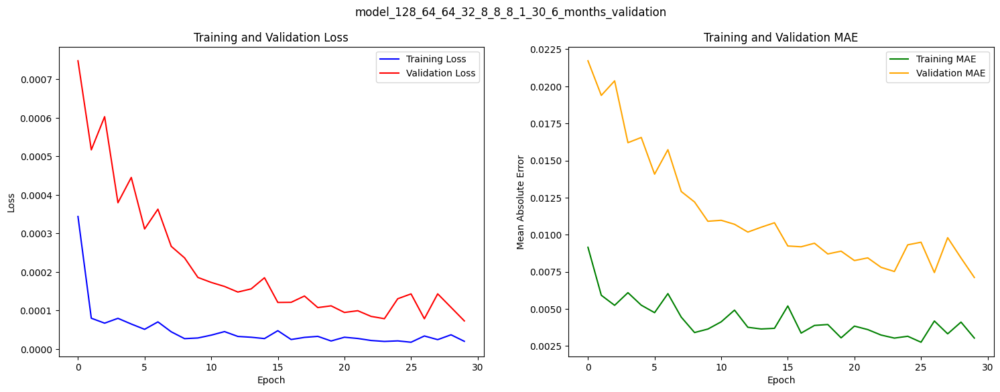

In [216]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_32_8_8_8_1_30_6_months_validation",
    model_history=history_128_64_64_32_8_8_8_1_30_6_months_validation,
)

##### **Observations**
Training loss and mean absolute error are decreasing gradually. Increasing the number of Dense layers and neurons has not resulted in a decrease in mean absolute error when compared to one LSTM and one dense layer, which was trained for 50 epochs. To potentially further reduce the mean absolute error, increasing the number of LSTM layers and neurons may result in a decrease in MAE.

- 4 LSTM(8-16-16-32) 4 Dense(32-32-16-16-1)
- Epochs: 50
- Batch Size: 1
- Training Loss: 1.1192e-04
- Mean Absolute Error: 0.0070

<br></br>
### **Prediction Accuracy Visual Overview**

In [290]:
# Let's import scikit-learn to get the metrics
from sklearn.metrics import (
    mean_squared_error,
    mean_absolute_error,
    mean_absolute_percentage_error,
)

In [291]:
def calculate_metrics(actual_prices, predicted_prices):
    # mse = mean_squared_error(actual_prices, predicted_prices)
    mae = mean_absolute_error(actual_prices, predicted_prices)
    mape = mean_absolute_percentage_error(actual_prices, predicted_prices)
    return mae, mape

In [292]:
def get_metrics(period, model):
    # Let's get the actual_values and predictions out of the model
    if period == 3:
        valid_input_values = x_valid_3_months
        valid_output_values = [y_valid_3_months]
        test_input_values = x_test_3_months
        test_output_values = [y_test_3_months]

    elif period == 6:
        valid_input_values = x_valid_6_months
        valid_output_values = [y_valid_6_months]
        test_input_values = x_test_6_months
        test_output_values = [y_test_6_months]

    # Let's run preidtcions on validation and test data
    valid_predicted_prices_scaled = model.predict(valid_input_values, verbose=0)
    test_predicted_prices_scaled = model.predict(test_input_values, verbose=0)

    # Inverse the scaling to get actual price predictions
    valid_predicted_prices = scaler.inverse_transform(valid_predicted_prices_scaled)
    test_predicted_prices = scaler.inverse_transform(test_predicted_prices_scaled)

    # Ensure the actual test data is in the same shape and inverse scaled
    valid_actual_prices = scaler.inverse_transform(valid_output_values)
    test_actual_prices = scaler.inverse_transform(test_output_values)

    # Let's reduce the dimesnions of both scaled predictions and output values of validation data
    valid_actual_prices = np.squeeze(valid_actual_prices)
    valid_predicted_prices = np.squeeze(valid_predicted_prices)

    # Let's reduce the dimesnions of both scaled predictions and output values of test data
    test_actual_prices = np.squeeze(test_actual_prices)
    test_predicted_prices = np.squeeze(test_predicted_prices)

    validation_mae, validation_mape = calculate_metrics(
        valid_actual_prices, valid_predicted_prices
    )

    test_mae, test_mape = calculate_metrics(test_actual_prices, test_predicted_prices)

    metrics = {
        "valid_actual_prices": valid_actual_prices,
        "valid_predicted_prices": valid_predicted_prices,
        "test_actual_prices": test_actual_prices,
        "test_predicted_prices": test_predicted_prices,
        "validation_mae": validation_mae,
        "validation_mape": validation_mape,
        "test_mae": test_mae,
        "test_mape": test_mape,
    }

    return metrics

In [726]:
# Function to plot the test predictions and actual predictions
def plot_metrics_and_predictions(model_name, actual_prices, predicted_prices):
    figure, (ax1, ax2) = plt.subplots(
        1, 2, figsize=(18, 6), dpi=300
    )  # Define a figure with two subplots
    figure.suptitle(model_name)  # Set the title of the figure

    # Plot the true vs predicted values on the second subplot
    ax1.plot(
        actual_prices, label="Actual Values", color="green"
    )  # Plot the actual values
    ax1.plot(
        predicted_prices, label="Predicted Values", color="orange"
    )  # Plot the predicted values
    ax1.set_title(
        "Actual vs. Predicted Values"
    )  # Title for the true vs. predicted plot
    ax1.set_xlabel("Data Points")  # Label for the x-axis
    ax1.set_ylabel("Values")  # Label for the y-axis
    ax1.legend(loc="upper right")  # Legend positioned in the upper right

    ax2.scatter(
        actual_prices, predicted_prices, color="blue", s=10, alpha=0.5
    )  # Scatter plot of actual vs predicted
    ax2.set_title("Actual vs. Predicted Values")  # Title for the plot
    ax2.set_xlabel("Actual Values")  # Label for the x-axis (True Values)
    ax2.set_ylabel("Predicted Values")  # Label for the y-axis (Predicted Values)
    ax2.plot(
        [min(actual_prices), max(actual_prices)],
        [min(actual_prices), max(actual_prices)],
        "r--",
    )  # Red line showing perfect predictions

    # Add a legend to clarify the elements in the plot
    ax2.legend(["Predicted vs Actual", "Ideal Predictions"])
    plt.savefig("plots/best_regularization_model.png")
    plt.show()

In [294]:
# Let's define the list of models that are used for validation and comparison.
model_validation_list = {
    "model_8_1_30_3_months_validation": model_8_1_30_3_months_validation,
    "model_8_1_30_6_months_validation": model_8_1_30_6_months_validation,
    "model_64_1_30_3_months_validation": model_64_1_30_3_months_validation,
    "model_64_1_30_6_months_validation": model_64_1_30_6_months_validation,
    "model_128_1_30_3_months_validation": model_128_1_30_3_months_validation,
    "model_128_1_30_6_months_validation": model_128_1_30_6_months_validation,
    "model_128_64_8_1_30_3_months_validation": model_128_64_8_1_30_3_months_validation,
    "model_128_64_8_1_30_6_months_validation": model_128_64_8_1_30_6_months_validation,
    "model_128_64_64_8_8_1_30_3_months_validation": model_128_64_64_8_8_1_30_3_months_validation,
    "model_128_64_64_8_8_1_30_6_months_validation": model_128_64_64_8_8_1_30_6_months_validation,
    "model_8_16_16_32_8_8_1_30_3_months_validation": model_8_16_16_32_8_8_1_30_3_months_validation,
    "model_8_16_16_32_8_8_1_30_6_months_validation": model_8_16_16_32_8_8_1_30_6_months_validation,
    "model_8_16_16_32_32_16_16_1_30_3_months_validation": model_8_16_16_32_32_16_16_1_30_3_months_validation,
    "model_8_16_16_32_32_16_16_1_30_6_months_validation": model_8_16_16_32_32_16_16_1_30_6_months_validation,
    "model_8_16_16_32_64_8_8_1_30_3_months_validation": model_8_16_16_32_64_8_8_1_30_3_months_validation,
    "model_8_16_16_32_64_8_8_1_30_6_months_validation": model_8_16_16_32_64_8_8_1_30_6_months_validation,
    "model_16_32_32_32_64_64_8_1_30_3_months_validation": model_16_32_32_32_64_64_8_1_30_3_months_validation,
    "model_16_32_32_32_64_64_8_1_30_6_months_validation": model_16_32_32_32_64_64_8_1_30_6_months_validation,
    "model_64_128_128_8_1_30_3_months_validation": model_64_128_128_8_1_30_3_months_validation,
    "model_64_128_128_8_1_30_6_months_validation": model_64_128_128_8_1_30_6_months_validation,
    "model_128_64_64_32_8_8_8_1_30_3_months_validation": model_128_64_64_32_8_8_8_1_30_3_months_validation,
    "model_128_64_64_32_8_8_8_1_30_6_months_validation": model_128_64_64_32_8_8_8_1_30_6_months_validation,
}

<br></br>
#### **3 Months Window**

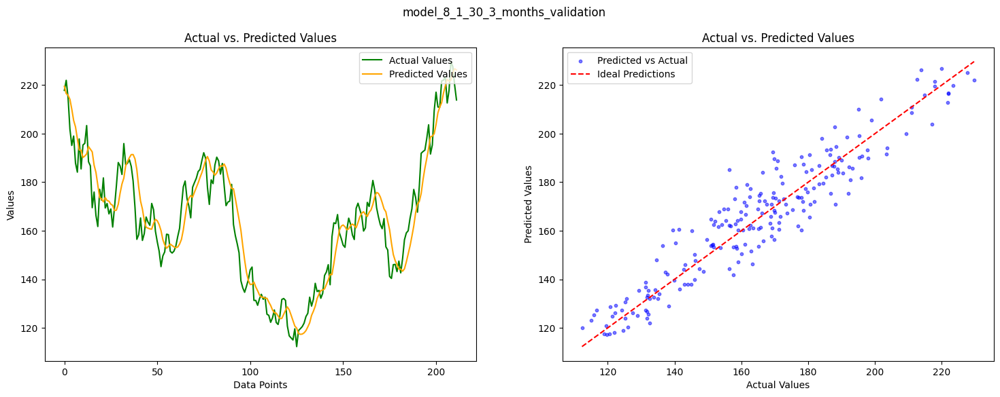

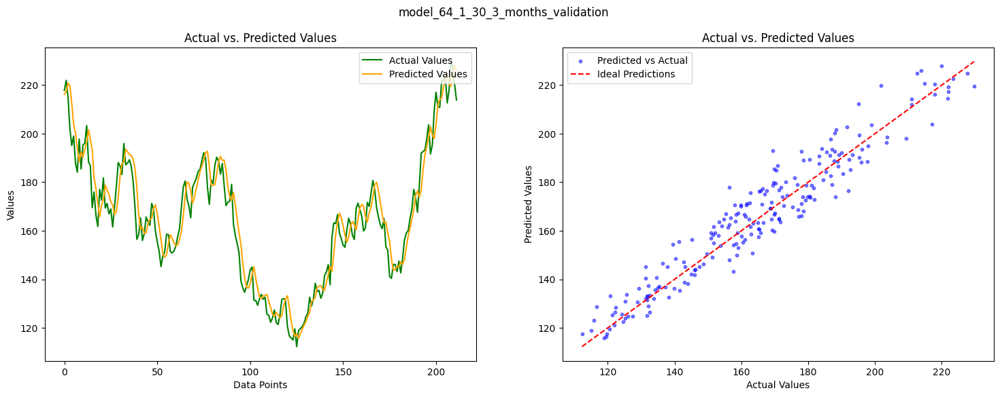

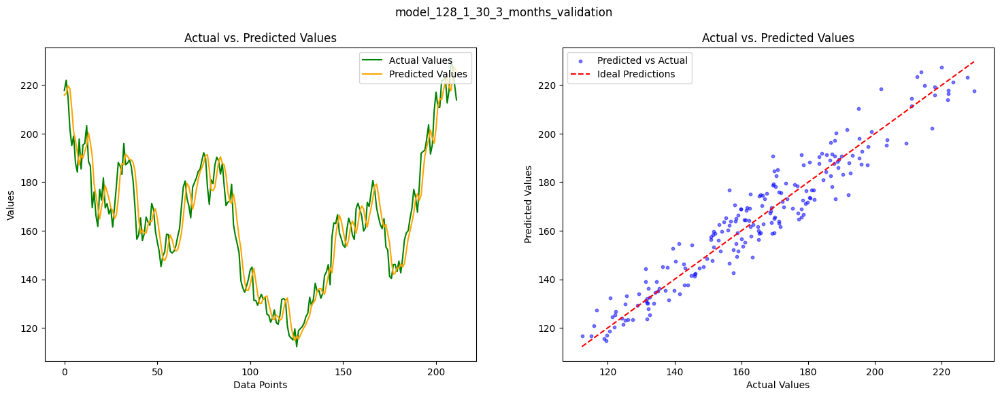

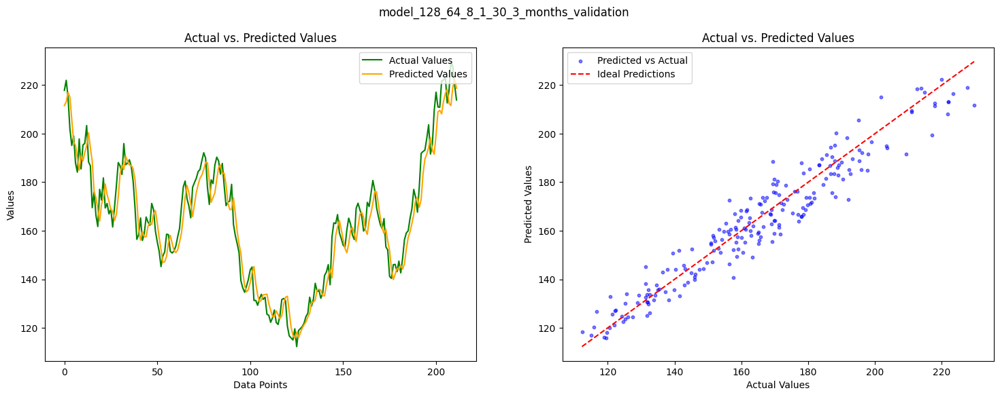

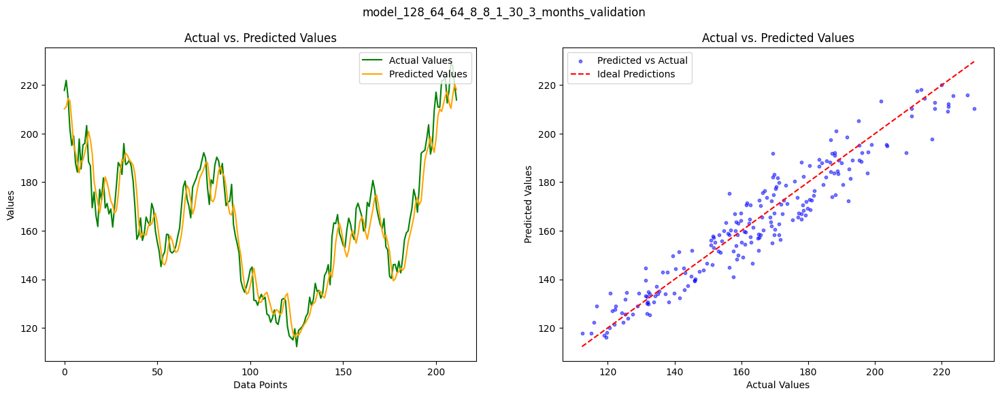

...

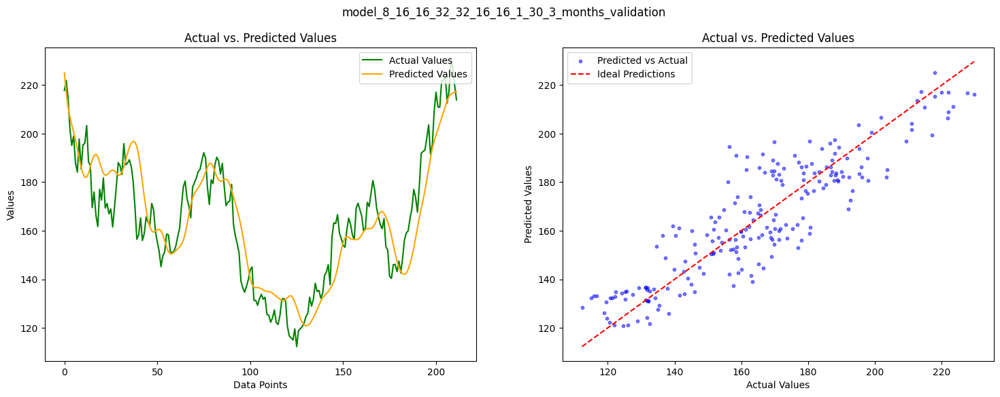

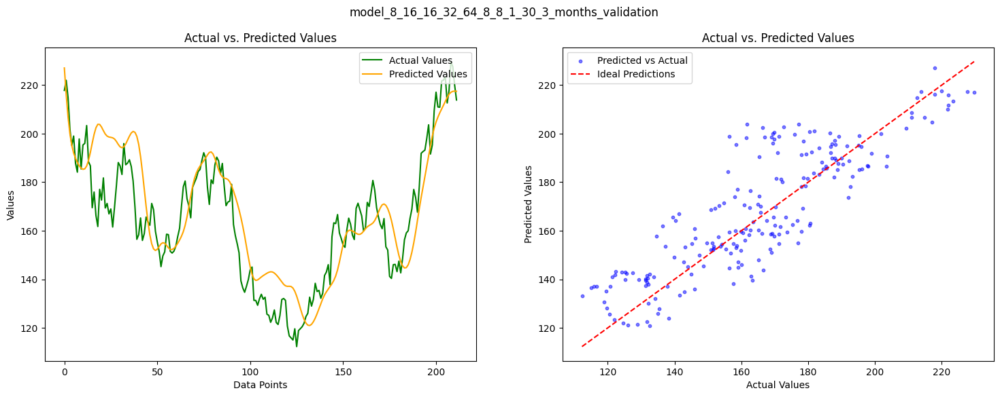

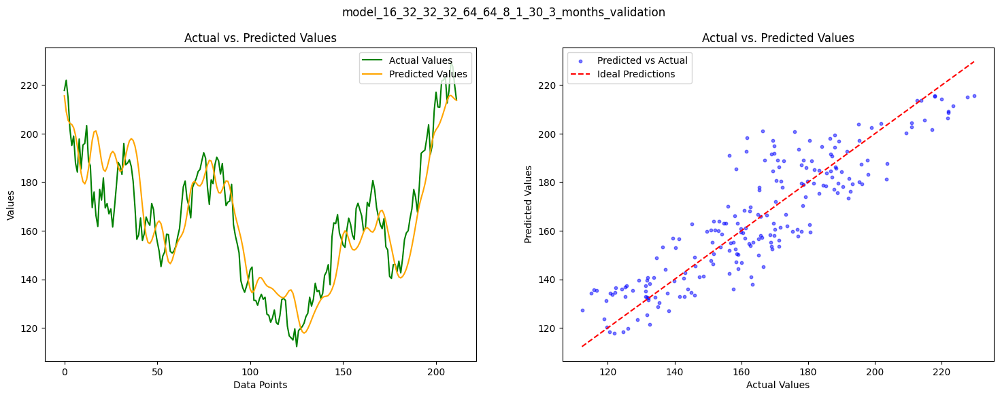

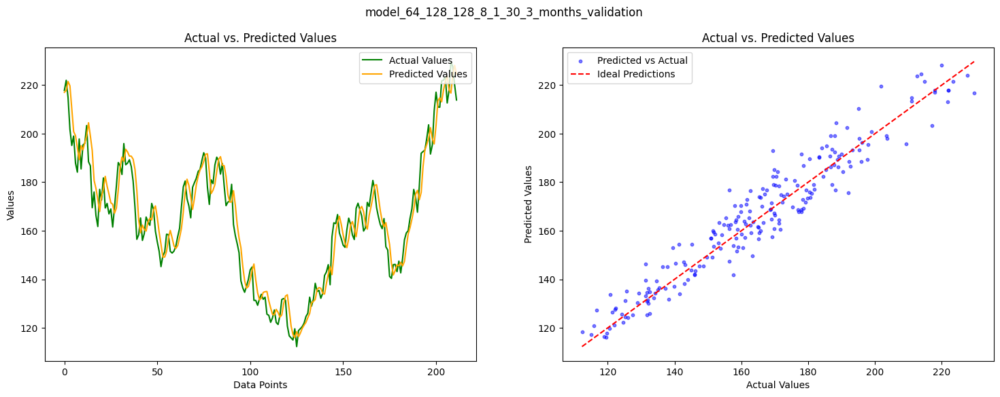

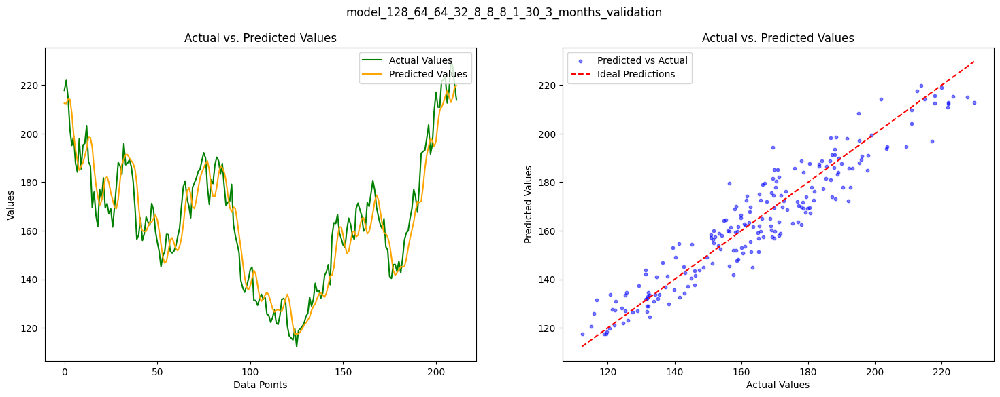

In [295]:
validation_testing_3_months = []

for model_name in model_validation_list.keys():
    model = keras.models.load_model(f"{model_name}_checkpoint_filepath")
    if "3_months" in model_name:
        three_months_metrics_dict = get_metrics(period=3, model=model)
        plot_metrics_and_predictions(
            model_name=model_name,
            actual_prices=three_months_metrics_dict.get("valid_actual_prices"),
            predicted_prices=three_months_metrics_dict.get("valid_predicted_prices"),
        )
        validation_testing_3_months.append(
            {
                "Model Configuration": model_name,
                "period": "3 months",
                "Validation MAE": three_months_metrics_dict.get("validation_mae"),
                "Validation MAPE": three_months_metrics_dict.get("validation_mape"),
            }
        )

<br></br>
#### **Printing Validation MSE and MAE for all the models - 3 months**

In [297]:
# Let's convert the validation_testing list of dictionaries into a pandas data_frame
validation_testing_3_months_df = pd.DataFrame(validation_testing_3_months)
validation_testing_3_months_df

,Model Configuration,period,Validation MAE,Validation MAPE
0,model_8_1_30_3_months_validation,3 months,7.214011,0.044383
1,model_64_1_30_3_months_validation,3 months,6.303906,0.038462
2,model_128_1_30_3_months_validation,3 months,6.152192,0.037394
3,model_128_64_8_1_30_3_months_validation,3 months,5.962914,0.035794
4,model_128_64_64_8_8_1_30_3_months_validation,3 months,6.445919,0.038820
5,model_8_16_16_32_8_8_1_30_3_months_validation,3 months,9.637526,0.059911
6,model_8_16_16_32_32_16_16_1_30_3_months_valida...,3 months,9.583087,0.059262
7,model_8_16_16_32_64_8_8_1_30_3_months_validation,3 months,11.107743,0.070483
8,model_16_32_32_32_64_64_8_1_30_3_months_valida...,3 months,9.933542,0.061433
9,model_64_128_128_8_1_30_3_months_validation,3 months,6.004318,0.036584


<br></br>
#### **6 months Window**

In [719]:
# Let's define the list of models that are used for validation and comparison.
model_validation_test = {
    "model_128_64_64_8_8_1_30_6_months_validation": model_128_64_64_8_8_1_30_6_months_validation
}

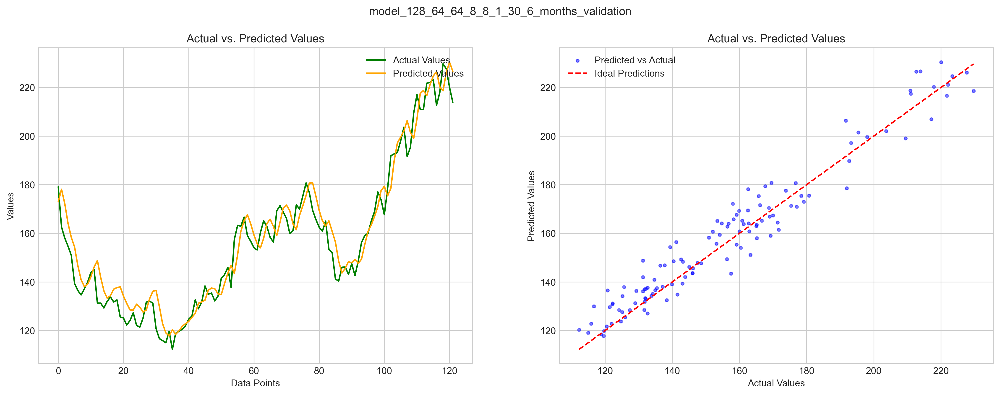

In [720]:
validation_testing_6_months = []

for model_name in model_validation_test.keys():
    if "6_months" in model_name:
        model = keras.models.load_model(f"{model_name}_checkpoint_filepath")
        six_months_metrics_dict = get_metrics(period=6, model=model)
        plot_metrics_and_predictions(
            model_name=model_name,
            actual_prices=six_months_metrics_dict.get("valid_actual_prices"),
            predicted_prices=six_months_metrics_dict.get("valid_predicted_prices"),
        )
        validation_testing_6_months.append(
            {
                "Model Configuration": model_name,
                "period": "6 months",
                "Validation MAE": six_months_metrics_dict.get("validation_mae"),
                "Validation MAPE": six_months_metrics_dict.get("validation_mape"),
            }
        )

<br></br>
#### **Printing Validation MSE and MAE for all the models - 6 months**

In [300]:
# Let's convert the validation_testing list of dictionaries into a pandas data_frame
validation_testing_6_months_df = pd.DataFrame(validation_testing_6_months)
validation_testing_6_months_df

,Model Configuration,period,Validation MAE,Validation MAPE
0,model_8_1_30_6_months_validation,6 months,6.490327,0.042146
1,model_64_1_30_6_months_validation,6 months,5.766417,0.036950
2,model_128_1_30_6_months_validation,6 months,5.635041,0.036111
3,model_128_64_8_1_30_6_months_validation,6 months,5.801102,0.037494
4,model_128_64_64_8_8_1_30_6_months_validation,6 months,5.871108,0.038194
5,model_8_16_16_32_8_8_1_30_6_months_validation,6 months,9.925282,0.067345
6,model_8_16_16_32_32_16_16_1_30_6_months_valida...,6 months,10.011879,0.067544
7,model_8_16_16_32_64_8_8_1_30_6_months_validation,6 months,8.775115,0.059131
8,model_16_32_32_32_64_64_8_1_30_6_months_valida...,6 months,9.335995,0.063925
9,model_64_128_128_8_1_30_6_months_validation,6 months,5.637837,0.036104


<br></br>
#### **Observations**
- - - - - - - - - - -

📊**From the tables above, which show comparisons of different LSTM model configurations, each row represents a distinct configuration of LSTM layers and neurons. These models were trained considering either a 3-month or a 6-month window to predict daily stock prices. Comparing the two tables, it is evident that the LSTM models trained with a 6-month window outperformed those trained with a 3-month window in predicting future stock prices.** 📈

<br></br>

💡`The best model among the different configurations of LSTM layers and neurons is the one with three LSTM layers (128, 64, and 64 neurons, respectively) and three dense layers (8, 8, and 1 neurons, respectively).`🏆

<br></br>
### **Data Augmentation**

<br></br>
#### **Jittering - 0.005**

In [367]:
def add_noise(data, noise_level):
    # Generate random Gaussian noise. This noise has a mean of 0 and a standard deviation provided by 'noise_level'.
    # The size of the noise array is the same as the size of the input data.
    noise = np.random.normal(loc=0.0, scale=noise_level, size=data.shape)

    # Add the generated noise to the original data. This simulates real-world unpredictability in the data.
    return data + noise

In [368]:
# Let's add random noise to six-month training data window
x_train_6_months_noisy_0_0_0_5 = add_noise(x_train_6_months, noise_level=0.005)

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [369]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise.add(
    LSTM(
        128,
        return_sequences=True,
        input_shape=(x_train_6_months_noisy_0_0_0_5.shape[1], 1),
    )
)
model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise.add(
    LSTM(64, return_sequences=True)
)
model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise.add(
    LSTM(64, return_sequences=False)
)

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise.add(Dense(1))

In [370]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [371]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise = (
    model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise.fit(
        x_train_6_months_noisy_0_0_0_5,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 38s 243ms/step - loss: 2.8165e-04 - mean_absolute_error: 0.0086 - val_loss: 4.3918e-04 - val_mean_absolute_error: 0.0178
Epoch 2/30
140/140 [==============================] - 32s 226ms/step - loss: 7.0703e-05 - mean_absolute_error: 0.0054 - val_loss: 3.9648e-04 - val_mean_absolute_error: 0.0157
Epoch 3/30
140/140 [==============================] - 39s 275ms/step - loss: 4.3766e-05 - mean_absolute_error: 0.0043 - val_loss: 2.8942e-04 - val_mean_absolute_error: 0.0142
Epoch 4/30
140/140 [==============================] - 27s 191ms/step - loss: 5.7341e-05 - mean_absolute_error: 0.0052 - val_loss: 3.2295e-04 - val_mean_absolute_error: 0.0147
Epoch 5/30
140/140 [==============================] - 44s 311ms/step - loss: 4.7397e-05 - mean_absolute_error: 0.0048 - val_loss: 2.1378e-04 - val_mean_absolute_error: 0.0119
Epoch 6/30
140/140 [==============================] - 28s 198ms/step - loss: 3.6544e-05 - mean_absolute_error: 0.0041 - val_l

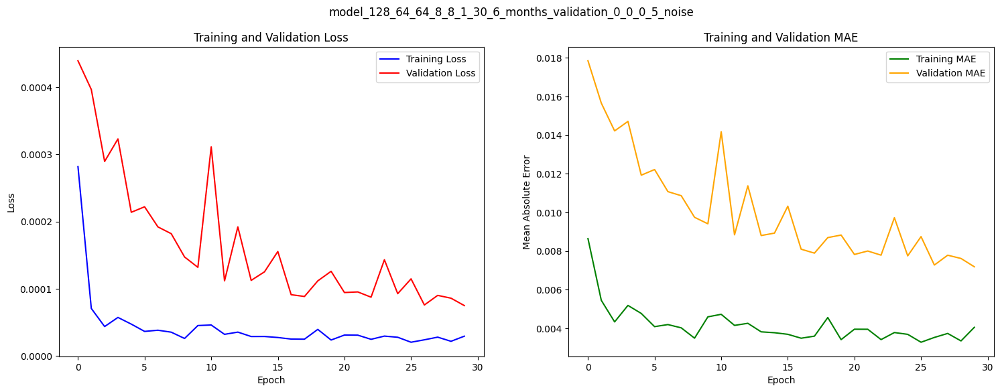

In [372]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise",
    model_history=history_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise,
)

##### **Observations**
Using six months of data as a window to predict the stock price, and adding noise to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is slightly greater compared to that obtained using a high performance model with 3 LSTM layers and 3 Dense layers, also using six months of data as a window. One option to potentially decrease the validation mean absolute error further is to try different data augmentation techniques

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - noise(0.005)
- Epochs: 30
- Batch Size: 16
- Training Loss: 2.9440e-05
- Validation Loss: 7.4957e-05
- Training MAE: 0.0040
- Validation MAE: 0.0072

<br></br>
#### **Jittering - 0.01**

In [373]:
def add_noise(data, noise_level):
    # Generate random Gaussian noise. This noise has a mean of 0 and a standard deviation provided by 'noise_level'.
    # The size of the noise array is the same as the size of the input data.
    noise = np.random.normal(loc=0.0, scale=noise_level, size=data.shape)

    # Add the generated noise to the original data. This simulates real-world unpredictability in the data.
    return data + noise

In [374]:
# Let's add random noise to six-month training data window
x_train_6_months_noisy_0_0_1 = add_noise(x_train_6_months, noise_level=0.01)

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [375]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise.add(
    LSTM(
        128,
        return_sequences=True,
        input_shape=(x_train_6_months_noisy_0_0_1.shape[1], 1),
    )
)
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise.add(
    LSTM(64, return_sequences=True)
)
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise.add(
    LSTM(64, return_sequences=False)
)

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise.add(Dense(1))

In [376]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [377]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise = (
    model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise.fit(
        x_train_6_months_noisy_0_0_1,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 25s 142ms/step - loss: 2.0123e-04 - mean_absolute_error: 0.0087 - val_loss: 4.8198e-04 - val_mean_absolute_error: 0.0171
Epoch 2/30
140/140 [==============================] - 19s 137ms/step - loss: 6.1152e-05 - mean_absolute_error: 0.0054 - val_loss: 3.0552e-04 - val_mean_absolute_error: 0.0147
Epoch 3/30
140/140 [==============================] - 19s 137ms/step - loss: 5.9178e-05 - mean_absolute_error: 0.0055 - val_loss: 2.6424e-04 - val_mean_absolute_error: 0.0137
Epoch 4/30
140/140 [==============================] - 19s 137ms/step - loss: 6.1496e-05 - mean_absolute_error: 0.0056 - val_loss: 2.5072e-04 - val_mean_absolute_error: 0.0133
Epoch 5/30
140/140 [==============================] - 17s 117ms/step - loss: 6.2748e-05 - mean_absolute_error: 0.0056 - val_loss: 3.1506e-04 - val_mean_absolute_error: 0.0137
Epoch 6/30
140/140 [==============================] - 19s 136ms/step - loss: 5.7641e-05 - mean_absolute_error: 0.0055 - val_l

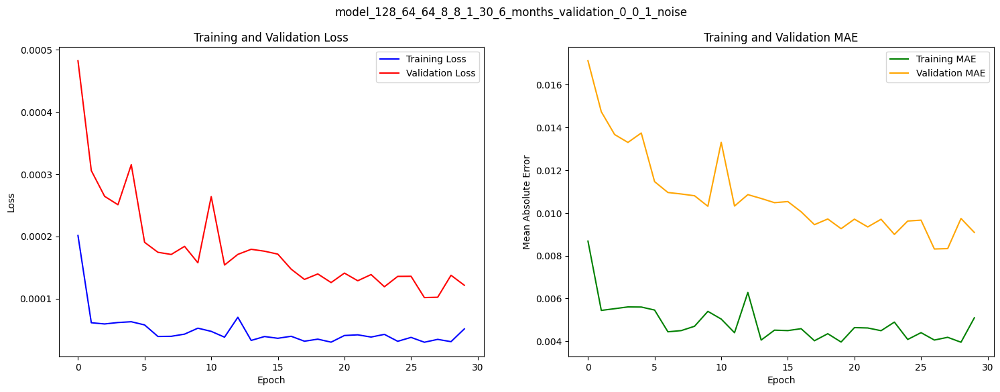

In [378]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise",
    model_history=history_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise,
)

##### **Observations**
Using six months of data as a window to predict the stock price, and adding noise to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is also greater than when using noise level of 0.005 with the same six-month data window. One option to potentially decrease the validation mean absolute error further is to try different data augmentation techniques.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - noise(0.0.1)
- Epochs: 30
- Batch Size: 16
- Training Loss: 5.1233e-05
- Validation Loss: 1.2134e-04
- Training MAE: 0.0051
- Validation MAE: 0.0091

<br></br>
#### **Jittering - 0.03**

In [379]:
def add_noise(data, noise_level):
    # Generate random Gaussian noise. This noise has a mean of 0 and a standard deviation provided by 'noise_level'.
    # The size of the noise array is the same as the size of the input data.
    noise = np.random.normal(loc=0.0, scale=noise_level, size=data.shape)

    # Add the generated noise to the original data. This simulates real-world unpredictability in the data.
    return data + noise

In [380]:
# Let's add random noise to six-month training data window
x_train_6_months_noisy_0_0_3 = add_noise(x_train_6_months, noise_level=0.03)

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [381]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise.add(
    LSTM(
        128,
        return_sequences=True,
        input_shape=(x_train_6_months_noisy_0_0_3.shape[1], 1),
    )
)
model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise.add(
    LSTM(64, return_sequences=True)
)
model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise.add(
    LSTM(64, return_sequences=False)
)

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise.add(Dense(1))

In [382]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [383]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise = (
    model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise.fit(
        x_train_6_months_noisy_0_0_3,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 25s 143ms/step - loss: 3.5745e-04 - mean_absolute_error: 0.0105 - val_loss: 5.5851e-04 - val_mean_absolute_error: 0.0204
Epoch 2/30
140/140 [==============================] - 20s 140ms/step - loss: 1.3934e-04 - mean_absolute_error: 0.0089 - val_loss: 4.9627e-04 - val_mean_absolute_error: 0.0191
Epoch 3/30
140/140 [==============================] - 16s 117ms/step - loss: 1.3909e-04 - mean_absolute_error: 0.0083 - val_loss: 5.4799e-04 - val_mean_absolute_error: 0.0184
Epoch 4/30
140/140 [==============================] - 47s 335ms/step - loss: 1.4237e-04 - mean_absolute_error: 0.0086 - val_loss: 4.7874e-04 - val_mean_absolute_error: 0.0186
Epoch 5/30
140/140 [==============================] - 21s 151ms/step - loss: 1.0223e-04 - mean_absolute_error: 0.0075 - val_loss: 4.6309e-04 - val_mean_absolute_error: 0.0173
Epoch 6/30
140/140 [==============================] - 19s 138ms/step - loss: 9.5048e-05 - mean_absolute_error: 0.0072 - val_l

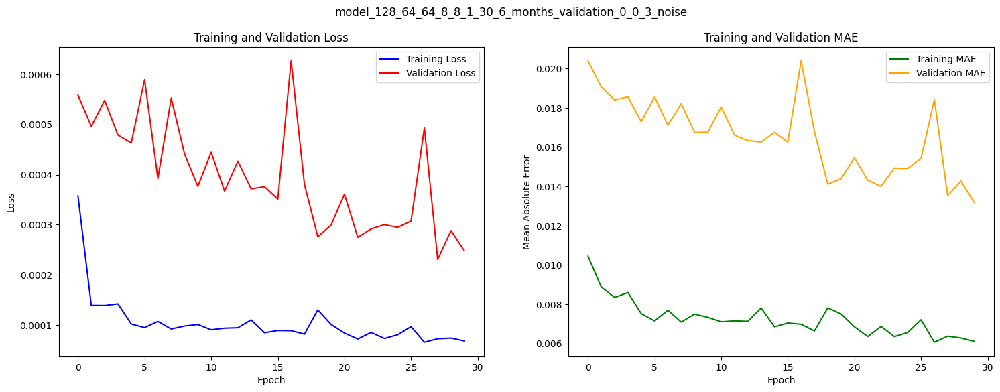

In [384]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise",
    model_history=history_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise,
)

##### **Observations**
Using six months of data as a window to predict stock prices, and adding noise(0.03) to the input training samples, we see that the training loss and mean absolute error are gradually decreasing. However, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is also greater than when using noise levels of 0.005 and 0.01 with the same six-month data window. One option to potentially decrease the validation mean absolute error further is to try different data augmentation techniques.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - noise(0.0.3)
- Epochs: 30
- Batch Size: 16
- Training Loss: 6.8357e-05
- Validation Loss: 2.4819e-04
- Training MAE: 0.0061
- Validation MAE: 0.0132

<br></br>
#### **Scaling**

In [388]:
def scaling(data, sigma):
    # Apply scaling augmentation to the dataset by multiplying with a random normal factor.
    factor = np.random.normal(loc=1.0, scale=sigma, size=(data.shape[0], data.shape[2]))
    return np.multiply(data, factor[:, np.newaxis, :])

<br></br>
#### **sigma = 0.01**

In [389]:
# Let's scale each time series of six-month training data window by constant amount
x_train_6_months_scaled_0_0_1 = scaling(x_train_6_months, sigma=0.01)

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [390]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled.add(
    LSTM(
        128,
        return_sequences=True,
        input_shape=(x_train_6_months_scaled_0_0_1.shape[1], 1),
    )
)
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled.add(
    LSTM(64, return_sequences=True)
)
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled.add(
    LSTM(64, return_sequences=False)
)

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled.add(Dense(1))

In [391]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [392]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled = (
    model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled.fit(
        x_train_6_months_scaled_0_0_1,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 48s 146ms/step - loss: 2.1112e-04 - mean_absolute_error: 0.0081 - val_loss: 3.9642e-04 - val_mean_absolute_error: 0.0168
Epoch 2/30
140/140 [==============================] - 17s 120ms/step - loss: 5.5765e-05 - mean_absolute_error: 0.0048 - val_loss: 8.5301e-04 - val_mean_absolute_error: 0.0235
Epoch 3/30
140/140 [==============================] - 24s 169ms/step - loss: 6.5409e-05 - mean_absolute_error: 0.0056 - val_loss: 2.7357e-04 - val_mean_absolute_error: 0.0137
Epoch 4/30
140/140 [==============================] - 25s 178ms/step - loss: 4.2506e-05 - mean_absolute_error: 0.0042 - val_loss: 2.2954e-04 - val_mean_absolute_error: 0.0123
Epoch 5/30
140/140 [==============================] - 22s 158ms/step - loss: 4.4466e-05 - mean_absolute_error: 0.0046 - val_loss: 2.0410e-04 - val_mean_absolute_error: 0.0114
Epoch 6/30
140/140 [==============================] - 18s 128ms/step - loss: 3.5767e-05 - mean_absolute_error: 0.0038 - val_l

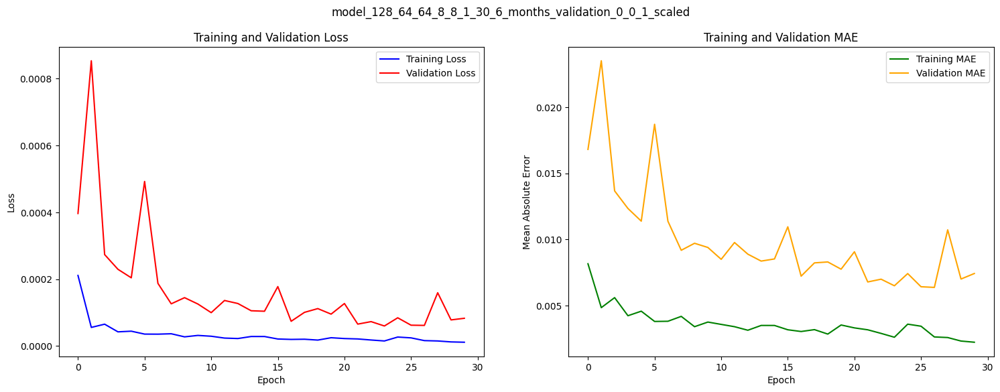

In [398]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled",
    model_history=history_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled,
)

##### **Observations**
Using six months of data as a window to predict the stock price, and scaling by constant amount to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is less than when using noise levels of 0.03 and 0.01 with the same six-month data window. One option to potentially decrease the validation mean absolute error further is to increase/decrease the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - scaling(0.0.1)
- Epochs: 30
- Batch Size: 16
- Training Loss: 1.1455e-05
- Validation Loss: 8.3085e-05
- Training MAE: 0.0022
- Validation MAE: 0.0074

<br></br>
#### **sigma = 0.1**

In [399]:
# Let's scale each time series of six-month training data window by constant amount
x_train_6_months_scaled_0_1 = scaling(x_train_6_months, sigma=0.1)

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [400]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled.add(
    LSTM(
        128,
        return_sequences=True,
        input_shape=(x_train_6_months_scaled_0_1.shape[1], 1),
    )
)
model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled.add(
    LSTM(64, return_sequences=True)
)
model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled.add(
    LSTM(64, return_sequences=False)
)

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled.add(Dense(1))

In [401]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [402]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_validation_0_1_scaled = (
    model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled.fit(
        x_train_6_months_scaled_0_1,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 26s 161ms/step - loss: 4.0306e-04 - mean_absolute_error: 0.0113 - val_loss: 4.1517e-04 - val_mean_absolute_error: 0.0170
Epoch 2/30
140/140 [==============================] - 25s 176ms/step - loss: 1.1064e-04 - mean_absolute_error: 0.0063 - val_loss: 3.8104e-04 - val_mean_absolute_error: 0.0164
Epoch 3/30
140/140 [==============================] - 19s 132ms/step - loss: 1.5969e-04 - mean_absolute_error: 0.0079 - val_loss: 4.1548e-04 - val_mean_absolute_error: 0.0167
Epoch 4/30
140/140 [==============================] - 22s 156ms/step - loss: 1.0702e-04 - mean_absolute_error: 0.0066 - val_loss: 3.3518e-04 - val_mean_absolute_error: 0.0150
Epoch 5/30
140/140 [==============================] - 23s 166ms/step - loss: 1.3287e-04 - mean_absolute_error: 0.0075 - val_loss: 2.3892e-04 - val_mean_absolute_error: 0.0123
Epoch 6/30
140/140 [==============================] - 23s 163ms/step - loss: 1.1654e-04 - mean_absolute_error: 0.0071 - val_l

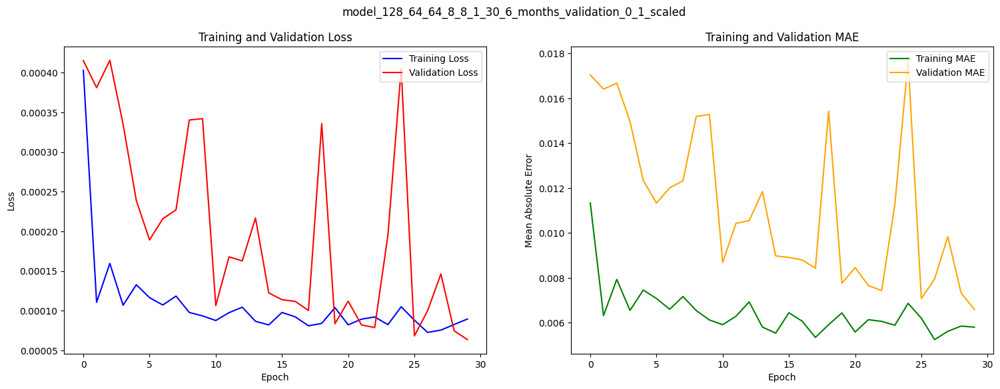

In [403]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled",
    model_history=history_128_64_64_8_8_1_30_6_months_validation_0_1_scaled,
)

##### **Observations**
Using six months of data as a window to predict the stock price, and scaling by constant amount to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is similar to that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is less than when using noise levels of 0.0053, 0.03 and 0.01 with the same six-month data window. One option to potentially decrease the validation mean absolute error further is to increase/decrease the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - scaling(0.1)
- Epochs: 30
- Batch Size: 16
- Training Loss: 8.9622e-05
- Validation Loss: 6.3728e-05
- Training MAE: 0.0058
- Validation MAE: 0.0066

<br></br>
#### **sigma = 0.3**

In [404]:
# Let's scale each time series of six-month training data window by constant amount
x_train_6_months_scaled_0_3 = scaling(x_train_6_months, sigma=0.3)

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [405]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled.add(
    LSTM(
        128,
        return_sequences=True,
        input_shape=(x_train_6_months_scaled_0_3.shape[1], 1),
    )
)
model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled.add(
    LSTM(64, return_sequences=True)
)
model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled.add(
    LSTM(64, return_sequences=False)
)

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled.add(Dense(1))

In [406]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [407]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_validation_0_3_scaled = (
    model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled.fit(
        x_train_6_months_scaled_0_3,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 27s 156ms/step - loss: 7.5104e-04 - mean_absolute_error: 0.0172 - val_loss: 4.4250e-04 - val_mean_absolute_error: 0.0167
Epoch 2/30
140/140 [==============================] - 44s 315ms/step - loss: 5.8796e-04 - mean_absolute_error: 0.0150 - val_loss: 4.3974e-04 - val_mean_absolute_error: 0.0168
Epoch 3/30
140/140 [==============================] - 21s 148ms/step - loss: 5.7471e-04 - mean_absolute_error: 0.0153 - val_loss: 4.0774e-04 - val_mean_absolute_error: 0.0161
Epoch 4/30
140/140 [==============================] - 32s 228ms/step - loss: 5.3428e-04 - mean_absolute_error: 0.0143 - val_loss: 2.6578e-04 - val_mean_absolute_error: 0.0136
Epoch 5/30
140/140 [==============================] - 54s 375ms/step - loss: 5.6877e-04 - mean_absolute_error: 0.0149 - val_loss: 2.5775e-04 - val_mean_absolute_error: 0.0132
Epoch 6/30
140/140 [==============================] - 19s 133ms/step - loss: 5.4194e-04 - mean_absolute_error: 0.0144 - val_l

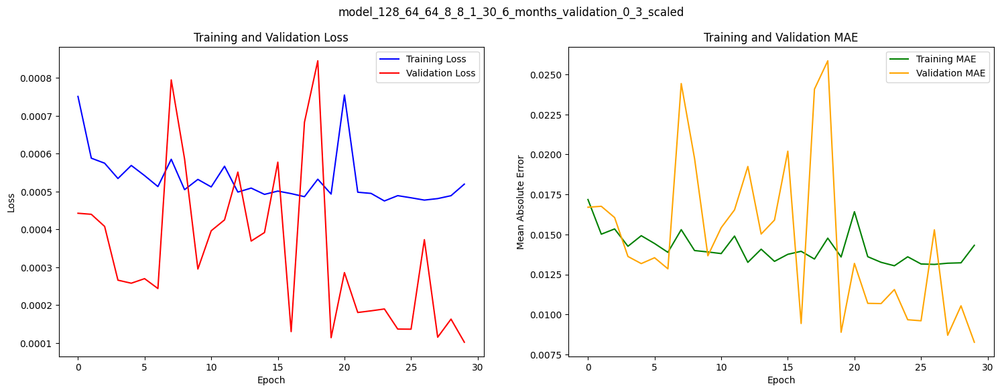

In [408]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled",
    model_history=history_128_64_64_8_8_1_30_6_months_validation_0_3_scaled,
)

##### **Observations**
Using six months of data as a window to predict the stock price, and scaling by constant amount(0.3) to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than to that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is less than when using noise levels of 0.03 and 0.01 with the same six-month data window. One option to potentially decrease the validation mean absolute error further is to increase/decrease the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - 0.3 Scaling
- Epochs: 30
- Batch Size: 16
- Training Loss: 5.1943e-04
- Validation Loss: 1.0191e-04
- Training MAE: 0.0143
- Validation MAE: 0.0083

<br></br>

<br></br>
#### **Magnitude Warping**

In [477]:
from scipy.interpolate import CubicSpline


def magnitude_warp(x, sigma, knot):
    # Import the CubicSpline function from scipy for smooth interpolation
    from scipy.interpolate import CubicSpline

    # Create an array of indices representing each time step in the data
    orig_steps = np.arange(x.shape[1])

    # Generate random factors for warping, normally distributed around 1 with a deviation of sigma
    random_warps = np.random.normal(
        loc=1.0, scale=sigma, size=(x.shape[0], knot + 2, x.shape[2])
    )
    # Define the time steps at which to apply these random factors
    warp_steps = (
        np.ones((x.shape[2], 1)) * (np.linspace(0, x.shape[1] - 1.0, num=knot + 2))
    ).T
    # Initialize an output array with the same shape as the input, filled with zeros
    ret = np.zeros_like(x)
    # Loop over each sample in the dataset
    for i, pat in enumerate(x):
        # Compute the warping function for each feature using cubic spline interpolation
        warper = np.array(
            [
                CubicSpline(warp_steps[:, dim], random_warps[i, :, dim])(orig_steps)
                for dim in range(x.shape[2])
            ]
        ).T
        # Apply the warping function to the data by element-wise multiplication
        ret[i] = pat * warper

    # Return the warped dataset
    return ret

<br></br>
#### **sigma = 0.2, knot = 1**

In [476]:
# Let's warp each time series of six-month training data window by constant amount
x_train_6_months_mag_warped_0_2_1 = magnitude_warp(x_train_6_months, sigma=0.2, knot=1)

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [478]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1 = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1.add(
    LSTM(
        128,
        return_sequences=True,
        input_shape=(x_train_6_months_mag_warped_0_2_1.shape[1], 1),
    )
)
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1.add(LSTM(64, return_sequences=True))
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1.add(Dense(1))

In [479]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [480]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1 = (
    model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1.fit(
        x_train_6_months_mag_warped_0_2_1,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 38s 220ms/step - loss: 4.2035e-04 - mean_absolute_error: 0.0120 - val_loss: 4.1987e-04 - val_mean_absolute_error: 0.0174
Epoch 2/30
140/140 [==============================] - 24s 173ms/step - loss: 3.3166e-04 - mean_absolute_error: 0.0118 - val_loss: 4.3665e-04 - val_mean_absolute_error: 0.0175
Epoch 3/30
140/140 [==============================] - 29s 208ms/step - loss: 2.7026e-04 - mean_absolute_error: 0.0103 - val_loss: 3.5028e-04 - val_mean_absolute_error: 0.0158
Epoch 4/30
140/140 [==============================] - 24s 173ms/step - loss: 2.5898e-04 - mean_absolute_error: 0.0096 - val_loss: 5.2455e-04 - val_mean_absolute_error: 0.0185
Epoch 5/30
140/140 [==============================] - 29s 205ms/step - loss: 3.1840e-04 - mean_absolute_error: 0.0113 - val_loss: 3.3345e-04 - val_mean_absolute_error: 0.0145
Epoch 6/30
140/140 [==============================] - 29s 206ms/step - loss: 2.5217e-04 - mean_absolute_error: 0.0099 - val_l

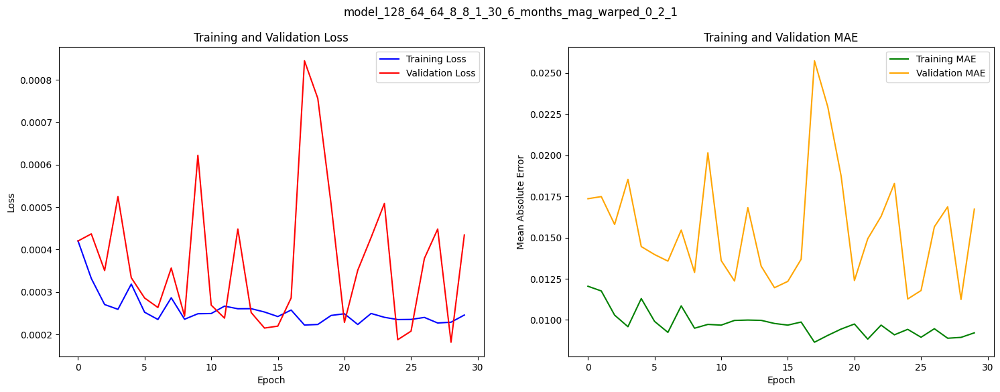

In [481]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1",
    model_history=history_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1,
)

##### **Observations**
Using six months of data as a window to predict the stock price and applying warping by constant amounts (0.2 and 4) to the input training samples, the training loss and mean absolute error are gradually decreasing. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with three LSTM layers and three dense layers. It is also greater than when using noise levels of 0.005, 0.03, and 0.01 and scale constants of 0.01, 0.1, and 0.3 with the same six-month data window. One option to potentially decrease the validation mean absolute error further is to adjust the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - 0.2 Warping
- Epochs: 30
- Batch Size: 16
- Training Loss: 2.4554e-04
- Validation Loss: 4.3419e-04
- Training MAE: 0.0092
- Validation MAE: 0.0167

<br></br>
#### **sigma = 0.2, knot = 4**

In [486]:
# Let's warp each time series of six-month training data window by constant amount
x_train_6_months_mag_warped_0_2_4 = magnitude_warp(x_train_6_months, sigma=0.2, knot=4)

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months**

In [487]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4 = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4.add(
    LSTM(
        128,
        return_sequences=True,
        input_shape=(x_train_6_months_mag_warped_0_2_4.shape[1], 1),
    )
)
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4.add(LSTM(64, return_sequences=True))
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4.add(Dense(1))

In [488]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [489]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4 = (
    model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4.fit(
        x_train_6_months_mag_warped_0_2_4,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 37s 227ms/step - loss: 5.1133e-04 - mean_absolute_error: 0.0132 - val_loss: 5.0108e-04 - val_mean_absolute_error: 0.0176
Epoch 2/30
140/140 [==============================] - 48s 341ms/step - loss: 2.8219e-04 - mean_absolute_error: 0.0113 - val_loss: 3.5042e-04 - val_mean_absolute_error: 0.0151
Epoch 3/30
140/140 [==============================] - 27s 189ms/step - loss: 2.6562e-04 - mean_absolute_error: 0.0101 - val_loss: 5.7363e-04 - val_mean_absolute_error: 0.0190
Epoch 4/30
140/140 [==============================] - 30s 212ms/step - loss: 2.3107e-04 - mean_absolute_error: 0.0095 - val_loss: 2.9615e-04 - val_mean_absolute_error: 0.0137
Epoch 5/30
140/140 [==============================] - 25s 176ms/step - loss: 2.1952e-04 - mean_absolute_error: 0.0092 - val_loss: 4.6149e-04 - val_mean_absolute_error: 0.0172
Epoch 6/30
140/140 [==============================] - 24s 173ms/step - loss: 2.5827e-04 - mean_absolute_error: 0.0105 - val_l

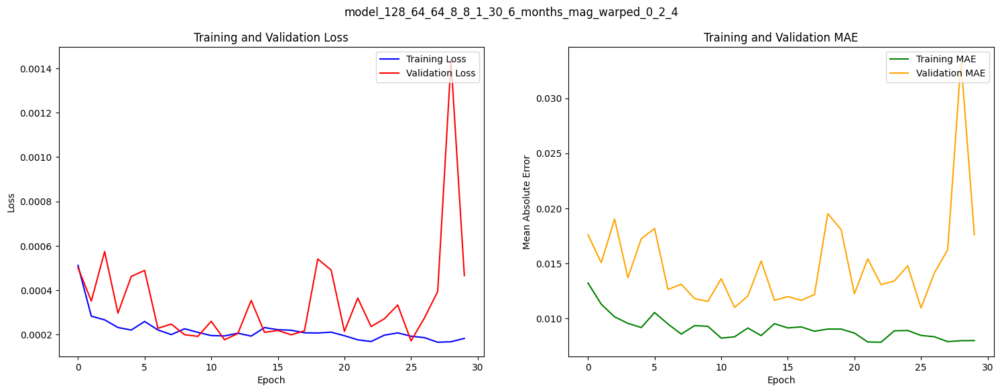

In [490]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4",
    model_history=history_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4,
)

##### **Observations**
Using six months of data as a window to predict the stock price and applying warping by constant amounts (0.2 and 4) to the input training samples, the training loss and mean absolute error are gradually decreasing. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with three LSTM layers and three dense layers. It is also greater than when using noise levels of 0.005, 0.03, and 0.01 and scale constants of 0.01, 0.1, and 0.3 with the same six-month data window. One option to potentially decrease the validation mean absolute error further is to adjust the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - 0.2 Warping
- Epochs: 30
- Batch Size: 16
- Training Loss: 2.4554e-04
- Validation Loss: 4.3419e-04
- Training MAE: 0.0092
- Validation MAE: 0.0167
<br></br>

In [491]:
# Let's define the list of models that are used for validation and comparison.
model_validation_list_augmentation = {
    "model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise": model_128_64_64_8_8_1_30_6_months_validation_0_0_0_5_noise,
    "model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise": model_128_64_64_8_8_1_30_6_months_validation_0_0_1_noise,
    "model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise": model_128_64_64_8_8_1_30_6_months_validation_0_0_3_noise,
    "model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled": model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled,
    "model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled": model_128_64_64_8_8_1_30_6_months_validation_0_1_scaled,
    "model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled": model_128_64_64_8_8_1_30_6_months_validation_0_3_scaled,
    "model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1": model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1,
    "model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_4": model_128_64_64_8_8_1_30_6_months_mag_warped_0_2_1,
}

In [721]:
model_validation_list_augmentation_plot = {
    "model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled": model_128_64_64_8_8_1_30_6_months_validation_0_0_1_scaled,
}

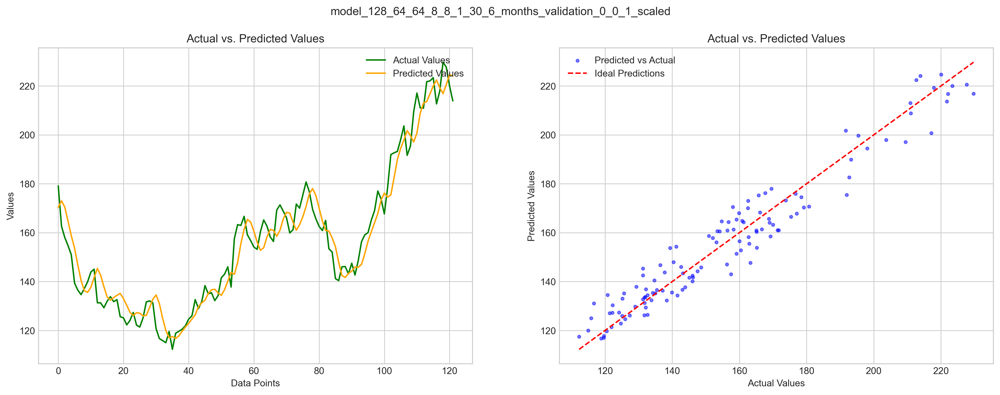

In [724]:
validation_testing_6_months_augmentation = []

for model_name in model_validation_list_augmentation_plot.keys():
    if "6_months" in model_name:
        model = keras.models.load_model(f"{model_name}_checkpoint_filepath")
        six_months_metrics_dict_augmentation = get_metrics(period=6, model=model)
        plot_metrics_and_predictions(
            model_name=model_name,
            actual_prices=six_months_metrics_dict_augmentation.get(
                "valid_actual_prices"
            ),
            predicted_prices=six_months_metrics_dict_augmentation.get(
                "valid_predicted_prices"
            ),
        )
        validation_testing_6_months_augmentation.append(
            {
                "Model Configuration": model_name,
                "period": "6 months",
                "Validation MAE": six_months_metrics_dict_augmentation.get(
                    "validation_mae"
                ),
                "Validation MAPE": six_months_metrics_dict_augmentation.get(
                    "validation_mape"
                ),
                "Test MAE": six_months_metrics_dict_augmentation.get("test_mae"),
                "Test MAPE": six_months_metrics_dict_augmentation.get("test_mape"),
            }
        )

<br></br>
#### **Printing Validation MSE and MAE for all the augmented models - 6 months**

In [493]:
# Let's convert the validation_testing list of dictionaries into a pandas data_frame
validation_testing_6_months_augmented_df = pd.DataFrame(
    validation_testing_6_months_augmentation
)
validation_testing_6_months_augmented_df

,Model Configuration,period,Validation MAE,Validation MAPE,Test MAE,Test MAPE
0,model_128_64_64_8_8_1_30_6_months_validation_0...,6 months,6.802560,0.044311,19.602779,0.029615
1,model_128_64_64_8_8_1_30_6_months_validation_0...,6 months,7.872104,0.050886,38.037239,0.052338
2,model_128_64_64_8_8_1_30_6_months_validation_0...,6 months,12.814412,0.082905,92.741540,0.127254
3,model_128_64_64_8_8_1_30_6_months_validation_0...,6 months,6.142313,0.039434,18.831326,0.027169
4,model_128_64_64_8_8_1_30_6_months_validation_0...,6 months,6.249270,0.040435,99.480830,0.148395
5,model_128_64_64_8_8_1_30_6_months_validation_0...,6 months,7.824560,0.049986,258.880185,0.359946
6,model_128_64_64_8_8_1_30_6_months_mag_warped_0...,6 months,10.648151,0.070893,203.769306,0.281648
7,model_128_64_64_8_8_1_30_6_months_mag_warped_0...,6 months,10.371709,0.069998,204.302959,0.280349


<br></br>
#### **Observations**
- - - - - - - - - - -

📊**The above table, which shows comparisons of different LSTM model configurations with added noise and scaling magnitude augmentations, represents a distinct noise/scaling constant in each row. These models were trained using a 6-month window with 3 LSTM and 3 Dense layers to predict daily stock prices. From the table, it is evident that the LSTM model trained with a scaling constant of 0.001 and a 6-month window outperformed those trained with other noise and scaling constant values** 📈

<br></br>

💡`The best model among the different configurations of LSTM layers and neurons is the one with three LSTM layers (128, 64, and 64 neurons, respectively) and three dense layers (8, 8, and 1 neurons, respectively) with 0.0.1 scaling constant`🏆

<br></br>
### **Effects of Regularization**

In [453]:
from keras.layers import BatchNormalization, Dropout

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months - Batch Normalization (1 Layer)**

In [445]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add Batch Normalization Layer
model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.add(BatchNormalization())

model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.add(
    LSTM(64, return_sequences=True)
)
model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.add(
    LSTM(64, return_sequences=False)
)

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.add(Dense(1))

In [446]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [447]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization = (
    model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 40s 243ms/step - loss: 0.0010 - mean_absolute_error: 0.0166 - val_loss: 0.0121 - val_mean_absolute_error: 0.1059
Epoch 2/30
140/140 [==============================] - 25s 177ms/step - loss: 2.3863e-04 - mean_absolute_error: 0.0123 - val_loss: 0.0122 - val_mean_absolute_error: 0.1069
Epoch 3/30
140/140 [==============================] - 31s 219ms/step - loss: 2.8358e-04 - mean_absolute_error: 0.0121 - val_loss: 0.0105 - val_mean_absolute_error: 0.0990
Epoch 4/30
140/140 [==============================] - 29s 210ms/step - loss: 2.4691e-04 - mean_absolute_error: 0.0122 - val_loss: 0.0094 - val_mean_absolute_error: 0.0949
Epoch 5/30
140/140 [==============================] - 30s 212ms/step - loss: 2.1216e-04 - mean_absolute_error: 0.0112 - val_loss: 0.0010 - val_mean_absolute_error: 0.0285
Epoch 6/30
140/140 [==============================] - 30s 213ms/step - loss: 2.0581e-04 - mean_absolute_error: 0.0111 - val_loss: 1.7989e-04 - val_me

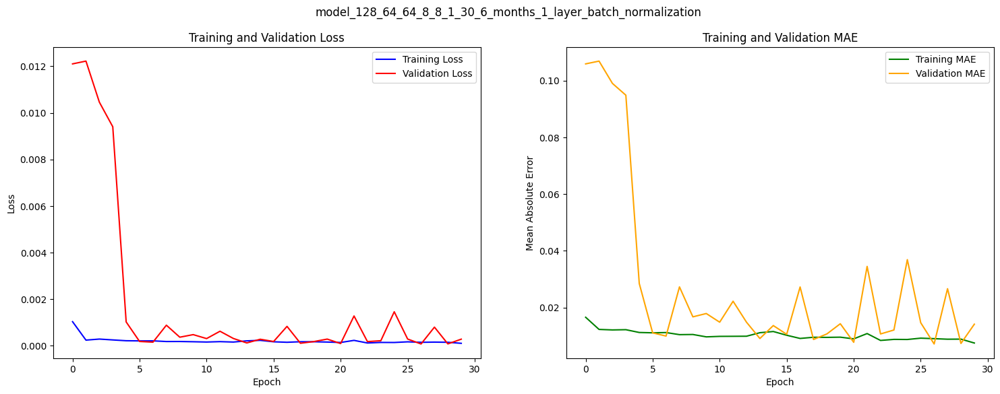

In [448]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization",
    model_history=history_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization,
)

##### **Observations**
Using six months of data as a window to predict stock prices and adding one batch normalization layer to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is significantly less than when using noise levels of 0.005, 0.03, and 0.01 with the same six-month data window and less than when using scaling constants of 0.1, and 0.3. One option to potentially decrease the validation mean absolute error further is to adjust the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - 1 Batch Normalization layer
- Epochs: 30
- Batch Size: 16
- Training Loss: 1.4557e-04
- Validation Loss: 2.7959e-04
- Training MAE: 0.0075
- Validation MAE: 0.0074

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months - Batch Normalization (2 Layers)**

In [449]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add Batch Normalization Layer
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.add(BatchNormalization())
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.add(
    LSTM(64, return_sequences=True)
)
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.add(
    LSTM(64, return_sequences=False)
)
# Let's add Batch Normalization Layer
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.add(BatchNormalization())

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.add(Dense(1))

In [450]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [451]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization = (
    model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 36s 220ms/step - loss: 0.0503 - mean_absolute_error: 0.0684 - val_loss: 0.0121 - val_mean_absolute_error: 0.1060
Epoch 2/30
140/140 [==============================] - 30s 215ms/step - loss: 7.6245e-04 - mean_absolute_error: 0.0218 - val_loss: 0.0082 - val_mean_absolute_error: 0.0866
Epoch 3/30
140/140 [==============================] - 32s 231ms/step - loss: 6.2507e-04 - mean_absolute_error: 0.0198 - val_loss: 0.0058 - val_mean_absolute_error: 0.0724
Epoch 4/30
140/140 [==============================] - 26s 188ms/step - loss: 4.6379e-04 - mean_absolute_error: 0.0165 - val_loss: 0.0241 - val_mean_absolute_error: 0.1526
Epoch 5/30
140/140 [==============================] - 32s 226ms/step - loss: 6.4341e-04 - mean_absolute_error: 0.0199 - val_loss: 3.7768e-04 - val_mean_absolute_error: 0.0158
Epoch 6/30
140/140 [==============================] - 25s 180ms/step - loss: 4.8374e-04 - mean_absolute_error: 0.0175 - val_loss: 0.0013 - val_me

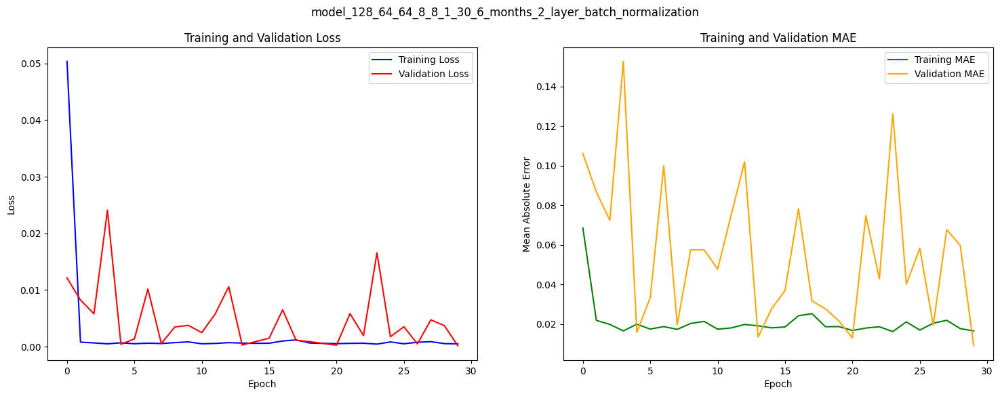

In [452]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization",
    model_history=history_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization,
)

##### **Observations**
Using six months of data as a window to predict stock prices and adding one batch normalization layer to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is significantly less than when using noise levels of 0.005, 0.03, and 0.01 with the same six-month data window and less than when using scaling constants of 0.01, 0.1, and 0.3. One option to potentially decrease the validation mean absolute error further is to adjust the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - 2 Batch Normalization layer
- Epochs: 30
- Batch Size: 16
- Training Loss: 4.6321e-04
- Validation Loss: 1.2961e-04
- Training MAE: 0.0165
- Validation MAE: 0.0090

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months - Dropout (1 Layer)**

In [454]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_1_layer_dropout = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_1_layer_dropout.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add Dropout Layer
model_128_64_64_8_8_1_30_6_months_1_layer_dropout.add(Dropout(0.2))
model_128_64_64_8_8_1_30_6_months_1_layer_dropout.add(LSTM(64, return_sequences=True))
model_128_64_64_8_8_1_30_6_months_1_layer_dropout.add(LSTM(64, return_sequences=False))

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_1_layer_dropout.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_1_layer_dropout.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_1_layer_dropout.add(Dense(1))

In [455]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_1_layer_dropout.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [456]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_1_layer_dropout_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_1_layer_dropout = (
    model_128_64_64_8_8_1_30_6_months_1_layer_dropout.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 36s 216ms/step - loss: 1.7809e-04 - mean_absolute_error: 0.0077 - val_loss: 3.9082e-04 - val_mean_absolute_error: 0.0168
Epoch 2/30
140/140 [==============================] - 29s 208ms/step - loss: 6.1145e-05 - mean_absolute_error: 0.0050 - val_loss: 3.0907e-04 - val_mean_absolute_error: 0.0146
Epoch 3/30
140/140 [==============================] - 24s 174ms/step - loss: 5.6783e-05 - mean_absolute_error: 0.0051 - val_loss: 3.5496e-04 - val_mean_absolute_error: 0.0155
Epoch 4/30
140/140 [==============================] - 29s 206ms/step - loss: 3.8512e-05 - mean_absolute_error: 0.0041 - val_loss: 1.9902e-04 - val_mean_absolute_error: 0.0117
Epoch 5/30
140/140 [==============================] - 29s 210ms/step - loss: 6.7507e-05 - mean_absolute_error: 0.0056 - val_loss: 1.9324e-04 - val_mean_absolute_error: 0.0116
Epoch 6/30
140/140 [==============================] - 25s 175ms/step - loss: 4.3435e-05 - mean_absolute_error: 0.0045 - val_l

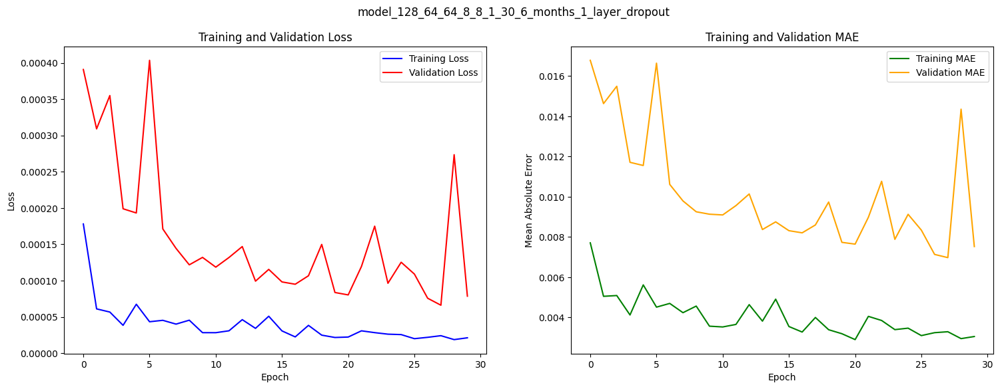

In [457]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_1_layer_dropout",
    model_history=history_128_64_64_8_8_1_30_6_months_1_layer_dropout,
)

##### **Observations**
Using six months of data as a window to predict stock prices and adding one batch normalization layer to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is significantly less than when using noise levels of 0.005, 0.03, and 0.01 with the same six-month data window and less than when using scaling constants of 0.1, and 0.3. One option to potentially decrease the validation mean absolute error further is to adjust the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - 1 Dropout layer
- Epochs: 30
- Batch Size: 16
- Training Loss: 2.1314e-05
- Validation Loss: 2.7959e-04
- Training MAE: 0.0031
- Validation MAE: 0.0075

<br></br>
#### **Model Building with 3 LSTM and 3 Dense layers (128-64-64-8-8-1) and 30 epochs - 6 months - Dropout (2 Layers)**

In [458]:
# Let's create a keras sequential model
model_128_64_64_8_8_1_30_6_months_2_layer_dropout = Sequential()

# Let's add two LSTM layer's to the model network
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.add(
    LSTM(128, return_sequences=True, input_shape=(x_train_6_months.shape[1], 1))
)
# Let's add Dropout Layer
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.add(Dropout(0.2))
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.add(LSTM(64, return_sequences=True))
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.add(LSTM(64, return_sequences=False))
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.add(Dropout(0.2))

# Let's add dense layer to the model network
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.add(Dense(8))
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.add(Dense(1))

In [459]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_128_64_64_8_8_1_30_6_months_2_layer_dropout.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [460]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_128_64_64_8_8_1_30_6_months_2_layer_dropout_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_128_64_64_8_8_1_30_6_months_2_layer_dropout = (
    model_128_64_64_8_8_1_30_6_months_2_layer_dropout.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 48s 316ms/step - loss: 2.2793e-04 - mean_absolute_error: 0.0090 - val_loss: 4.0502e-04 - val_mean_absolute_error: 0.0162
Epoch 2/30
140/140 [==============================] - 29s 206ms/step - loss: 1.1016e-04 - mean_absolute_error: 0.0069 - val_loss: 3.2464e-04 - val_mean_absolute_error: 0.0151
Epoch 3/30
140/140 [==============================] - 29s 210ms/step - loss: 7.9938e-05 - mean_absolute_error: 0.0058 - val_loss: 2.9277e-04 - val_mean_absolute_error: 0.0144
Epoch 4/30
140/140 [==============================] - 24s 172ms/step - loss: 8.8213e-05 - mean_absolute_error: 0.0061 - val_loss: 3.3850e-04 - val_mean_absolute_error: 0.0141
Epoch 5/30
140/140 [==============================] - 24s 173ms/step - loss: 1.0610e-04 - mean_absolute_error: 0.0068 - val_loss: 3.3435e-04 - val_mean_absolute_error: 0.0142
Epoch 6/30
140/140 [==============================] - 24s 172ms/step - loss: 1.0584e-04 - mean_absolute_error: 0.0067 - val_l

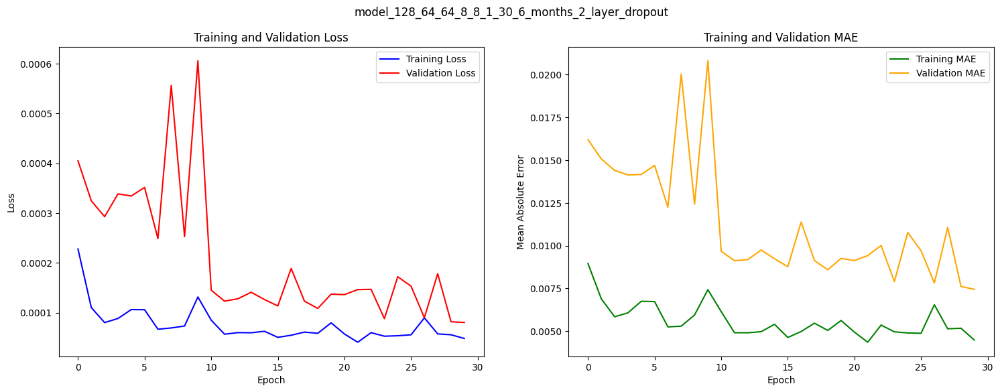

In [461]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_128_64_64_8_8_1_30_6_months_2_layer_dropout",
    model_history=history_128_64_64_8_8_1_30_6_months_2_layer_dropout,
)

##### **Observations**
Using six months of data as a window to predict stock prices and adding one batch normalization layer to the input training samples, the training loss and mean absolute error are decreasing gradually. In contrast, the validation loss and mean absolute error are fluctuating, i.e., both increasing and decreasing. The observed validation mean absolute error is greater than that obtained using a high-performance model with 3 LSTM layers and 3 Dense layers. It is significantly less than when using noise levels of 0.005, 0.03, and 0.01 with the same six-month data window and less than when using scaling constants of 0.1, and 0.3. One option to potentially decrease the validation mean absolute error further is to adjust the scaling magnitude.

- 3 LSTM(128-64-64) 3 Dense(8-8-1) - 6 months - 1 Dropout layer
- Epochs: 30
- Batch Size: 16
- Training Loss: 4.8052e-05
- Validation Loss: 8.0147e-05
- Training MAE: 0.0045
- Validation MAE: 0.0074

In [464]:
# Let's define the list of models that are used for validation and comparison.
model_validation_regularization = {
    "model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization": model_128_64_64_8_8_1_30_6_months_1_layer_batch_normalization,
    "model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization": model_128_64_64_8_8_1_30_6_months_2_layer_batch_normalization,
    "model_128_64_64_8_8_1_30_6_months_1_layer_dropout": model_128_64_64_8_8_1_30_6_months_1_layer_dropout,
    "model_128_64_64_8_8_1_30_6_months_2_layer_dropout": model_128_64_64_8_8_1_30_6_months_2_layer_dropout,
}

In [725]:
# Let's define the list of models that are used for validation and comparison.
model_validation_regularization_plot = {
    "model_128_64_64_8_8_1_30_6_months_1_layer_dropout": model_128_64_64_8_8_1_30_6_months_1_layer_dropout,
}

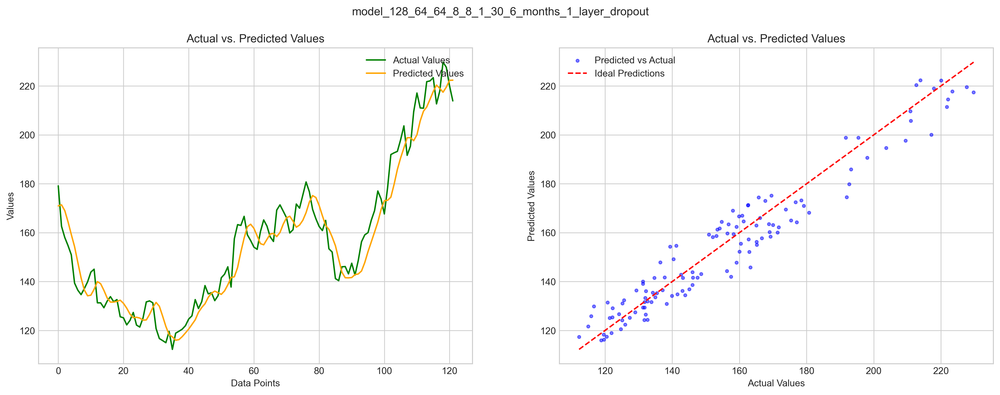

In [727]:
validation_testing_6_months_regularization = []

for model_name in model_validation_regularization.keys():
    if "6_months" in model_name:
        model = keras.models.load_model(f"{model_name}_checkpoint_filepath")
        six_months_metrics_dict_regularization = get_metrics(period=6, model=model)
        plot_metrics_and_predictions(
            model_name=model_name,
            actual_prices=six_months_metrics_dict_regularization.get(
                "valid_actual_prices"
            ),
            predicted_prices=six_months_metrics_dict_regularization.get(
                "valid_predicted_prices"
            ),
        )
        validation_testing_6_months_regularization.append(
            {
                "Model Configuration": model_name,
                "period": "6 months",
                "Validation MAE": six_months_metrics_dict_regularization.get(
                    "validation_mae"
                ),
                "Validation MAPE": six_months_metrics_dict_regularization.get(
                    "validation_mape"
                ),
                "Test MAE": six_months_metrics_dict_regularization.get("test_mae"),
                "Test MAPE": six_months_metrics_dict_regularization.get("test_mape"),
            }
        )

<br></br>
#### **Printing Validation MSE and MAE for all the regularization models - 6 months**

In [466]:
# Let's convert the validation_testing list of dictionaries into a pandas data_frame
validation_testing_6_months_regularization_df = pd.DataFrame(
    validation_testing_6_months_regularization
)
validation_testing_6_months_regularization_df

,Model Configuration,period,Validation MAE,Validation MAPE,Test MAE,Test MAPE
0,model_128_64_64_8_8_1_30_6_months_1_layer_batc...,6 months,6.799067,0.044139,247.337539,0.331576
1,model_128_64_64_8_8_1_30_6_months_2_layer_batc...,6 months,8.567218,0.055651,168.914832,0.233823
2,model_128_64_64_8_8_1_30_6_months_1_layer_dropout,6 months,6.603170,0.042127,21.736594,0.030256
3,model_128_64_64_8_8_1_30_6_months_2_layer_dropout,6 months,7.053871,0.045771,19.266117,0.027392


<br></br>
#### **Observations**
- - - - - - - - - - -

📊**The table above, which shows comparisons of different LSTM model configurations with either one or two batch normalization or dropout layers, represents a distinct configuration in each row. These models were trained using a 6-month window with three LSTM and three Dense layers to predict daily stock prices. From the table, it is evident that the LSTM model trained with one dropout layer at a rate of 0.2 and a 6-month window outperformed those trained with one or two batch normalization layers and two dropout layers.** 📈

<br></br>

💡`The best model among the different configurations of LSTM layers and neurons is the one with three LSTM layers (128, 64, and 64 neurons, respectively) and three dense layers (8, 8, and 1 neurons, respectively) with one dropout layer`🏆

<br></br>
### **Powerful Architecture**

In [518]:
from prophet import Prophet
from datetime import timedelta
from keras.layers import Bidirectional

/Users/avinash-chaluvadi/miniforge3/envs/deep-learning/lib/python3.8/site-packages/tqdm/auto.py:21: TqdmWarning:

IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html



<br></br>
#### **Bidirectional LSTM**

In [499]:
def create_bidirectional_lstm_model(input_shape):
    model = Sequential(
        [
            # First layer needs to specify input_shape and should return sequences
            Bidirectional(LSTM(128, return_sequences=True), input_shape=input_shape),
            Dropout(0.2),
            # Intermediate LSTM layers should also return sequences except for the last LSTM layer
            Bidirectional(LSTM(64, return_sequences=True)),
            Dropout(0.2),
            Bidirectional(
                LSTM(32, return_sequences=True)
            ),  # If you want more layers, they should also return sequences
            Dropout(0.2),
            # Only the last LSTM layer should not return sequences unless followed by another LSTM layer
            Bidirectional(LSTM(64, return_sequences=True)),
            Dropout(0.2),
            Bidirectional(LSTM(64, return_sequences=True)),
            Dropout(0.2),
            Bidirectional(LSTM(64)),
            Dropout(0.2),
            Dense(25),
            Dropout(0.2),
            Dense(1),
        ]
    )
    return model


# Assume your input shape from the data preprocessing step is (180, 2) for each sample
model_powerful_architecture_bidirectional = create_bidirectional_lstm_model(
    input_shape=(x_train_6_months.shape[1], 1)
)
model_powerful_architecture_bidirectional.summary()

Model: "sequential_72"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 bidirectional_20 (Bidirect  (None, 180, 256)          133120    
 ional)                                                          
                                                                 
 dropout_21 (Dropout)        (None, 180, 256)          0         
                                                                 
 bidirectional_21 (Bidirect  (None, 180, 128)          164352    
 ional)                                                          
                                                                 
 dropout_22 (Dropout)        (None, 180, 128)          0         
                                                                 
 bidirectional_22 (Bidirect  (None, 180, 64)           41216     
 ional)                                                          
                                                     

In [500]:
# Let's build the model using mean_squared_error as the loss function
# and mean_absolute_error as the evaluation metric during the compilation process
model_powerful_architecture_bidirectional.compile(
    optimizer="adam", loss="mean_squared_error", metrics=["mean_absolute_error"]
)

In [501]:
# Let's define the callbacks for Model saving and Early stopping
cb_check = keras.callbacks.ModelCheckpoint(
    filepath="model_powerful_architecture_bidirectional_checkpoint_filepath",
    save_best_only=True,
    monitor="val_loss",
)

cb_early = keras.callbacks.EarlyStopping(monitor="val_loss", patience=30)

# Let's fit the sequential model with input features and output label
history_powerful_architecture_bidirectional = (
    model_powerful_architecture_bidirectional.fit(
        x_train_6_months,
        y_train_6_months,
        batch_size=16,
        epochs=30,
        callbacks=[cb_check, cb_early],
        validation_data=(x_valid_6_months, y_valid_6_months),
    )
)

Epoch 1/30
140/140 [==============================] - 123s 764ms/step - loss: 7.6105e-04 - mean_absolute_error: 0.0172 - val_loss: 8.6744e-04 - val_mean_absolute_error: 0.0237
Epoch 2/30
140/140 [==============================] - 92s 658ms/step - loss: 2.8311e-04 - mean_absolute_error: 0.0107 - val_loss: 7.5064e-04 - val_mean_absolute_error: 0.0223
Epoch 3/30
140/140 [==============================] - 112s 796ms/step - loss: 2.9500e-04 - mean_absolute_error: 0.0107 - val_loss: 6.9599e-04 - val_mean_absolute_error: 0.0212
Epoch 4/30
140/140 [==============================] - 78s 554ms/step - loss: 3.0989e-04 - mean_absolute_error: 0.0115 - val_loss: 0.0024 - val_mean_absolute_error: 0.0436
Epoch 5/30
140/140 [==============================] - 151s 1s/step - loss: 2.4741e-04 - mean_absolute_error: 0.0105 - val_loss: 4.0965e-04 - val_mean_absolute_error: 0.0167
Epoch 6/30
140/140 [==============================] - 57s 407ms/step - loss: 2.2896e-04 - mean_absolute_error: 0.0098 - val_loss:

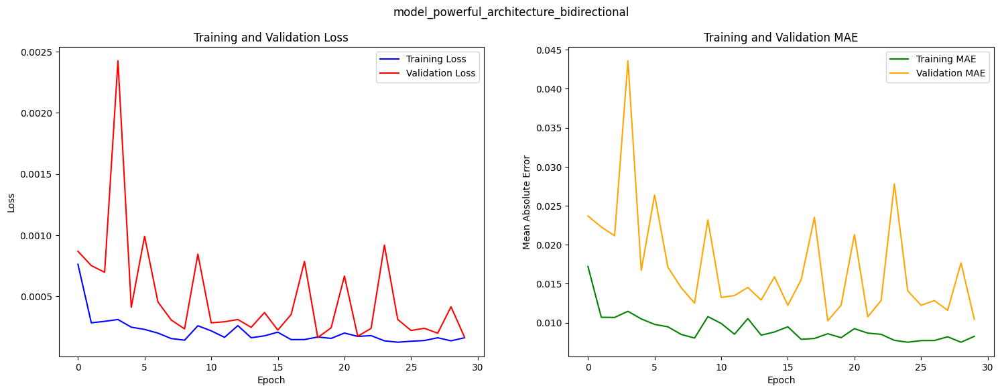

In [502]:
# Let's plot the mean_squared_error and mean_absolute_error using model history on the entire dataset
plot_loss_and_mae_validation(
    model_name="model_powerful_architecture_bidirectional",
    model_history=history_powerful_architecture_bidirectional,
)

In [567]:
# Let's define the list of models that are used for validation and comparison.
model_validation_powerful_architecture = {
    "model_powerful_architecture_bidirectional": model_powerful_architecture_bidirectional,
}

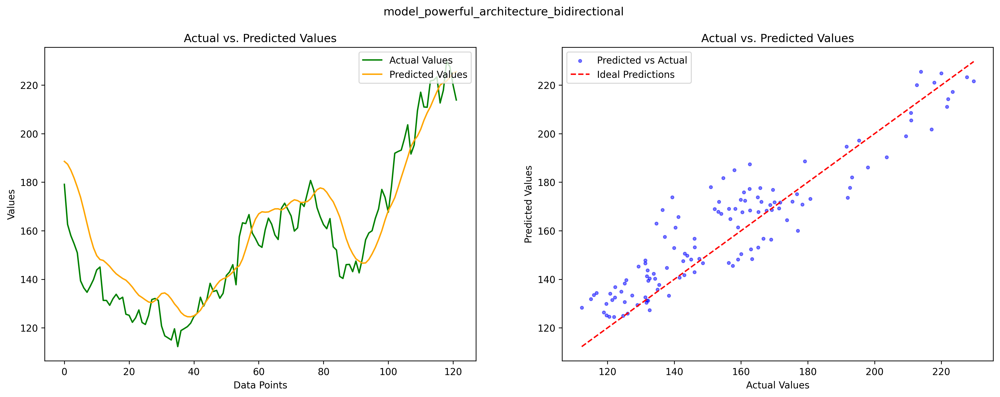

In [569]:
validation_testing_6_months_powerful_architecture = []

for model_name in model_validation_powerful_architecture.keys():
    model = keras.models.load_model(f"{model_name}_checkpoint_filepath")
    six_months_metrics_dict_powerful_architecture = get_metrics(period=6, model=model)
    plot_metrics_and_predictions(
        model_name=model_name,
        actual_prices=six_months_metrics_dict_powerful_architecture.get(
            "valid_actual_prices"
        ),
        predicted_prices=six_months_metrics_dict_powerful_architecture.get(
            "valid_predicted_prices"
        ),
    )
    validation_testing_6_months_powerful_architecture.append(
        {
            "Model Configuration": model_name,
            "period": "6 months",
            "Validation MAE": six_months_metrics_dict_powerful_architecture.get(
                "validation_mae"
            ),
            "Validation MAPE": six_months_metrics_dict_powerful_architecture.get(
                "validation_mape"
            ),
            "Test MAE": six_months_metrics_dict_powerful_architecture.get("test_mae"),
            "Test MAPE": six_months_metrics_dict_powerful_architecture.get("test_mape"),
        }
    )

<br></br>
#### **Printing Validation MSE and MAE for all the regularization models - 6 months**

In [571]:
# Let's convert the validation_testing list of dictionaries into a pandas data_frame
validation_testing_6_months_powerful_architecture_df = pd.DataFrame(
    validation_testing_6_months_powerful_architecture
)
validation_testing_6_months_powerful_architecture_df

,Model Configuration,period,Validation MAE,Validation MAPE,Test MAE,Test MAPE
0,model_powerful_architecture_bidirectional,6 months,9.702311,0.064795,33.59239,0.046592


<br></br>
#### **Observations**

Using a powerful architecture like stacked bidirectional LSTM, the training loss and training MAE are gradually decreasing; however, the validation loss and validation MAE are fluctuating, i.e., increasing and decreasing. The observed validation MAE is significantly higher than that of the base model with three LSTM layers (128-64-64) and three Dense layers (8-8-1). Additionally, the observed MAE using bidirectional LSTM is significantly higher than that achieved by applying augmentation techniques or using dropout and batch normalization.

- Epochs: 30
- Batch Size: 16
- Training Loss: 1.6067e-04
- Validation Loss: 1.6935e-04
- Training MAE: 0.0083
- Validation MAE: 0.0104

<br></br>
#### **Pre-Trained Model - Prophet**

In [728]:
# Let's reset_index of nvidia_data_frame to prepare the data_frame for prophet
df_prophet = nvidia_data_frame_viz.reset_index().rename(
    columns={"Date": "ds", "Close": "y"}
)

In [729]:
# Split the data into train and test sets
train_size = int(0.9 * len(df_prophet))
train_df = df_prophet.iloc[:train_size]
test_df = df_prophet.iloc[train_size:]

# Initialize and fit the Prophet model
model = Prophet(daily_seasonality=True)
model.fit(train_df)

# Predict on the test set
future = model.make_future_dataframe(periods=len(test_df), freq="D")
forecast = model.predict(future)

# Extract predictions and compare them with the actual test values
preds = forecast["yhat"][train_size:]

DEBUG:cmdstanpy:input tempfile: /var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/04ojwahe.json
DEBUG:cmdstanpy:input tempfile: /var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/6by5yv0w.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/Users/avinash-chaluvadi/miniforge3/envs/deep-learning/lib/python3.8/site-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=90758', 'data', 'file=/var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/04ojwahe.json', 'init=/var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/6by5yv0w.json', 'output', 'file=/var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/prophet_modelqvbg8f8u/prophet_model-20240506232347.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
23:23:47 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
python(87993) MallocStackLogging: can't turn off malloc stack logging becaus

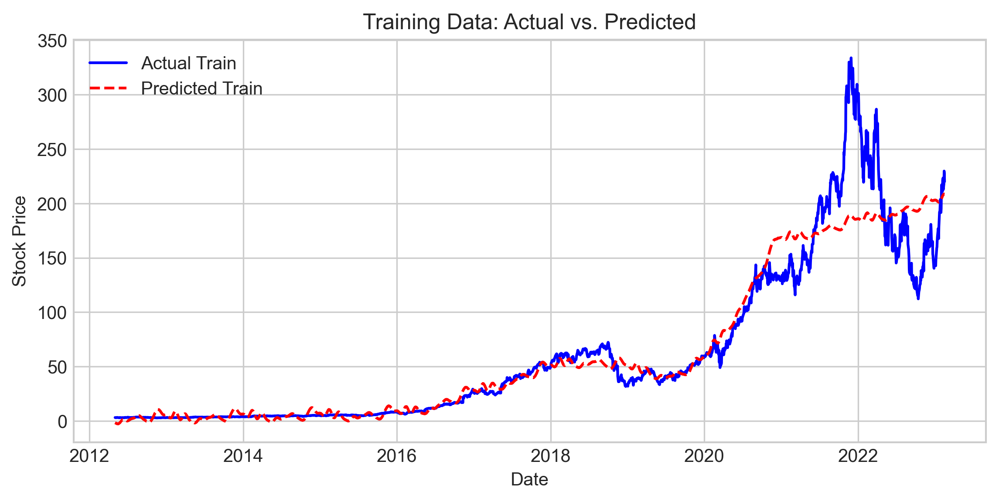

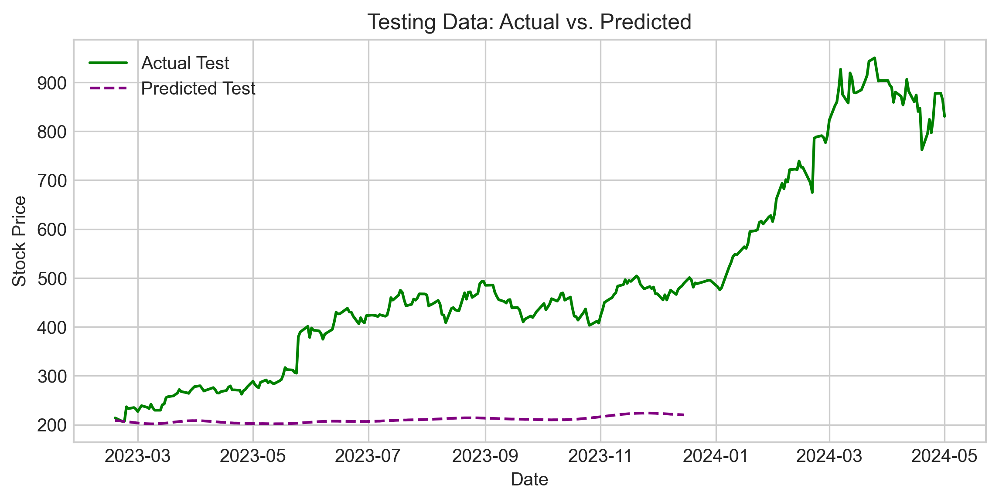

In [730]:
# Plotting training results
fig, ax = plt.subplots(figsize=(9, 4), dpi=300)
ax.plot(train_df["ds"], train_df["y"], label="Actual Train", color="blue")
ax.plot(
    future["ds"][:train_size],
    forecast["yhat"][:train_size],
    label="Predicted Train",
    color="red",
    linestyle="--",
)
ax.set_title("Training Data: Actual vs. Predicted")
ax.set_xlabel("Date")
ax.set_ylabel("Stock Price")
ax.legend()

# Plotting testing results
fig, ax = plt.subplots(figsize=(9, 4), dpi=300)
ax.plot(test_df["ds"], test_df["y"], label="Actual Test", color="green")
ax.plot(
    future["ds"][train_size:],
    preds,
    label="Predicted Test",
    color="purple",
    linestyle="--",
)
ax.set_title("Testing Data: Actual vs. Predicted")
ax.set_xlabel("Date")
ax.set_ylabel("Stock Price")
ax.legend()

plt.show()

In [731]:
# Calculate Mean Squared Error and Mean Absolute Error
mse = mean_squared_error(test_df["y"], preds)
mae = mean_absolute_error(test_df["y"], preds)
mape = mean_absolute_percentage_error(test_df["y"], preds)

print(f"Mean Squared Error             -->{mse}")
print(f"Mean Absolute Error            -->{mae}")
print(f"Mean Absolute Percentage Error -->{mape}")

Mean Squared Error             -->117081.32802437257
Mean Absolute Error            -->284.2993087597024
Mean Absolute Percentage Error -->0.5114114016420485


<br></br>
#### **Observations**

Using a pre-trained model like Facebook Prophet. The observed normalized validation MAE is significantly higher than that of the base model with three LSTM layers (128-64-64) and three Dense layers (8-8-1). Additionally, the observed MAE using prophet is significantly higher than that achieved by applying augmentation techniques or using dropout and batch normalization.

<br></br>
#### **Predicting Nvidia's stock prices for the next year**

In [558]:
model = Prophet(
    daily_seasonality=True
)  # Choose seasonality based on your data's frequency
model.fit(df_prophet)

# Create future dates of 365 days
future = model.make_future_dataframe(periods=365)

# Predict the future
forecast = model.predict(future)

DEBUG:cmdstanpy:input tempfile: /var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/27glq7_x.json
DEBUG:cmdstanpy:input tempfile: /var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/qy2f8y1x.json
DEBUG:cmdstanpy:idx 0
DEBUG:cmdstanpy:running CmdStan, num_threads: None
DEBUG:cmdstanpy:CmdStan args: ['/Users/avinash-chaluvadi/miniforge3/envs/deep-learning/lib/python3.8/site-packages/prophet/stan_model/prophet_model.bin', 'random', 'seed=16562', 'data', 'file=/var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/27glq7_x.json', 'init=/var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/qy2f8y1x.json', 'output', 'file=/var/folders/v5/h98tv59n1nb13jdykh4_dy2r0000gn/T/tmp0a2dv4tf/prophet_model3lffre14/prophet_model-20240506105222.csv', 'method=optimize', 'algorithm=lbfgs', 'iter=10000']
10:52:22 - cmdstanpy - INFO - Chain [1] start processing
INFO:cmdstanpy:Chain [1] start processing
python(79118) MallocStackLogging: can't turn off malloc stack logging becaus

             ds      yhat  yhat_lower  yhat_upper
3379 2025-04-27  0.810246    0.727313    0.894119
3380 2025-04-28  0.810117    0.724349    0.898540
3381 2025-04-29  0.808490    0.721147    0.893309
3382 2025-04-30  0.807260    0.723628    0.890476
3383 2025-05-01  0.806523    0.722231    0.892449


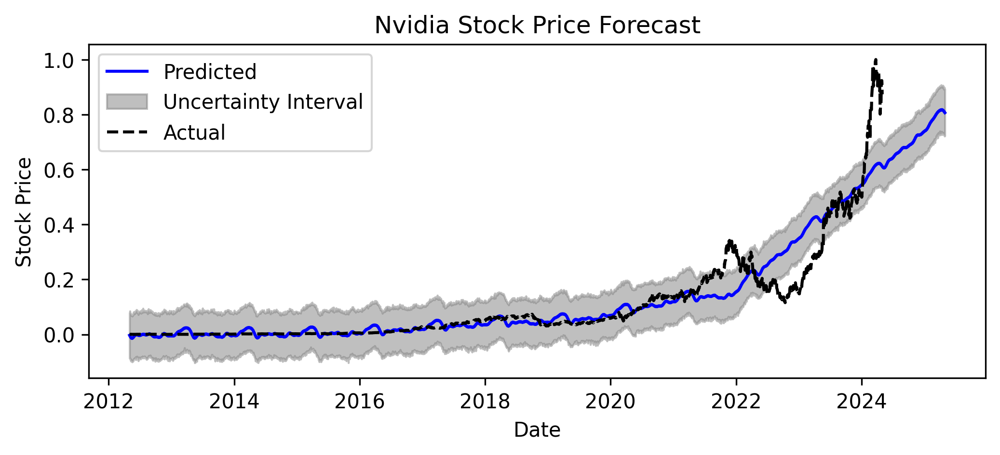

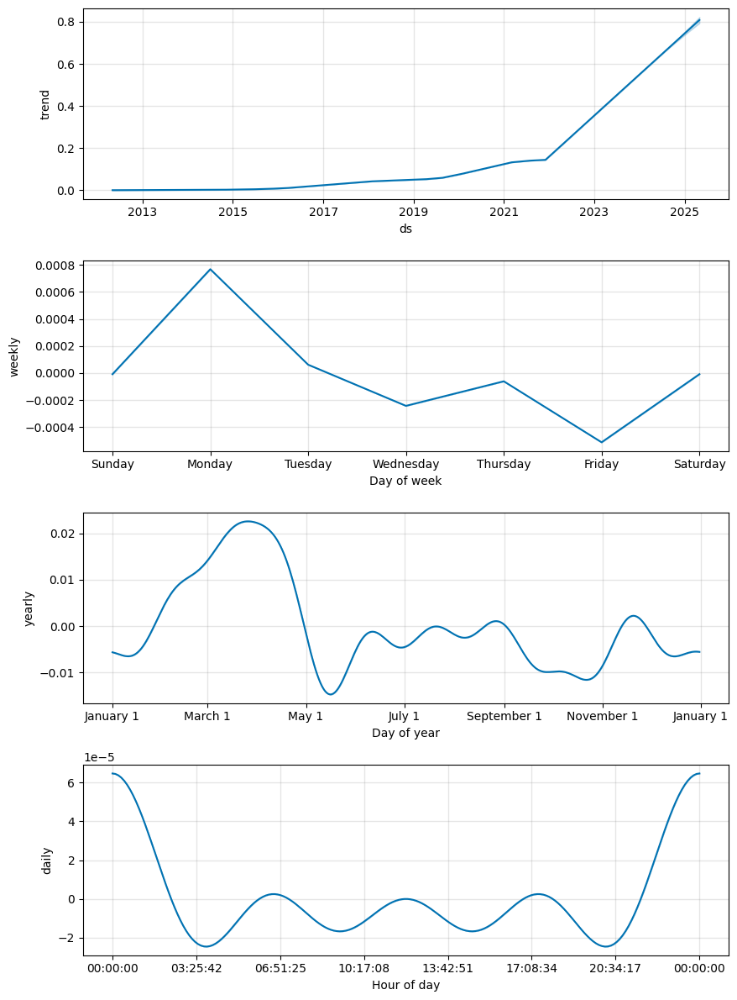

In [564]:
# Display the forecasted values
print(forecast[["ds", "yhat", "yhat_lower", "yhat_upper"]].tail())

# Plot the forecast
fig, ax = plt.subplots(figsize=(8, 3), dpi=300)
ax.plot(
    forecast["ds"], forecast["yhat"], label="Predicted", color="blue"
)  # Predicted mean
ax.fill_between(
    forecast["ds"],
    forecast["yhat_lower"],
    forecast["yhat_upper"],
    color="gray",
    alpha=0.5,
    label="Uncertainty Interval",
)  # Uncertainty interval
ax.plot(
    df_prophet["ds"], df_prophet["y"], label="Actual", color="black", linestyle="--"
)  # Optional: plot actual values if you have them

# Setting labels and titles
ax.set_title("Nvidia Stock Price Forecast")
ax.set_xlabel("Date")
ax.set_ylabel("Stock Price")

# Add legend
ax.legend()

plt.show()

# Plot the components
fig_components = model.plot_components(forecast)

<br></br>
| Model                  | Architecture                                 | Test MAE              | Test MAPE            |
|------------------------|----------------------------------------------|-----------------------|----------------------|
| Powerful Architecture  | 6 Bidirectional LSTM, 2 Dense layers         | 0.0104                | 0.046592             |
| Pretrained Model (Prophet) | None                                      | 0.3003696700815516    | 0.5148255211413744   |


<br></br>
### **Anomaly Detection - Input**

In [633]:
# Let's import anomaly detection tool kit packages
from adtk.visualization import plot
from adtk.detector import QuantileAD

In [644]:
# Remove the 'day_of_week' column from the nvidia_data_frame and store the result
nvidia_data_frame_anomaly = nvidia_data_frame.drop("day_of_week", axis=1)

# Initialize an anomaly detector that identifies outliers outside the 1st and 99th percentiles
quantile_detector = QuantileAD(low=0.01, high=0.99)

# Fit the anomaly detector to the data and detect anomalies
anomalies = quantile_detector.fit_detect(nvidia_data_frame_anomaly)

[<Axes: >]

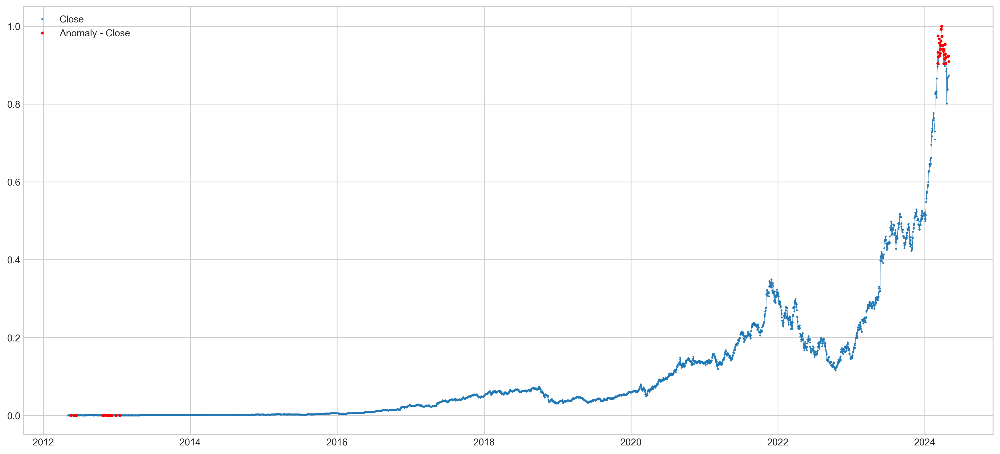

In [663]:
# Let's plot the actual prices and identify anomalies using red marker
fig, ax = plt.subplots(figsize=(18, 8), dpi=300)
plot(
    nvidia_data_frame_anomaly,
    anomaly=anomalies,
    anomaly_color="red",
    anomaly_tag="marker",
    axes=ax,
    ts_alpha=0.9,
    anomaly_markersize=2,
    anomaly_alpha=0.3,
)

<br></br>
### **Anomaly Detection - Output**

In [634]:
# Predict the test data using the best performed model
best_model_predictions = model_128_64_64_8_8_1_30_6_months_validation.predict(
    x_test_6_months
)

# Calculate the Mean Absolute Error (MAE) for each prediction compared to the true values
test_mae_loss = np.mean(np.abs(best_model_predictions - y_test_6_months), axis=1)

# Create a DataFrame from the test data, skipping the first 180 days
test_score_df = pd.DataFrame(test_data_6_months[180:])
# Add the MAE loss to the DataFrame as a new column
test_score_df["loss"] = test_mae_loss
# Set a fixed threshold for anomaly detection to 0.65
test_score_df["threshold"] = 0.65
# Determine if each data point is an anomaly by comparing the loss to the threshold
test_score_df["anomaly"] = test_score_df.loss > test_score_df.threshold

# Include the closing price of the stock for each day in the DataFrame
test_score_df["close"] = test_data_6_months[180:, 0]

# Display the DataFrame
test_score_df

4/4 [==============================] - 1s 90ms/step


,0,1,loss,threshold,anomaly,close
0,0.482176,0.25,0.216444,0.65,False,0.482176
1,0.488711,0.50,0.212720,0.65,False,0.488711
2,0.492681,0.75,0.209369,0.65,False,0.492681
3,0.507303,1.00,0.206314,0.65,False,0.507303
4,0.510312,0.00,0.199778,0.65,False,0.510312
...,...,...,...,...,...,...
116,0.869401,0.75,0.188588,0.65,False,0.869401
117,0.923277,1.00,0.194594,0.65,False,0.923277
118,0.923509,0.00,0.217660,0.65,False,0.923509
119,0.909204,0.25,0.233428,0.65,False,0.909204


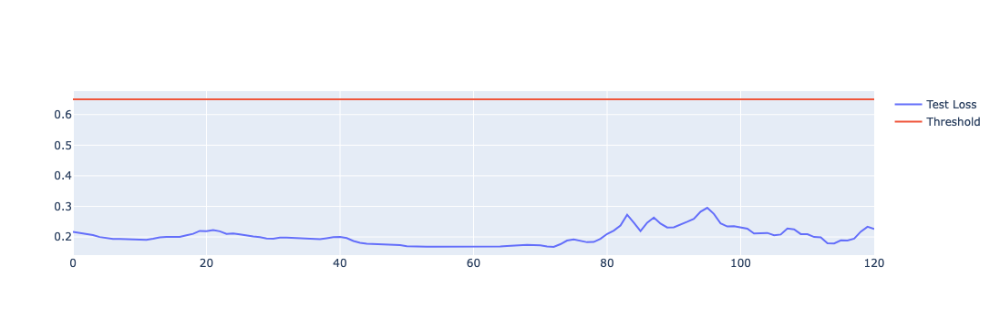

In [635]:
# Create a list of numbers from 0 to 120 to use as the number of days as x-axis values
x = list(range(121))
fig = go.Figure()

# Add a line plot for the test data loss values
fig.add_trace(go.Scatter(x=x, y=test_score_df.loss, mode="lines", name="Test Loss"))

# Add a line plot for the anomaly detection threshold
fig.add_trace(
    go.Scatter(x=x, y=test_score_df.threshold, mode="lines", name="Threshold")
)

# Configure the layout to display the legend and show the plot
fig.update_layout(showlegend=True)
fig.show()

<br></br>

**The threshold in the above plot is too high to detect anomalies on test data mean absolute error effectively. Let's reduce the threshold to 0.30 and plot again to see how the model generalizes and to further discover anomalies.**
<br></br>

In [638]:
# Set a fixed threshold for anomaly detection to 0.65
test_score_df["threshold"] = 0.25
# Determine if each data point is an anomaly by comparing the loss to the threshold
test_score_df["anomaly"] = test_score_df.loss > test_score_df.threshold

# Include the closing price of the stock for each day in the DataFrame
test_score_df["close"] = test_data_6_months[180:, 0]

# Display the DataFrame
test_score_df

,0,1,loss,threshold,anomaly,close
0,0.482176,0.25,0.216444,0.25,False,0.482176
1,0.488711,0.50,0.212720,0.25,False,0.488711
2,0.492681,0.75,0.209369,0.25,False,0.492681
3,0.507303,1.00,0.206314,0.25,False,0.507303
4,0.510312,0.00,0.199778,0.25,False,0.510312
...,...,...,...,...,...,...
116,0.869401,0.75,0.188588,0.25,False,0.869401
117,0.923277,1.00,0.194594,0.25,False,0.923277
118,0.923509,0.00,0.217660,0.25,False,0.923509
119,0.909204,0.25,0.233428,0.25,False,0.909204


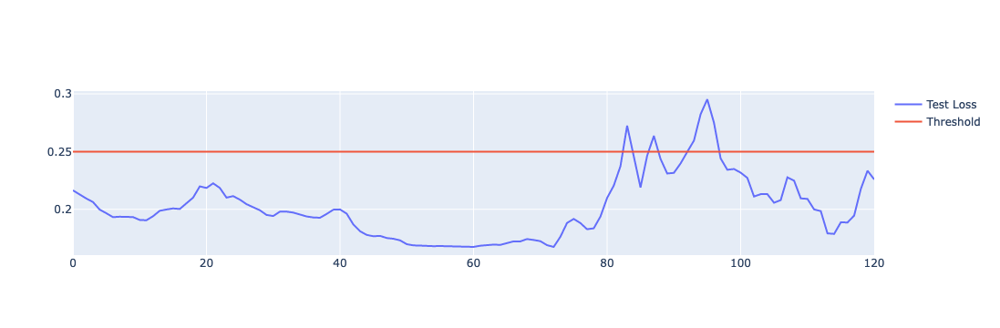

In [732]:
# Create a list of numbers from 0 to 120 to use as the number of days as x-axis values
x = list(range(121))
fig = go.Figure()

# Add a line plot for the test data loss values
fig.add_trace(go.Scatter(x=x, y=test_score_df.loss, mode="lines", name="Test Loss"))

# Add a line plot for the anomaly detection threshold
fig.add_trace(
    go.Scatter(x=x, y=test_score_df.threshold, mode="lines", name="Threshold")
)

# Configure the layout to display the legend and show the plot
fig.update_layout(showlegend=True)
fig.show()

<br></br>
### **Conclusion**

**After exploring various model architectures with different configurations of LSTM and dense layers, it is clear that the highest validation accuracy was achieved using a model comprising three LSTM layers (128-64-64) and three dense layers (8-8-1). Despite experimenting with different data augmentation techniques such as jittering, scaling the magnitude of time series trend values, and applying warping to smooth the trend, no significant improvement in validation accuracy was observed. Additionally, incorporating Batch Normalization and Dropout layers did not enhance performance. Attempts to utilize more complex architectures, including a very dense Bi-directional LSTM, led to overfitting. Moreover, employing pre-trained models like Facebook Prophet did not yield better validation results. This comprehensive assessment underscores the challenges and complexities in enhancing the predictive accuracy of stock price models for Nvidia using LSTM networks.**